<h1>Purpose of the file</h1>

To model the impact of introducing a single new clinic, from a selection of 1+ potential candidate locations, where impact is measured in terms of:
<ol>
<li>Modelled CO2e emissions generated</l1>
<li>% of the Local Authority boundary that can access at least 1 clinic location within X mins by various means of travel</l1>
<li>% of the Local Authority's 20% most deprived LSOAs (subset of 2 above) that can access at least 1 clinic location within X mins by various means of travel</l1>
<li>Sensitivity analysis to consider unmet need presentations</l1>
</ol>

<h1>Import libraries</h1>

In [1]:
import random
import matplotlib.pyplot as plt
import pandas as pd
import requests
import json
import geopandas as gpd
import numpy as np
import time
import os
import itertools
import seaborn as sns
import haversine as hs
import docx
import shapely

#libraries for mapping
import folium
from shapely.ops import unary_union
from shapely.geometry import Polygon
#from shapely.geometry import Point

#import library for base map
import contextily as cx

#import bng-latlon library to convert x y to lat long
from bng_latlon import OSGB36toWGS84

#import library to convert to x y (easting, northing) to test if this resolves the issue in core20% access change code
from bng_latlon import WGS84toOSGB36

<h1>Import files produced from running the initial SHINE tool (Stages 1 to 6)</h1>

In [2]:

#log the time the file starts running (this will be used at the end, to derive total run time for the file)
start_time = time.time()
#By default the random number generator within the random.random() function uses the current system time as the seed value. Here we set the random seed to a constant, for consistent results between runs of the model.
random.seed(42)

#read in dist matrix created previously
dist_matrix = pd.read_csv('Assets_produced_by_code\\04_Carbon_emissions_assets\\df001_DistanceMatrix.csv')

#set the lsoa_residence column from the distance matrix df as the index column
dist_matrix.set_index('lsoa_residence', inplace=True)

#convert the dist_matrix to a nested dictionary, with clinic name as the outer key, lsoa name as the outer value / inner key, and distance as the inner value.
#With an lsoa code and clinic name, we can use this dict to retrieve the previously calculated distance between lsoa and clinic location
dict_dist_matrix = dist_matrix.to_dict()

#read in patient matrix
file_path_patient_matrix = 'Assets_produced_by_code\\04_Carbon_emissions_assets\\df002_PatientMatrix.csv'


#create pandas df of the patient matrix
patient_matrix = pd.read_csv(file_path_patient_matrix)

#from patient matrix, extract just the col of all LSOA codes for the given LA - this is reliably in the first column due to logic of previously executed code
#this is a pandas series data type
all_lsoas_in_la = patient_matrix.iloc[:,0]

###

#current_directory = os.path.dirname(__file__) #changed
current_directory = os.getcwd()

#subdirectory folder names for assets folder
preprocessing_assets_path = 'Assets_produced_by_code/01_pre_processing_assets'
hea_assets_path = 'Assets_produced_by_code/02_HEA_assets'
dna_assets_path = 'Assets_produced_by_code/03_DNA_ML_assets'
carbon_emissions_assets_path = 'Assets_produced_by_code/04_Carbon_emissions_assets'

#read-in la of interest from user params file
filename = f"{current_directory}/raw_data/user_and_data_parameters/user_and_data_params.xlsx"
la_of_interest = pd.read_excel(filename, 'HEA_parameters', index_col=None, usecols = "C", header = 3, nrows=0)
la_of_interest = list(la_of_interest)[0]

apiKey = pd.read_excel(filename, 'Carbon_emissions', index_col=None, usecols = "B", header = 1, nrows=0)
apiKey = list(apiKey)[0]

#read in parameters for new clinic location(s)
df_potential_new_clinics = pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "A:E", header = 1, nrows=10)

#subset this df of clinic details to just the LA of interest
mask = df_potential_new_clinics['LocalAuthority'] == la_of_interest
df_potential_new_clinics = df_potential_new_clinics[mask]

new_clinic_location_names = list(df_potential_new_clinics.loc[:, 'clinic_name'])
new_clinic_location_postcodes = list(df_potential_new_clinics.loc[:, 'postcode'])
new_clinic_locations_num_appts = list(df_potential_new_clinics.loc[:, 'Annual capacity (no. of appointments)'])
new_clinic_locations_dna_rates = list(df_potential_new_clinics.loc[:, 'DNA_Rate'])

#add for loop to iterate over postcodes in the new_clinic_location_postcodes list and geocode these to get the coordinates
#populate the new_clinic_location_coords with these coordinates
new_clinic_location_coords = [] #need to repurpose the geocoding code and populate this list based on the postcodes in above list - still to do!

missing_lsoa_method = pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "A", skiprows=20, nrows=0).columns[0]

user_entered_wheelchair_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "A", skiprows=28, nrows=0).columns[0]))
user_entered_walking_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "B", skiprows=28, nrows=0).columns[0]))
user_entered_cycling_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "C", skiprows=28, nrows=0).columns[0]))
user_entered_driving_journey_time = int(float(pd.read_excel(filename, 'New_clinic_details', index_col=None, usecols = "D", skiprows=28, nrows=0).columns[0]))

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthe

<h2>Incorporate the user-determined method for controlling for LSOAs from which the service data set contains zero patients</h2>

The method selected influences the weights used when generating 'made-up' patients when modelling hypothetical presentations to the service, in the scenario where each given candidate location is introduced in to the array of available clinic sites. 

In [3]:
if missing_lsoa_method == "Don't replace zeros (retain value of 0)":
    missing_lsoa_method_shortened = 0
elif missing_lsoa_method == "Replace zeros with a single patient (value of 1)":
    missing_lsoa_method_shortened = 1
elif missing_lsoa_method == "Replace zeros with the nearest LSOAs values":
    missing_lsoa_method_shortened = 2

In [4]:

#create dictionary of clinic name (key) to postcode (value) - for later use when creating isochrones.
dict_new_clinic_name_to_postcode = {}
for idx in range(len(new_clinic_location_names)):
    dict_new_clinic_name_to_postcode[new_clinic_location_names[idx]] = new_clinic_location_postcodes[idx]

###

#read in parameters for new clinic location(s)
df_existing_clinics = pd.read_excel(filename, 'Clinic_details', index_col=None, usecols = "A:C", header = 1)

#subset this df of clinic details to just the LA of interest
mask = df_existing_clinics['LocalAuthority'] == la_of_interest
df_existing_clinics = df_existing_clinics[mask]

existing_clinic_location_names = list(df_existing_clinics.loc[:, 'clinic_name'])
existing_clinic_location_postcodes = list(df_existing_clinics.loc[:, 'postcode'])

#create dictionary of clinic name (key) to postcode (value) - for later use when creating isochrones for EXISTING clinics
dict_existing_clinic_to_postcode = {}
for idx in range(len(existing_clinic_location_names)):
    dict_existing_clinic_to_postcode[existing_clinic_location_names[idx]] = existing_clinic_location_postcodes[idx]

###

number_of_conditions_modelling_for = pd.read_excel(filename, 'HEA_condition_details', index_col=None, usecols = "D", header = 1, nrows=1)
number_of_conditions_modelling_for = int(number_of_conditions_modelling_for.iloc[0,0])

#read in the params defined by the user for each condition in scope. This will be used in subsequent steps to create a number of dictionaries required for HEA code to run.
#This approach removes a number of steps of user interaction with the code in the development environment, and enables separation of concerns in terms of sourcing ref material for the model 
# and actually running the model. 

df_condition_params_original = pd.read_excel(filename, 'HEA_condition_details', index_col=None, usecols = "B, C, D, E, F, G, H, I, J", header = 5, nrows=number_of_conditions_modelling_for)
df_condition_params_original = df_condition_params_original.fillna(1)

#ID the column description ised in the params file
column_names_from_condition_df = list(df_condition_params_original.columns)

#create variables containing the text for each column name from the user params df read in above. By doing this, if there is a change to the wording of the column, so long as the shape and order doesnt change
#the code will still run as we aren't hard-coding the text as a reference point.
temp_condition_col_name = column_names_from_condition_df[0]
temp_prev_type_col_name = column_names_from_condition_df[1]
temp_numerator_col_name = column_names_from_condition_df[2]
temp_denominator_col_name = column_names_from_condition_df[3]
temp_min_age_col_name = column_names_from_condition_df[4]
temp_max_age_col_name = column_names_from_condition_df[5]
temp_gender_col_name = column_names_from_condition_df[6]
temp_proportion_this_need_represents = column_names_from_condition_df[7]
temp_proportion_seen_by_this_service = column_names_from_condition_df[8]

#df_condition_params_original['prevalence_multiplier'] = df_condition_params_original[temp_numerator_col_name] / df_condition_params_original[temp_denominator_col_name]
df_condition_params_original['prevalence_multiplier'] = ((df_condition_params_original[temp_numerator_col_name] / df_condition_params_original[temp_denominator_col_name]) / df_condition_params_original[temp_proportion_this_need_represents]) * df_condition_params_original[temp_proportion_seen_by_this_service]


#rename the df cols to have shorter meaningful names rather than the instructional column names from the user params file. 
df_condition_params_original.rename(columns= {
    temp_condition_col_name: "condition", 
    temp_prev_type_col_name: "prevalence_type",
    temp_numerator_col_name: "numerator",
    temp_denominator_col_name: "denominator",
    temp_min_age_col_name: "min_age",
    temp_max_age_col_name: "max_age",
    temp_gender_col_name: "gender",
    temp_proportion_this_need_represents: "proportion_need_represents",
    temp_proportion_seen_by_this_service: "proportion_seen_by_service"
    }, 
    inplace=True)

#create variables containing the text for the shorter column names we just assigned
revised_column_names_from_condition_df = list(df_condition_params_original.columns)

condition_col_name = revised_column_names_from_condition_df[0]
prev_type_col_name = revised_column_names_from_condition_df[1]
numerator_col_name = revised_column_names_from_condition_df[2]
denominator_col_name = revised_column_names_from_condition_df[3]
min_age_col_name = revised_column_names_from_condition_df[4]
max_age_col_name = revised_column_names_from_condition_df[5]
gender_col_name = revised_column_names_from_condition_df[6]
prev_multiplier_col_name = revised_column_names_from_condition_df[9]

#create list_of_conditions variable
list_of_conditions = df_condition_params_original[condition_col_name].tolist()

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


In [5]:

###########################################################################################################

#create the full file path to where the hea assets, that were created earlier in the code, are saved
full_hea_path = f"{current_directory}/{hea_assets_path}"

#assign all the file names from that location to a list
list_all_files = os.listdir(full_hea_path)

#assign just the file names we are interested in to a subset list, that is, the files created containing the estimated met and unmet need 
#for the condition(s) we are using the tool for. 
#Nb. if you have used the tool for >1 service without clearing out the assets folders at present, this is at risk of returning all asssets with the matching 
# file name for ALL services/conditions data the tool has been run on (for all runs of the tool). As such, after each use of the tool, currently there is a 
# need to purge the asset files and save these in a different file/folder. Future development could be how to automate this step of the process. 
#For now, to control for this risk of error, the below nested list comprehension ensures ONLY the files for the conditions we are modelling for are included,
#based on the list_of_conditions variable derived above from the current version of the user_params file 
list_subset_files = [file for file in list_all_files for condition in list_of_conditions if f'_EstimatedMetAndUnmetNeed-{condition}' in file]

#test print - working
#list_subset_files

#use list comprehension to read each file path in the subset above into a dataframe and store each df in the new list
list_dfs_subset_files = [pd.read_csv(f"{full_hea_path}/{file}") for file in list_subset_files]

#create a new df into which we will sum the expressed need, unmet need, and total need from the identically structured dfs for each condition in scope.
df_merged_met_unmet = pd.DataFrame()

if len(list_dfs_subset_files) > 1:
    for df in range(len(list_dfs_subset_files)):
        temp_df = pd.DataFrame()
        temp_df['LSOACD'] = list_dfs_subset_files[df].iloc[:,:1]
        temp_df['total_expressed_need'] = list_dfs_subset_files[df].iloc[:,1]
        temp_df['total_estimated_need'] = list_dfs_subset_files[df].iloc[:,2]
        temp_df['total_unmet_need'] = list_dfs_subset_files[df].iloc[:,3]
        
        # The next line adds a col to the df to indicate the condition each row relates to. 
        # This allows duplicate lsoa codes to be fully understood, i.e. duplicate LSOA codes are 
        #legit and fine here, as they relate to different conditions, derived from the automated HEA code file.
        temp_df['condition'] = list_subset_files[df].split('-')[1].split('.')[0]
        #update the df to incorporate the current condition's met and unmet need df
        df_merged_met_unmet = df_merged_met_unmet.append(temp_df)


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2469353686.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_merged_met_unmet = df_merged_met_unmet.append(temp_df)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2469353686.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_merged_met_unmet = df_merged_met_unmet.append(temp_df)


In [6]:
###########################################################################################################

# read in CO2 emissions info from user params

#move filename to the params section
filename = f"{current_directory}/raw_data/user_and_data_parameters/user_and_data_params.xlsx"

df_proportion_travelling_each_mode_varying_distance = pd.read_excel(filename, 'emissions_values_new', skiprows=2, usecols=[0, 2,3,4,5,6])
df_proportion_travelling_each_mode_varying_distance.set_index('means_of_travel', inplace=True)
list_col_headers = list(df_proportion_travelling_each_mode_varying_distance.columns)

#populate dictionary with nested dicts, with each outer dict the distance category, 
# and each inner dict consisting of travel means (key) and proportion traveling via that travel means (value)
dict_travel_means_by_distance_travelled = {}
for distance in list_col_headers:
    dict_travel_means_by_distance_travelled[distance] = df_proportion_travelling_each_mode_varying_distance.loc[:, distance].to_dict()

#test print
#dict_travel_means_by_distance_travelled

#Source info: Carbon dioxide emissions in kg per mile per travel modality, taken from:
#https://www.gov.uk/government/publications/transport-energy-and-environment-statistics-notes-and-definitions/journey-emissions-comparisons-methodology-and-guidance

df_travel_means_kg_emissions_per_mile = pd.read_excel(filename, 'emissions_values_new', skiprows=2, usecols=[0,7])
df_travel_means_kg_emissions_per_mile.set_index('means_of_travel', inplace=True)
dict_kg_co2e_per_mile_per_travel_means = df_travel_means_kg_emissions_per_mile.to_dict()['mean_co2e_kg_per_mile_per_travel_means']

###

filename = f"{current_directory}/raw_data/user_and_data_parameters/user_and_data_params.xlsx"
user_selected_lsoa_weight_adjustment_rate = float(pd.read_excel(filename, 'New_clinic_details', skiprows=45, usecols=[0]).columns[0])
user_selected_lsoa_weight_adjustment_rate_units = pd.read_excel(filename, 'New_clinic_details', skiprows=45, usecols=[1]).columns[0]

#check whether the user has used a rate per mile. If so, convert this to km. This is because whether this dynamic adjustment is made, the code has been written in km
#(as this was the rate found when developing this file) and then converted back to miles. 
#If the user enters a rate in km, the if check doesn't do anything (as km are fine). If this is in miles, the if check converts to km ready to be used later on. 
if user_selected_lsoa_weight_adjustment_rate_units == 'mile':
    user_selected_lsoa_weight_adjustment_rate = user_selected_lsoa_weight_adjustment_rate*1.60934

#Read in the parameter to set the number of times the model will run before calculating the average results
user_selected_number_model_runs = int(pd.read_excel(filename, 'New_clinic_details', skiprows=57, usecols=[0]).columns[0])


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


<h1>Create the classes</h1>

In [7]:
##############################
# Create the classes
# First, create Class g and instantiate this as global_params. This contains all global parameters for the program/model.
class g():
    def __init__(
        self, 
        new_clinic_locations_dna_rates, 
        new_clinic_location_names, 
        new_clinic_location_postcodes, 
        new_clinic_location_coords, 
        new_clinic_locations_num_appts, 
        dict_dist_matrix, 
        apiKey, 
        num_runs, 
        user_entered_driving_journey_time,
        user_entered_cycling_journey_time,
        user_entered_walking_journey_time,
        user_entered_wheelchair_journey_time,
        user_selected_lsoa_weight_adjustment_rate
        ):

        self.new_clinic_locations_dna_rates = new_clinic_locations_dna_rates
        self.new_clinic_location_names = new_clinic_location_names
        self.new_clinic_location_postcodes = new_clinic_location_postcodes
        self.new_clinic_location_coords = new_clinic_location_coords
        self.new_clinic_locations_num_appts = new_clinic_locations_num_appts
        self.dict_dist_matrix = dict_dist_matrix
        self.apiKey = apiKey
        self.df_file_number = 1
        self.number_of_runs = num_runs
        self.list_run_num_labels = []
        self.drive_time = user_entered_driving_journey_time * 60 #multiplied by 60 because the ORS API requires an input in seconds, so 20 * 60 required for 20 mins in units of seconds.
        self.cycle_time = user_entered_cycling_journey_time * 60 #as above 
        self.walking_time = user_entered_walking_journey_time * 60 #as above
        self.wheelchair_time = user_entered_wheelchair_journey_time * 60 #as above
        #self.percent_reduced_attends_per_km = 1.5 #float representing the percent reduction in attendance for every additional km added to journey to health facility from home address
        self.percent_reduced_attends_per_km = user_selected_lsoa_weight_adjustment_rate

            
global_params = g(
    new_clinic_locations_dna_rates, 
    new_clinic_location_names, 
    new_clinic_location_postcodes, 
    new_clinic_location_coords, 
    new_clinic_locations_num_appts, 
    dict_dist_matrix, 
    apiKey, 
    user_selected_number_model_runs, #was hardcoded to 10 previously
    user_entered_driving_journey_time,
    user_entered_cycling_journey_time,
    user_entered_walking_journey_time,
    user_entered_wheelchair_journey_time,
    user_selected_lsoa_weight_adjustment_rate
    )

# Then create the Classes Lsoa and Clinic. These Class objects will represent an LSOA and a Clinic location respectively.
#Create classes for LSOA and Clinic
class Lsoa:
    def __init__(self, lsoa_id, long, lat):
        self.lsoa_id = lsoa_id
        self.long = long
        self.lat = lat

class Clinic:
    def __init__(self, clinic_name, postcode, long, lat):
        self.clinic_name = clinic_name
        self.postcode = postcode
        self.long = long
        self.lat = lat
        
# Create class for new moddelled patients: "blueprint"
#Create the New_Random_Patient class for creating made up patients
class New_Random_Patient_experimental():
    #properties / attributes
    #def __init__(self, list_lsoas, list_lsoa_weights, dna_rate, list_met_unmet_need_weights, clinic_attended_before):
    #def __init__(self, list_lsoas, list_lsoa_weights, dna_rate, weights_attended_before, clinic_names, dict_lsoa_clinic_attends_weights):
    def __init__(self, dna_rate, modelled_lsoa, clinic_attended_before, attended_before, attend_new_location, dist_original_location, dist_new_location):
        self.lsoa = modelled_lsoa #assigned lsoa
        self.dna_rate = dna_rate #modelled dna rate as float <=1
        self.clinic_attended_before = clinic_attended_before #clinic modelled to have attended before
        self.attended_before = attended_before #whether or not they have attended before
        self.attend_new_location = attend_new_location #indicates whether this patient should attend new location (should be True for all as the control flow logic is handled before the class is called
        self.dist_original_location = dist_original_location
        self.dist_new_location = dist_new_location
    

        #randomly create a float between 0 and 1
        #then use the user-provided dna rate, and check whether the random float is less than or equal to it
        #if it is, set the attended attribute to False (meaning they DNA)
        #if it is not, set the attended attribute to True (meaning they attend)
        
        if random.random() <= self.dna_rate:
            self.attended = False
        else:
            self.attended = True
        
        #then randomly assign the patient to have either "attended before" or to be a "new patient"
        #based on provided weights
        #self.attended_before = random.choices(['attended before', 'new patient'], weights_attended_before, k=1)[0]
        #self.attended_before = random.choices(['attended before', 'new patient'], [80,20], k=1)[0] #original line
        self.attended_before = attended_before


        #If the patient is assigned as having attended before, assign them to a random clinic using user-provided weights
        self.weights = dict_lsoa_clinic_attends_weights[self.lsoa]

        if self.attended_before == 'new patient':
            self.clinic_attended_before = None
            self.dist_original_location = None


<h1>Create the folder structures<h1>

In [8]:
# -----------------------------------------------------
# <<< set up folder structures >>>
# -----------------------------------------------------

# Check whether the "Assets_produced_by_code folder exists in the current directory.
# If it doesn't exist, create it with the following directory structure:
# Assets_produced_by_code (top level)
# 01_pre_processing_assets<br>
# 02_HEA_assets
# 03_DNA_ML_assets
# 04_Carbon_emissions_assets

#subdirectory folder names for assets folder
'''
preprocessing_assets_path = 'Assets_produced_by_code/01_pre_processing_assets'
hea_assets_path = 'Assets_produced_by_code/02_HEA_assets'
dna_assets_path = 'Assets_produced_by_code/03_DNA_ML_assets'
carbon_emissions_assets_path = 'Assets_produced_by_code/04_Carbon_emissions_assets'
'''

#logic to check if Assets_produced_by_code folder exists, if not, create it with subdirs too
if os.path.exists('Assets_produced_by_code') == False:
    os.makedirs('Assets_produced_by_code')
    os.makedirs(preprocessing_assets_path)
    os.makedirs(hea_assets_path)
    os.makedirs(dna_assets_path)
    os.makedirs(carbon_emissions_assets_path)
    print("New directories have been created to store the outputs from the code.")

else: 
    print("Existing 'Assets_produced_by_code' directory located.")

model_new_site_path = 'Assets_produced_by_code/05_adding_new_site_assets'
if os.path.exists(model_new_site_path) == False:
    os.makedirs(model_new_site_path)
    print("New assets sub-folder created to store modelling additional site outputs")


Existing 'Assets_produced_by_code' directory located.


<h1>Report Parameters</h1>

In [9]:
#-------------------------------------------------------
#set up report parameters
#-------------------------------------------------------
#identify current working director and location of the assets folder 
# containing output assets from the other .py files
cwd = os.getcwd()

#read-in user params file
filename = cwd+"\\raw_data/user_and_data_parameters/user_and_data_params.xlsx"

# read in the name of the service to which the analysis relates
service_name = pd.read_excel(filename, 'HEA_parameters', index_col=None, usecols = "C", header = 4, nrows=0)
service_name = list(service_name)[0]

#file path to store resized images in
resized_hea_images_path = cwd+'\\'+'Assets_produced_by_code\\05_adding_new_sites_assets\\01_Resized_Images'

#image width to use when resize map images - need to test whether the outputs looks ok in the report, but also whether this holds true for short and wide LA's as opposed 
#to derbyshire which is tall and narrow. If not, need a logic to control for this.
mywidth = 500

#set parameters for document
preferred_font_name = 'Arial'
preferred_font_size = 12
appendix_count = 1 #used for incremental numbering of appendices
figure_count = 1 #used for incremental numbering of figures / charts
table_count = 1 #used for incremental numbering of tables

#dictionaries holding values that are the string descriptors in MS Word of the default table styles.
#these can be used as input to the add_df_as_table function
dict_plain_table_styles = {
    'plain_01' : 'Table Grid',
    'plain_02' : 'Table Grid Light',
    'plain_03' : 'Plain Table 1',
    'plain_04' : 'Plain Table 2',
    'plain_05' : 'Plain Table 3',
    'plain_06' : 'Plain Table 4',
    'plain_07' : 'Plain Table 5'
}

dict_grid_table_styles = {
    'grey_01': 'Grid Table 1 Light',
    'blue_01': 'Grid Table 1 Light Accent 1',
    'orange_01': 'Grid Table 1 Light Accent 2',
    'light_grey_01': 'Grid Table 1 Light Accent 3',
    'yellow_01': 'Grid Table 1 Light Accent 4',
    'teal_01': 'Grid Table 1 Light Accent 5',
    'green_01': 'Grid Table 1 Light Accent 6',
    'grey_02': 'Grid Table 2',
    'blue_02': 'Grid Table 2 Accent 1',
    'orange_02': 'Grid Table 2 Accent 2',
    'light_grey_02': 'Grid Table 2 Accent 3',
    'yellow_02': 'Grid Table 2 Accent 4',
    'teal_02': 'Grid Table 2 Accent 5',
    'green_02': 'Grid Table 2 Accent 6',
    'grey_03': 'Grid Table 3',
    'blue_03': 'Grid Table 3 Accent 1',
    'orange_03': 'Grid Table 3 Accent 2',
    'light_grey_03': 'Grid Table 3 Accent 3',
    'yellow_03': 'Grid Table 3 Accent 4',
    'teal_03': 'Grid Table 3 Accent 5',
    'green_03': 'Grid Table 3 Accent 6',
    'grey_04': 'Grid Table 4',
    'blue_04': 'Grid Table 4 Accent 1',
    'orange_04': 'Grid Table 4 Accent 2',
    'light_grey_04': 'Grid Table 4 Accent 3',
    'yellow_04': 'Grid Table 4 Accent 4',
    'teal_04': 'Grid Table 4 Accent 5',
    'green_04': 'Grid Table 4 Accent 6',
    'grey_05': 'Grid Table 5 Dark',
    'blue_05': 'Grid Table 5 Dark Accent 1',
    'orange_05': 'Grid Table 5 Dark Accent 2',
    'light_grey_05': 'Grid Table 5 Dark Accent 3',
    'yellow_05': 'Grid Table 5 Dark Accent 4',
    'teal_05': 'Grid Table 5 Dark Accent 5',
    'green_05': 'Grid Table 5 Dark Accent 6',
    'grey_06': 'Grid Table 6 Colorful',
    'blue_06': 'Grid Table 6 Colorful Accent 1',
    'orange_06': 'Grid Table 6 Colorful Accent 2',
    'light_grey_06': 'Grid Table 6 Colorful Accent 3',
    'yellow_06': 'Grid Table 6 Colorful Accent 4',
    'teal_06': 'Grid Table 6 Colorful Accent 5',
    'green_06': 'Grid Table 6 Colorful Accent 6',
    'grey_07': 'Grid Table 7 Colorful',
    'blue_07': 'Grid Table 7 Colorful Accent 1',
    'orange_07': 'Grid Table 7 Colorful Accent 2',
    'light_grey_07': 'Grid Table 7 Colorful Accent 3',
    'yellow_07': 'Grid Table 7 Colorful Accent 4',
    'teal_07': 'Grid Table 7 Colorful Accent 5',
    'green_07': 'Grid Table 7 Colorful Accent 6'

}

dict_list_table_styles = {
    'grey_01': 'List Table 1 Light',
    'blue_01': 'List Table 1 Light Accent 1',
    'orange_01': 'List Table 1 Light Accent 2',
    'light_grey_01': 'List Table 1 Light Accent 3',
    'yellow_01': 'List Table 1 Light Accent 4',
    'teal_01': 'List Table 1 Light Accent 5',
    'green_01': 'List Table 1 Light Accent 6',
    'grey_02': 'List Table 2',
    'blue_02': 'List Table 2 Accent 1',
    'orange_02': 'List Table 2 Accent 2',
    'light_grey_02': 'List Table 2 Accent 3',
    'yellow_02': 'List Table 2 Accent 4',
    'teal_02': 'List Table 2 Accent 5',
    'green_02': 'List Table 2 Accent 6',
    'grey_03': 'List Table 3',
    'blue_03': 'List Table 3 Accent 1',
    'orange_03': 'List Table 3 Accent 2',
    'light_grey_03': 'List Table 3 Accent 3',
    'yellow_03': 'List Table 3 Accent 4',
    'teal_03': 'List Table 3 Accent 5',
    'green_03': 'List Table 3 Accent 6',
    'grey_04': 'List Table 4',
    'blue_04': 'List Table 4 Accent 1',
    'orange_04': 'List Table 4 Accent 2',
    'light_grey_04': 'List Table 4 Accent 3',
    'yellow_04': 'List Table 4 Accent 4',
    'teal_04': 'List Table 4 Accent 5',
    'green_04': 'List Table 4 Accent 6',
    'grey_05': 'List Table 5 Dark',
    'blue_05': 'List Table 5 Dark Accent 1',
    'orange_05': 'List Table 5 Dark Accent 2',
    'light_grey_05': 'List Table 5 Dark Accent 3',
    'yellow_05': 'List Table 5 Dark Accent 4',
    'teal_05': 'List Table 5 Dark Accent 5',
    'green_05': 'List Table 5 Dark Accent 6',
    'grey_06': 'List Table 6 Colorful',
    'blue_06': 'List Table 6 Colorful Accent 1',
    'orange_06': 'List Table 6 Colorful Accent 2',
    'light_grey_06': 'List Table 6 Colorful Accent 3',
    'yellow_06': 'List Table 6 Colorful Accent 4',
    'teal_06': 'List Table 6 Colorful Accent 5',
    'green_06': 'List Table 6 Colorful Accent 6',
    'grey_07': 'List Table 7 Colorful',
    'blue_07': 'List Table 7 Colorful Accent 1',
    'orange_07': 'List Table 7 Colorful Accent 2',
    'light_grey_07': 'List Table 7 Colorful Accent 3',
    'yellow_07': 'List Table 7 Colorful Accent 4',
    'teal_07': 'List Table 7 Colorful Accent 5',
    'green_07': 'List Table 7 Colorful Accent 6'
}

#code to identify the string to use for the style of the tables in the final report
table_style = pd.read_excel(filename, 'Branding', index_col=None, usecols = "C", header = 0, nrows=5)

table_style_as_string = table_style.iloc[4,0]
table_style_list = table_style_as_string.split('-')

if table_style_list[0] == ".":
    chosen_style = dict_plain_table_styles[table_style_list[1]]
elif table_style_list[0] == "grid":
    chosen_style = dict_grid_table_styles[table_style_list[1]]
elif table_style_list[0] == "list":
    chosen_style = dict_list_table_styles[table_style_list[1]]
else:
    print('An error has occured with the table style import.')

#read-in user param for level_1_colour
level_1_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 1, nrows=0)
level_1_colour = list(level_1_colour)[0]
#read-in user param for level_2_colour
level_2_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 2, nrows=0)
level_2_colour = list(level_2_colour)[0]
#read-in user param for level_2_colour
level_3_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 3, nrows=0)
level_3_colour = list(level_3_colour)[0]
#read-in user param for level_2_colour
level_4_colour = pd.read_excel(filename, 'Branding', index_col=None, usecols = "D", header = 4, nrows=0)
level_4_colour = list(level_4_colour)[0]

#dictionaries of to convert level 1-4 colour variables containing hex colours to text colour description
dict_level_1_hex_to_colour = {
    '#003087': 'dark blue',
    '#005EB8': 'blue',
    '#0072CE': 'bright blue',
    '#41B6E6': 'light blue',
    '#00A9CE': 'aqua blue',
}

dict_level_2_hex_to_colour = {
    '#768692': 'grey',
    '#E8EDEE': 'grey',
    '#231f20': 'black',
    '#425563': 'dark grey',
    '#FFFFFF': 'white',
}

dict_level_3_hex_to_colour = {
    '#006747': 'dark green',
    '#009639': 'green',
    '#78BE20': 'light green',
    '#00A499': 'green'
}

dict_level_4_hex_to_colour = {
    '#330072': 'purple',
    '#7C2855': 'dark pink',
    '#AE2573': 'pink',
    '#8A1538': 'dark red',
    '#DA291C': 'red',
    '#ED8B00': 'orange',
    '#FFB81C': 'yellow',
    '#FAE100': 'yellow',
}


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c

<h1>Define Functions</h1>

In [10]:
def save_df_to_csv(df, class_to_update, file_name, file_path, index_bool):
    """
    Function to save DataFrames as csv files, using standardised incremental file naming. 
    The function updates the global_params class df_file_number attribute by 1 each time it is called.
    """      
    if class_to_update.df_file_number <= 9:
            file_location = f"{file_path}\\{file_name}_00{class_to_update.df_file_number}.csv"
    elif class_to_update.df_file_number <= 99:
        file_location = f"{file_path}\\{file_name}_0{class_to_update.df_file_number}.csv"
    else:
        file_location = f"{file_path}\\{file_name}_{class_to_update.df_file_number}.csv"
    
    df.to_csv(file_location, index = index_bool)
    class_to_update.df_file_number += 1

In [11]:
def identify_neighbours(target, boundaries_LSOA, df_lsoa_to_utla, la_of_interest):
    
    """
    Function to identify neighbour geometries that have a boundary that touches a target geometry.
    """

    target_lsoa_geometry = boundaries_LSOA.loc[boundaries_LSOA['LSOA11CD'] == target,'geometry'].squeeze()

    df_merged = df_lsoa_to_utla.merge(boundaries_LSOA, on='LSOA11CD', how='left') 
    mask = df_merged['UTLA21NM'] == la_of_interest
    df_merged_filtered = df_merged[mask]
    df_geodata = gpd.GeoDataFrame(df_merged_filtered).reset_index()

    # create list of all lsoas and check against each lsoa
    # display list of lsoas that touch not number of them

    list_touches = df_geodata.touches(target_lsoa_geometry)
    list_lsoas = list(df_geodata['LSOA11CD'])

    neighbour_indices  = [index for (index, item) in enumerate(list_touches) if item == True]

    #[1, 3, 5]
    #neighbouring_lsoas = [list_lsoas[index] for index in neighbour_indices] ## this is the output to use in the programme, a list of the lsoas that surround target

    #subset_for_plot = df_geodata.loc[df_geodata['LSOA11CD'].isin(neighbouring_lsoas)]

    #test plot to visually check we have identified 'touching' LSOAs - working with E01013461
    #plot_subset = subset_for_plot.plot(figsize=(15, 15), legend = True)
    #plot_subset.set_axis_off()

    neighbour_lsoa_codes = [list_lsoas[idx] for idx in neighbour_indices]

    return(neighbour_lsoa_codes)

In [12]:
def create_dict_min_distance_lsoa_to_target(list_zero_lsoa_codes, dist_matrix):
    
    """
    define function to identify the maximum value across a row of a df, and return column name, for all 
    lsoa codes in a provided list. Return result(s) as a dictionary, with target lsoa as key and the string lsoa 
    code as value.
    """

    dict_nearest_non_zero_lsoa_to_target = {target_lsoa: dist_matrix.loc[target_lsoa].idxmin() for target_lsoa in list_zero_lsoa_codes}
    return dict_nearest_non_zero_lsoa_to_target

In [13]:
# The next function takes in the blank haversine distance matrix structured as 
#zero lsoa codes for col names and non-zero lsoa codes for index/rows. 
#This function loops over each combination of col/row to derive the haversine 
#distance between each point. It returns these values as a dictionary, with the
# key being the zero lsoa code and the values a list of haversince distances to 
#all non-zero lsoas in the order they are presented in the original blank 
#haversince matrix. This returned dictionary can then be used to update / populate the haversine matrix in a subsequent step.

def get_haversine_distances_in_miles(haversine_dist_matrix, df_lsoa_pop_weight_centroid_to_utla, lsoa11cd_col_str):

    """
    Function to take in the blank haversine distance matrix structured as zero lsoa codes for col names 
    and non-zero lsoa codes for index/rows. This function loops over each combination of col/row to derive the haversine 
    distance between each point. It returns these values as a dictionary, with the key being the zero lsoa code and the 
    values a list of haversince distances to all non-zero lsoas in the order they are presented in the original 
    blank haversince matrix.
    This returned dictionary can then be used to update / populate the haversine matrix in a subsequent step.
    """


    #loop over all non-zero lsoa and zero lsoa combinations, then derive haversine distance, then update df with this distance
    #uses logic outlined in: https://towardsdatascience.com/calculating-distance-between-two-geolocations-in-python-26ad3afe287b

    dict_missing_lsoa_code_list_haver_dist = {}

    for col in haversine_dist_matrix.columns:
        #list to populate with the distances for each col / row combination
        zero_lsoa_col_distances = []

        #code block to locate the WGS84 coordinates for the zero lsoa (column label) we are on at this stage in the loop
        temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla[lsoa11cd_col_str] == col] #create a temp df of just the lsoa in scope at this point; was == lsoa before, poss source of bug, changed to == col
        x = pd.DataFrame(temp_df['x']).values[0][0] #extract x coords
        y = pd.DataFrame(temp_df['y']).values[0][0] #extract y coords
        zero_lsoa_coords = (OSGB36toWGS84(x, y)) #convert these x, y coords to WGS84 

        for row in haversine_dist_matrix.itertuples():
            #print(f"{col} - {row[0]}") #test print to show this is locating the combination of col header and row, working
            temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla[lsoa11cd_col_str] == row.Index] #create a temp df of just the lsoa in scope at this point
            x = pd.DataFrame(temp_df['x']).values[0][0] #extract x coords
            y = pd.DataFrame(temp_df['y']).values[0][0] #extract y coords
            not_zero_row_coords = (OSGB36toWGS84(x, y)) #convert these x, y coords to WGS84 

            #calculate the haversine distance between the two pop weight centroid points, in miles
            distance = hs.haversine(zero_lsoa_coords, not_zero_row_coords, unit=hs.Unit.MILES) #remove unit=hs.unit.MILES if km required, as km is the default unit.
            
            #append distance to list
            zero_lsoa_col_distances.append(distance)
        
        #update the dictionary
        dict_missing_lsoa_code_list_haver_dist[col] = zero_lsoa_col_distances

    return(dict_missing_lsoa_code_list_haver_dist)

In [14]:
# function to run the model - to be called within a loop if the model is to be run multiple times with results averaged

#creating a function for the model, which we can then call in a loop to get results over a series of runs
def run_model(
    list_weights_new_patient, 
    new_clinic_location_names, 
    matrix_to_df_copy, 
    new_clinic_locations_num_appts, 
    list_lsoas, 
    list_lsoa_weights, 
    dict_lsoa_clinic_attends_weights,
    clinic_names,
    dict_dist_matrix,
    dict_weight_new_patient,
    new_clinic_locations_dna_rates
    ):

    """
    Function to run the model, create simulated patients with random features based on provided weights, derived from the original data. 
    When calling this function, need to use:
        global_params.new_clinic_locations_num_appts for new_clinic_locations_num_appts argument
        global_params.new_clinic_locations_dna_rates for new_clinic_locations_dna_rates argument
    """

    dict_modelled_patients = {}

    for list_of_weights in list_weights_new_patient:

        #create a list which will be populated with lists. Each nested list will consist of all randomly modelled patients attending each clinic being modelled, in the order of clinics in global_params.new_clinic_location_names. 
        list_of_all_clinic_attendances = []

        #loop through each new location
        for num in range(len(new_clinic_location_names)):
            
            #create a list to contain all modelled patients for THIS location (i.e. the current iteration of the outer for loop)
            list_patients_attending_this_clinic = []
            
            new_clinic_dist_matrix = pd.DataFrame(matrix_to_df_copy.loc[:, new_clinic_location_names[num]])


            #loop through the number of appointments in the appointment capacity parameter for this given clinic, and populate those appointments with randomly derived patients using the New_Random_Patient class
            counter = 0
            while counter < new_clinic_locations_num_appts[num]:  #global_params.new_clinic_locations_num_appts
            #for appointment_number in range(global_params.new_clinic_locations_num_appts[num]): #hardcoding for 5 appointment capacity - replace with the actual capacity for given clinic being modelled in this loop iteration once simplified version working
                
                #Step 1: assign random LSOA
                modelled_lsoa = random.choices(list_lsoas, list_lsoa_weights, k=1)[0]
                #retrieve the list containing the number of patients attending each clinic, in order, from the modelled lsoa. 
                #use this as the weights to assign this modelled patient to a historical clinic location.
                weights = dict_lsoa_clinic_attends_weights[modelled_lsoa]

                #step 2: assign legacy clinic
                clinic_attended_before = random.choices(clinic_names, weights, k=1)[0]

                #step 3: check whether legacy clinic < new clinic
                dist_original_location = dict_dist_matrix[clinic_attended_before][modelled_lsoa]
                dist_new_location = new_clinic_dist_matrix.loc[modelled_lsoa][0]
                

                #assign a Bool value to indicate whether the made-up patient is modelled to attend the new location (True) or not (False). 
                #The logic is simply if the distance to the new location is less than the distance to the original location they were modelled to have attended previously,
                #then assume they will accept the appointment at the new location (they may still be modelled to DNA this appointment at the new location)
                attend_new_location = dist_new_location < dist_original_location

                #step 4: if above True, then create a New_Random_Patient_experimental object by passing:
                #1) lsoa
                #2) legacy clinic
                #3) new clinic
                            
                if attend_new_location == True:
                    #randomly determine whether this patient is a new patient (unit of unmet need) or has attended before. 
                    #do this using the sensitivity analysis weights derived earlier in the file. Sensitivity analysis approach 
                    #used here as often we dont know the proportion of new patients that will access a new outlet. 
                    attended_before = random.choices(['new patient', 'attended before'], dict_weight_new_patient[list_of_weights], k=1)[0] 
                    #patient = New_Random_Patient_experimental(list_lsoas, list_lsoa_weights, global_params.new_clinic_locations_dna_rates[num], clinic_names, dict_lsoa_clinic_attends_weights, dict_dist_matrix, new_clinic_dist_matrix, dict_weight_new_patient[list_of_weights])
                    patient = New_Random_Patient_experimental(new_clinic_locations_dna_rates[num], modelled_lsoa, clinic_attended_before, attended_before, attend_new_location, dist_original_location, dist_new_location)

                #append the newly created random patient to the list of patients attending THIS clinic
                    counter += 1
                    list_patients_attending_this_clinic.append(patient)

            #append the list of ALL patients modelled to attend THIS clinic to the outer list of ALL clinics.
            #This outer list will then contain X number of nested lists (one for each clinic being modelled), each containing a randomly modelled number of Y randomly modelled patient objects (one for 
            # each appointment for that clinic according to the global parameters)
            list_of_all_clinic_attendances.append(list_patients_attending_this_clinic)
        
        #update the outer dictionary with a list of modelled patients for each clinic, for the given sensitivity analysis weighting for new patients vs. existing patients.
        dict_modelled_patients[list_of_weights] = list_of_all_clinic_attendances
    
    #convert the dictionary from each combination to a df which we can then use to check / validate
    dict_df_for_each_weight = {}

    for list_of_weights in list_weights_new_patient:
        temp_dict_clinic_to_patients = {}
        
        for num in range(len(new_clinic_location_names)):
            temp_df = pd.DataFrame([vars(s) for s in dict_modelled_patients[list_of_weights][num]])
            temp_dict_clinic_to_patients[new_clinic_location_names[num]] = temp_df

        dict_df_for_each_weight[list_of_weights] = temp_dict_clinic_to_patients


    return(dict_modelled_patients, dict_df_for_each_weight)


In [15]:
#Function to produce a nested dictionary of the miles travelled for each clinic / new pt weight / model run

def create_dict_miles_per_dist_category_and_emissions(
    dict_processed_patient_matrix_for_each_weight,
    list_run_num_labels,
    list_weights_new_patient,
    new_clinic_location_names,
    dist_matrix_new_locations,
    dict_kg_co2e_per_mile_per_travel_means,
    dict_travel_means_by_distance_travelled
    ):
    
    """
    Function to produce a nested dictionary of the miles travelled for each clinic / new pt weight / model run
    """

    dict_miles_per_dist_category_all_scenarios = {}
    dict_total_emissions_estimate_per_dist_category_all_scenarios = {}
    dict_df_summary_carbon_estimate_per_dist_category_all_scenarios = {}
    dict_df_co2e_for_paper_per_dist_category_all_scenarios = {}
    
    for run_num in list_run_num_labels:
        temp_dict_weight_scenario_clinics = {}
        temp_dict_weight_scenario_total_emissions_estimate = {}
        temp_dict_weight_scenario_df_summary_carbon_estimate = {}
        temp_dict_weight_scenario_df_co2e_for_paper = {}
        

        for new_pt_weight in list_weights_new_patient:
            temp_clinic_to_dict_miles = {} #inner most dict contains distance in miles
            temp_clinic_to_total_emissions_estimate = {} #inner most dict contains total estimated emissions for that combination in the model
            temp_clinic_to_df_summary_carbon_estimate = {} #inner most dict contains df summary of carbon estimates
            temp_clinic_to_df_co2e_for_paper = {} #inner most dict contains df formatted for publication

            for clinic in new_clinic_location_names:

                temp_pt_matrix = dict_processed_patient_matrix_for_each_weight[run_num][new_pt_weight][clinic]
                temp_dist_matrix = pd.DataFrame(dist_matrix_new_locations[clinic])

                list_of_errors = []
                sum_pts_error_lsoas = 0

                #set up lists to populate with the distances travelled
                list_dist_less_than_1_mile = []
                list_dist_1_to_2_miles = []
                list_dist_2_to_5_miles = []
                list_dist_5_to_10_miles = []
                list_dist_more_than_10_miles = []

                #set up lists to populate with the patients that travelled the distances in each category
                list_patients_less_than_1_mile = []
                list_patients_1_to_2_miles = []
                list_patients_2_to_5_miles = []
                list_patients_5_to_10_miles = []
                list_patients_more_than_10_miles = []

                #populate lists with tuples consisting of the index and column label for all cells 
                #currently hardcoded to distance <1 miles in the nested for loop below
                list_less_than_1_mile_coords = []
                #currently hardcoded to distance 1-2 miles in the nested for loop below
                list_1_to_2_miles_coords = []
                #currently hardcoded to distance 2-5 miles in the nested for loop below
                list_2_to_5_miles_coords = []
                #currently hardcoded to distance 5-10 miles in the nested for loop below
                list_5_to_10_miles_coords = []
                #currently hardcoded to distance >=10 miles in the nested for loop below
                list_more_than_10_miles_coords = []

                #for col in pd.DataFrame(dist_matrix_new_locations[clinic]): #change this when in function to the given clinic the loop is on at this point
                for i, row_value in temp_dist_matrix.iterrows():
                    #df[col][i] = row_value * df['views'][i]
                    dist_matrix_cell_value = row_value[0]

                    if dist_matrix_cell_value < 1:
                        list_dist_less_than_1_mile.append(dist_matrix_cell_value)
                        list_less_than_1_mile_coords.append((i, row_value))
                        patient_num  = temp_pt_matrix.loc[i][0] 
                        list_patients_less_than_1_mile.append(patient_num)

                    elif dist_matrix_cell_value <2:
                        list_dist_1_to_2_miles.append(dist_matrix_cell_value)
                        list_1_to_2_miles_coords.append((i, row_value))
                        patient_num  = temp_pt_matrix.loc[i][0]
                        list_patients_1_to_2_miles.append(patient_num)

                    elif dist_matrix_cell_value <5:
                        list_dist_2_to_5_miles.append(dist_matrix_cell_value)
                        list_2_to_5_miles_coords.append((i, row_value))
                        patient_num  = temp_pt_matrix.loc[i][0]
                        list_patients_2_to_5_miles.append(patient_num)

                    elif dist_matrix_cell_value <=10:
                        list_dist_5_to_10_miles.append(dist_matrix_cell_value)
                        list_5_to_10_miles_coords.append((i, row_value))
                        patient_num  = temp_pt_matrix.loc[i][0]
                        list_patients_5_to_10_miles.append(patient_num)

                    elif dist_matrix_cell_value > 10:
                        list_dist_more_than_10_miles.append(dist_matrix_cell_value)
                        list_more_than_10_miles_coords.append((i, row_value))
                        patient_num  = temp_pt_matrix.loc[i][0]
                        list_patients_more_than_10_miles.append(patient_num)
                    
                    else:
                        #print("value not accounted for in if-elif-loop")
                        list_of_errors.append(i)
                        patient_num  = temp_pt_matrix.loc[i][0]
                        sum_pts_error_lsoas += patient_num

                #convert the patient lists to numpy arrays
                list_patients_less_than_1_mile = np.array(list_patients_less_than_1_mile)
                list_patients_1_to_2_miles = np.array(list_patients_1_to_2_miles)
                list_patients_2_to_5_miles = np.array(list_patients_2_to_5_miles)
                list_patients_5_to_10_miles = np.array(list_patients_5_to_10_miles)
                list_patients_more_than_10_miles = np.array(list_patients_more_than_10_miles)

                #convert the lists to arrays to allow multiplication
                list_dist_less_than_1_mile = np.array(list_dist_less_than_1_mile)
                list_dist_1_to_2_miles = np.array(list_dist_1_to_2_miles)
                list_dist_2_to_5_miles = np.array(list_dist_2_to_5_miles)
                list_dist_5_to_10_miles = np.array(list_dist_5_to_10_miles)
                list_dist_more_than_10_miles = np.array(list_dist_more_than_10_miles)

                #derive the estimated CO2e for each group. first create and populate a dictionary with the summed miles travelled by patients in each distance category derived above
                dict_total_miles_all_pts_per_distance_category = {}
                dict_total_miles_all_pts_per_distance_category['less than 1 mile'] = (list_patients_less_than_1_mile * list_dist_less_than_1_mile).sum()
                dict_total_miles_all_pts_per_distance_category['1-2 miles'] = (list_patients_1_to_2_miles * list_dist_1_to_2_miles).sum()
                dict_total_miles_all_pts_per_distance_category['2-5 miles'] = (list_patients_2_to_5_miles * list_dist_2_to_5_miles).sum()
                dict_total_miles_all_pts_per_distance_category['5-10 miles'] = (list_patients_5_to_10_miles * list_dist_5_to_10_miles).sum()
                dict_total_miles_all_pts_per_distance_category['> 10 miles'] = (list_patients_more_than_10_miles * list_dist_more_than_10_miles).sum()

                #if len(list_of_errors) > 0:
                #    print(f"There were {len(list_of_errors)} LSOAs without a distance in the distance matrix. The effect on emissions for journeys from these LSOAs will not be taken into account. The total number of patient journeys excluded as a result is {sum_pts_error_lsoas}.")

                temp_clinic_to_dict_miles[clinic] = dict_total_miles_all_pts_per_distance_category

                # ------------------------------------------------------------------------------
                #set up the lists containing the values we will loop over shortly to derive the CO2e estimate
                list_distance_categories = list(dict_travel_means_by_distance_travelled.keys())
                list_travel_means = list(dict_kg_co2e_per_mile_per_travel_means.keys())

                #now quantify estimated emissions for each travel means
                #dict_travel_mode_emissions = {}
                bicycle = 0
                bus = 0
                car = 0
                motorcycle = 0
                train = 0
                walking = 0

                list_carbon_table_data = []
                total_emissions = 0
                for dist_category in list_distance_categories:
                    for travel_means in list_travel_means:
                        co2e_for_travel_means_and_distance_combination = (dict_total_miles_all_pts_per_distance_category[dist_category] * dict_travel_means_by_distance_travelled[dist_category][travel_means]) * dict_kg_co2e_per_mile_per_travel_means[travel_means]
                        
                        #populate a list consisting of distance category, travel means/modality, proportion travelling via this means for this distance/travel mode combination
                        #the estimated number of miles travelled via this means, and the emissions factor used for this travel means.
                        new_data_line = [dist_category, travel_means, dict_travel_means_by_distance_travelled[dist_category][travel_means], dict_total_miles_all_pts_per_distance_category[dist_category] * dict_travel_means_by_distance_travelled[dist_category][travel_means], dict_kg_co2e_per_mile_per_travel_means[travel_means]]
                        #appened the above to the list_carbon_table_data. This will become a list of lists, which we will subsequently turn into a dataframe.
                        list_carbon_table_data.append(new_data_line)
                        
                        if travel_means == 'Bicycle':
                            bicycle += co2e_for_travel_means_and_distance_combination
                        elif travel_means == 'Bus':
                            bus += co2e_for_travel_means_and_distance_combination
                        elif travel_means == 'car/taxi':
                            car += co2e_for_travel_means_and_distance_combination
                        elif travel_means == 'Motorcycle':
                            motorcycle += co2e_for_travel_means_and_distance_combination
                        elif travel_means == 'Train':
                            train += co2e_for_travel_means_and_distance_combination
                        elif travel_means == 'Walking':
                            walking += co2e_for_travel_means_and_distance_combination
                        else:
                            pass

                        total_emissions += co2e_for_travel_means_and_distance_combination

                #update outer dict for return value of total_emissions
                temp_clinic_to_total_emissions_estimate[clinic] = total_emissions
                #dict_total_emissions[weight] = total_emissions

                dict_emissions_per_travel_means = {'Bicycle': bicycle,
                    'Bus': bus,
                    'car/taxi': car,
                    'Motorcycle': motorcycle,
                    'Train': train,
                    'Walking': walking}
                
                #now produce a summary df of the carbon estimate
                col_names = ['distance_category', 'travel_mode', 'proportion_using_this_mode', 'miles_travelled', 'co2e_estimate']
                df_summary_carbon_estimate = pd.DataFrame(list_carbon_table_data, columns=col_names)
                #df_summary_carbon_estimate
                
                #update outer dict for return value
                #dict_df_summary_carbon_estimate[weight] = df_summary_carbon_estimate
                temp_clinic_to_df_summary_carbon_estimate[clinic] = df_summary_carbon_estimate

                #now produce a summary table
                df_co2e_for_paper = pd.DataFrame(dict_emissions_per_travel_means, index=[0]).transpose()
                df_co2e_for_paper.rename(columns={0: 'CO2e_estimate'}, inplace=True)
                #df_co2e_for_paper
                
                #update outer dict for return value
                #dict_df_co2e_for_paper[weight] = df_co2e_for_paper
                temp_clinic_to_df_co2e_for_paper[clinic] = df_co2e_for_paper

            #return(dict_total_miles_all_pts_per_distance_category, df_summary_carbon_estimate, df_co2e_for_paper, total_emissions) #TO DO - need to put total_emissions into a dict, same for all outputs, wiht key being the new patient weight
            #return(dict_nested_dict_total_miles_all_pts_per_distance_category, dict_df_summary_carbon_estimate, dict_df_co2e_for_paper, dict_total_emissions) #TO DO - need to put total_emissions into a dict, same for all outputs, wiht key being the new patient weight

                # ------------------------------------------------------------------------------
    
            temp_dict_weight_scenario_total_emissions_estimate[new_pt_weight] = temp_clinic_to_total_emissions_estimate
            temp_dict_weight_scenario_df_summary_carbon_estimate[new_pt_weight] = temp_clinic_to_df_summary_carbon_estimate
            temp_dict_weight_scenario_df_co2e_for_paper[new_pt_weight] = temp_clinic_to_df_co2e_for_paper
            temp_dict_weight_scenario_clinics[new_pt_weight] = temp_clinic_to_dict_miles

        dict_total_emissions_estimate_per_dist_category_all_scenarios[run_num] = temp_dict_weight_scenario_total_emissions_estimate
        dict_df_summary_carbon_estimate_per_dist_category_all_scenarios[run_num] = temp_dict_weight_scenario_df_summary_carbon_estimate
        dict_df_co2e_for_paper_per_dist_category_all_scenarios[run_num] = temp_dict_weight_scenario_df_co2e_for_paper
        dict_miles_per_dist_category_all_scenarios[run_num] = temp_dict_weight_scenario_clinics

    return(dict_miles_per_dist_category_all_scenarios, dict_df_co2e_for_paper_per_dist_category_all_scenarios, dict_df_summary_carbon_estimate_per_dist_category_all_scenarios, dict_total_emissions_estimate_per_dist_category_all_scenarios, list_of_errors)
        

In [16]:

def impute_zero_lsoas_with_nearest_lsoa_values(
    dfA_lsoas_patients_seen_from,
    dfB_target_lsoas_with_zero_patients_seen,
    df_total_pts_seen_from_each_lsoa_all,
    df_lsoa_pop_weight_centroid_to_utla,
    patient_matrix_clone,
    impute_method
    ):
    
    """
    Function to impute values for LSOAs where zero patients attended ANY clinic in reality. 
    This is done according to the user-chosen method, which can be 1 of 3 methods:
    1. do nothing - retain all as 0s
    2. replace all 0 values with a nominal value of 1 patient
    3. replace all 0 values with the values from the nearest non-zero LSOA
    
    Returns 2 dataframes. These are:
    1. A patient matrix consisting of LSOAs (rows), clinic names (columns) and total patients attending each clinic from each LSOA (cell values)
    2. As per 1, but including the total column across the rows.
    """

    if impute_method == 0:
        #do not impute any values, retain 0s. Essentially, in this stage, reattach the split dfs back to a whole df without doing anything to transform the data they contain.
        dfA_patient_matrix_clone_non_zero = patient_matrix_clone[patient_matrix_clone['total'] != 0]
        dfA_patient_matrix_clone_non_zero.set_index('lsoa_residence', inplace=True)
        dfB_patient_matrix_clone_zero = patient_matrix_clone[patient_matrix_clone['total'] == 0]
        dfB_patient_matrix_clone_zero.set_index('lsoa_residence', inplace=True)

        #dfC_patient_matrix_clone_interpolated = dfA_lsoas_patients_seen_from.append(dfB_target_lsoas_with_zero_patients_seen)
        dfC_patient_matrix_clone_interpolated = dfA_patient_matrix_clone_non_zero.append(dfB_patient_matrix_clone_zero)
    elif impute_method == 1:
        
        dfA_patient_matrix_clone_non_zero = patient_matrix_clone[patient_matrix_clone['total'] != 0]
        dfA_patient_matrix_clone_non_zero.set_index('lsoa_residence', inplace=True)
        dfB_patient_matrix_clone_zero = patient_matrix_clone[patient_matrix_clone['total'] == 0]
        dfB_patient_matrix_clone_zero.set_index('lsoa_residence', inplace=True)
        
        #get a lst of all the column labels
        list_all_cols = dfB_patient_matrix_clone_zero.columns
        #get all cols except total col in last position
        list_cols_to_replace = list_all_cols[:-1]
        
        #create a version of dfB without the total column
        dfB_patient_matrix_clone_zero_no_total_col = dfB_patient_matrix_clone_zero[list_cols_to_replace]

        #replace the 0 values with the nominal value of 1 patient attending each clinic
        dfB_patient_matrix_clone_zero_no_total_col.replace({0:1}, inplace=True)
        
        #add the total column back in. The value will the equivalent to the number of clinics in the service.
        dfB_patient_matrix_clone_zero = dfB_patient_matrix_clone_zero_no_total_col.copy(deep=True)
        dfB_patient_matrix_clone_zero['total'] = dfB_patient_matrix_clone_zero.sum(axis=1)
                
        #concatenate the original non-zero dfA with the new interpolated non-zero dfB as a combined dfC
        #this gives us a new df with the df of interpolated values appended to the original non zero df.
        # This is a complete df for ALL lsoas, all of which have a total greater than 0.
        #with the original zero values having a value of 1 patient attending each clinic, and a total number of patients equivalent to number of clinic locations present in the dataset.
        #dfC_patient_matrix_clone_interpolated = dfA_lsoas_patients_seen_from.append(dfB_target_lsoas_with_zero_patients_seen)

        dfC_patient_matrix_clone_interpolated = dfA_patient_matrix_clone_non_zero.append(dfB_patient_matrix_clone_zero)

    elif impute_method == 2:
        #impute using haversine nearest neighbour method
        #outside the function, check how many LSOAs are 0. If >0, then nested if statement to run relevant logic based on user selection for how to handle 0 lsoas
        #------------------------------------------------------------------------------
        #Step 1: find the "target" LSOAs from which the service has seen zero patients
        #------------------------------------------------------------------------------

        #Step 2: split the df_total_pts_seen_from_each_lsoa_all dataframe into 2 dataframes, so that we have:
        #df A: consisting of total number patients per lsoa, with all totals >0
        #df B: consisting of total number patients per lsoa, with all totals == 0 (this is the df we will subsequently interpolate values for)
        number_lsoas_with_zero_patients = (df_total_pts_seen_from_each_lsoa_all['total'] == 0).sum()

        interpolation_required = False

        if number_lsoas_with_zero_patients > 0:
            interpolation_required = True
            
            #identify the zero LSOAs and create a list containing the lsoa code for any lsoas from which zero patients attended the service
            mask = (df_total_pts_seen_from_each_lsoa_all['total'] == 0)
            list_lsoas_no_attends = list(df_total_pts_seen_from_each_lsoa_all[mask]['lsoa_residence'])
            #list_lsoas_no_attends
            
            #feedback to the user whether interpolation is required or not
            if number_lsoas_with_zero_patients == 1:
                print("There was 1 LSOA from which the service saw zero patients. Interpolation is required for this LSOA. This was:")
                print(list_lsoas_no_attends[0])
            else:
                print(f"There were {number_lsoas_with_zero_patients} LSOAs from which the service saw zero patients. Interpolation is required for these LSOAs. These were:")
                for lsoa in list_lsoas_no_attends:
                    print(lsoa)

            #create dfA for non-zero LSOAs
            mask = df_total_pts_seen_from_each_lsoa_all['total'] != 0
            dfA_lsoas_patients_seen_from = df_total_pts_seen_from_each_lsoa_all[mask]
            
            #create dfB for zero LSOAs
            mask = df_total_pts_seen_from_each_lsoa_all['total'] == 0
            dfB_target_lsoas_with_zero_patients_seen = df_total_pts_seen_from_each_lsoa_all[mask]

        #------------------------------------------------------------------------------
        #Step 3: Loop through the targets with 0 patients from dfB above (?as a list) 
        #for each target:
        #1. ID neighbours with >0 patients and assign to dict (C) eg. {target_lsoa: list_of_neighbour_codes}
        #2. Create dist matrix with shape 1 (target) by n (neighbours)
        #3. find smallest driving distance to neighbouring LSOA, and append neighbour ID to list or dict (tba)
        #------------------------------------------------------------------------------

        #create a blank df which we will later populate with the haversine straight line distances

        haversine_dist_matrix = pd.DataFrame(dfA_lsoas_patients_seen_from['lsoa_residence'])
        haversine_dist_matrix.set_index('lsoa_residence', inplace=True)

        dict_empty_cols_for_zero_lsoas = {}
        for idx, row in dfB_target_lsoas_with_zero_patients_seen.iterrows():
            dict_empty_cols_for_zero_lsoas[(row[0])] = [0 for item in range(len(dfA_lsoas_patients_seen_from['lsoa_residence']))]
            haversine_dist_matrix[(row[0])] = [0 for item in range(len(dfA_lsoas_patients_seen_from['lsoa_residence']))]

        #call function to get haversine distances from each zero lsoa to each non-zero lsoa
        dict_missing_lsoa_code_list_haver_dist = get_haversine_distances_in_miles(haversine_dist_matrix, df_lsoa_pop_weight_centroid_to_utla, 'lsoa11cd')

        #now populate a copy of the havesine df with the distances we have just derived
        haversine_dist_matrix_copy = haversine_dist_matrix.copy(deep=True)
        for key in dict_missing_lsoa_code_list_haver_dist.keys():
            haversine_dist_matrix_copy[key] = dict_missing_lsoa_code_list_haver_dist[key]

        #now create a dictionary consisting of the lsoa code with zeros originally (key) and the lsoa code for the nearest lsoa with at least 1 patient (value)
        dict_nearest_neighbour_to_each_zero_lsoa = {}

        for lsoa in list_lsoas_no_attends:
            temp_df = pd.DataFrame(haversine_dist_matrix_copy[lsoa])
            dict_nearest_neighbour_to_each_zero_lsoa[lsoa] = (temp_df.idxmin()[0])
            #haversine_dist_matrix_copy['E01019424'].idxmin()

        #create a list of lsoa codes that the above haversine logic has identified as either being a zero lsoa, OR, the nearest neighbour to a zero LSOA (currently all the same so this creates a list of 8 items)
        list_lsoas_to_exclude_from_check = [key for key in dict_nearest_neighbour_to_each_zero_lsoa.keys()]
        for item in dict_nearest_neighbour_to_each_zero_lsoa.keys():
            list_lsoas_to_exclude_from_check.append(dict_nearest_neighbour_to_each_zero_lsoa[item])
        list_lsoas_to_exclude_from_check = list(set(list_lsoas_to_exclude_from_check))

        #derive the list of lsoas that are neither zero lsoa or the identified nearest neighbour to them all
        #subset_df_all_other_lsoas = df_lsoa_pop_weight_centroid_to_utla[~df_lsoa_pop_weight_centroid_to_utla['lsoa11cd'].isin(list_lsoas_to_exclude_from_check)]
        #list_lsoas_to_check = list(subset_df_all_other_lsoas['lsoa11cd'])

        #test / validation cell
        #plot the missing lsoas in blue
        #plot the nearest neighbours to the missing blue dots as a red cross
        #plot all other lsoa centroids in green - commented out. uncomment to view (gets noisy). 
        #visually, looks to be working.

        """
        for lsoa in list_lsoas_to_check:
            #code block to locate the WGS84 coordinates for the zero lsoa (column label) we are on at this stage in the loop
            temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla['lsoa11cd'] == lsoa] #create a temp df of just the lsoa in scope at this point
            x = pd.DataFrame(temp_df['x']).values[0][0] #extract x coords
            y = pd.DataFrame(temp_df['y']).values[0][0] #extract y coords
            zero_lsoa_coords = (OSGB36toWGS84(x, y)) #convert these x, y coords to WGS84
            plt.scatter(zero_lsoa_coords[0], zero_lsoa_coords[1], color='green')
        """

        for target in dict_nearest_neighbour_to_each_zero_lsoa.keys():
            #code block to locate the WGS84 coordinates for the zero lsoa (column label) we are on at this stage in the loop
            temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla['lsoa11cd'] == target] #create a temp df of just the lsoa in scope at this point
            x = pd.DataFrame(temp_df['x']).values[0][0] #extract x coords
            y = pd.DataFrame(temp_df['y']).values[0][0] #extract y coords
            zero_lsoa_coords = (OSGB36toWGS84(x, y)) #convert these x, y coords to WGS84
            plt.scatter(zero_lsoa_coords[0], zero_lsoa_coords[1], color='blue', alpha=0.4, edgecolors='face')


        for neighbour in dict_nearest_neighbour_to_each_zero_lsoa.keys():
            #plot the identified nearest neighbour (all same currently, so hard coded) in red
            temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla['lsoa11cd'] == dict_nearest_neighbour_to_each_zero_lsoa[neighbour]] #create a temp df of just the lsoa in scope at this point
            x = pd.DataFrame(temp_df['x']).values[0][0] #extract x coords
            y = pd.DataFrame(temp_df['y']).values[0][0] #extract y coords
            zero_lsoa_coords = (OSGB36toWGS84(x, y)) #convert these x, y coords to WGS84
            plt.scatter(zero_lsoa_coords[0], zero_lsoa_coords[1], color='red', alpha=0.2, edgecolors='face', marker='X', s=150)


        dfA_patient_matrix_clone_non_zero = patient_matrix_clone[patient_matrix_clone['total'] != 0]
        dfA_patient_matrix_clone_non_zero.set_index('lsoa_residence', inplace=True)
        dfB_patient_matrix_clone_zero = patient_matrix_clone[patient_matrix_clone['total'] == 0]
        dfB_patient_matrix_clone_zero.set_index('lsoa_residence', inplace=True)

        #loop over the lsoas that had no attendances, and update dfB with the interpolated values from the respective nearest neighbour
        for lsoa in list_lsoas_no_attends:
            dfB_patient_matrix_clone_zero.loc[lsoa] = dfA_patient_matrix_clone_non_zero.loc[dict_nearest_neighbour_to_each_zero_lsoa[lsoa]]

        #concatenate the original non-zero dfA with the new interpolated non-zero dfB as a combined dfC
        #this gives us a new df with the df of interpolated values appended to the original non zero df.
        # This is a complete df for ALL lsoas, all of which have a total greater than 0.
        dfC_patient_matrix_clone_interpolated = dfA_patient_matrix_clone_non_zero.append(dfB_patient_matrix_clone_zero)

    #sort the combined df by the index
    dfC_patient_matrix_clone_interpolated = dfC_patient_matrix_clone_interpolated.sort_index()
    #identify all cols
    list_cols = dfC_patient_matrix_clone_interpolated.columns
    #get all cols except total col in last position
    list_cols_required = list_cols[:-1]
    #subset dfC to all clinics and not total col
    dfC_interpolated_no_total_col = dfC_patient_matrix_clone_interpolated[list_cols_required]

    return (dfC_patient_matrix_clone_interpolated, dfC_interpolated_no_total_col, list_cols_required)


In [17]:
def heatmap_journey_distance_reduction_new_clinic(boundaries_LSOA_merged_utla_of_interest, clinic_name, dict_new_location_closer_net_journey_reduction):
    
    '''
    A function to create a heat map of all LSOAs within the la of interest, and highlight those for which the new clinic presents a shorter journey distance compared
    to the current closest clinic.
    '''
    
    #mask = boundaries_LSOA_merged_utla_of_interest['LSOA11CD'].isin(list(dict_new_location_closer_net_journey_reduction[clinic_name].keys()))
    #boundaries_LSOA_merged_utla_of_interest_subset = boundaries_LSOA_merged_utla_of_interest[mask]
    boundaries_LSOA_merged_utla_of_interest[f'{clinic_name}_dist_reduction'] = boundaries_LSOA_merged_utla_of_interest['LSOA11CD'].map(dict_new_location_closer_net_journey_reduction[clinic_name])

    fig, ax = plt.subplots(1, 1)

    plot = boundaries_LSOA_merged_utla_of_interest.plot(
        column=f'{clinic_name}_dist_reduction', 
        ax=ax,
        cmap='Reds', 
        legend=True,
        missing_kwds={
            "color": "lightgrey",
            "edgecolor": "darkgrey",
            #"hatch": "///",
            "label": "Missing values"},
        legend_kwds={'label': "Reduction in distance to nearest clinic (km)",
                        'orientation': "vertical"}
        )
    
    #add contextily basemap
    cx.add_basemap(ax)

    ax.set_axis_off()

    ax.set_title(f'Heatmap of areas for which \n {clinic_name} presents a shorter journey')

    return(plot)

In [18]:
#creating a function for the model, which we can then call in a loop to get results over a series of runs
def run_model_revised(
    list_weights_new_patient, #no change
    new_clinic_location_names, #no change
    matrix_to_df_copy, #no change
    new_clinic_locations_num_appts, #no change
    list_lsoas, #no change
    dict_clinic_to_list_lsoa_weights, #now a dictionary  as we have inflated weights for nearby lsoas if the new clinic presents a shorter journey, now called dict_clinic_to_list_lsoa_weights
    dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col, #now nested dict called dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col
    clinic_names, #no change
    dict_dist_matrix, #no change
    dict_weight_new_patient, #no change
    new_clinic_locations_dna_rates #no change
    ):

    """
    Function to run the model, create simulated patients with random features based on provided weights, derived from the original data. 
    When calling this function, need to use:
        global_params.new_clinic_locations_num_appts for new_clinic_locations_num_appts argument
        global_params.new_clinic_locations_dna_rates for new_clinic_locations_dna_rates argument
    """

    dict_modelled_patients = {}

    for list_of_weights in list_weights_new_patient:

        #create a list which will be populated with lists. Each nested list will consist of all randomly modelled patients attending each clinic being modelled, in the order of clinics in global_params.new_clinic_location_names. 
        list_of_all_clinic_attendances = []

        #loop through each new location
        for num in range(len(new_clinic_location_names)):
            
            #create a list to contain all modelled patients for THIS location (i.e. the current iteration of the outer for loop)
            list_patients_attending_this_clinic = []
            
            new_clinic_dist_matrix = pd.DataFrame(matrix_to_df_copy.loc[:, new_clinic_location_names[num]])


            #loop through the number of appointments in the appointment capacity parameter for this given clinic, and populate those appointments with randomly derived patients using the New_Random_Patient class
            counter = 0
            while counter < new_clinic_locations_num_appts[num]:  #global_params.new_clinic_locations_num_appts
            #for appointment_number in range(global_params.new_clinic_locations_num_appts[num]): #hardcoding for 5 appointment capacity - replace with the actual capacity for given clinic being modelled in this loop iteration once simplified version working
                
                #Step 1: assign random LSOA
                modelled_lsoa = random.choices(list_lsoas, dict_clinic_to_list_lsoa_weights[new_clinic_location_names[num]], k=1)[0]
                #retrieve the list containing the number of patients attending each clinic, in order, from the modelled lsoa. 
                #use this as the weights to assign this modelled patient to a historical clinic location.
                weights = dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col[new_clinic_location_names[num]][modelled_lsoa]

                #step 2: assign legacy clinic
                clinic_attended_before = random.choices(clinic_names, weights, k=1)[0]

                #step 3: check whether legacy clinic < new clinic
                dist_original_location = dict_dist_matrix[clinic_attended_before][modelled_lsoa]
                dist_new_location = new_clinic_dist_matrix.loc[modelled_lsoa][0]
                

                #assign a Bool value to indicate whether the made-up patient is modelled to attend the new location (True) or not (False). 
                #The logic is simply if the distance to the new location is less than the distance to the original location they were modelled to have attended previously,
                #then assume they will accept the appointment at the new location (they may still be modelled to DNA this appointment at the new location)
                attend_new_location = dist_new_location < dist_original_location

                #step 4: if above True, then create a New_Random_Patient_experimental object by passing:
                #1) lsoa
                #2) legacy clinic
                #3) new clinic
                            
                if attend_new_location == True:
                    #randomly determine whether this patient is a new patient (unit of unmet need) or has attended before. 
                    #do this using the sensitivity analysis weights derived earlier in the file. Sensitivity analysis approach 
                    #used here as often we dont know the proportion of new patients that will access a new outlet. 
                    attended_before = random.choices(['new patient', 'attended before'], dict_weight_new_patient[list_of_weights], k=1)[0] 
                    #patient = New_Random_Patient_experimental(list_lsoas, list_lsoa_weights, global_params.new_clinic_locations_dna_rates[num], clinic_names, dict_lsoa_clinic_attends_weights, dict_dist_matrix, new_clinic_dist_matrix, dict_weight_new_patient[list_of_weights])
                    patient = New_Random_Patient_experimental(new_clinic_locations_dna_rates[num], modelled_lsoa, clinic_attended_before, attended_before, attend_new_location, dist_original_location, dist_new_location)

                #append the newly created random patient to the list of patients attending THIS clinic
                    counter += 1
                    list_patients_attending_this_clinic.append(patient)

            #append the list of ALL patients modelled to attend THIS clinic to the outer list of ALL clinics.
            #This outer list will then contain X number of nested lists (one for each clinic being modelled), each containing a randomly modelled number of Y randomly modelled patient objects (one for 
            # each appointment for that clinic according to the global parameters)
            list_of_all_clinic_attendances.append(list_patients_attending_this_clinic)
        
        #update the outer dictionary with a list of modelled patients for each clinic, for the given sensitivity analysis weighting for new patients vs. existing patients.
        dict_modelled_patients[list_of_weights] = list_of_all_clinic_attendances
    
    #convert the dictionary from each combination to a df which we can then use to check / validate
    dict_df_for_each_weight = {}

    for list_of_weights in list_weights_new_patient:
        temp_dict_clinic_to_patients = {}
        
        for num in range(len(new_clinic_location_names)):
            temp_df = pd.DataFrame([vars(s) for s in dict_modelled_patients[list_of_weights][num]])
            temp_dict_clinic_to_patients[new_clinic_location_names[num]] = temp_df

        dict_df_for_each_weight[list_of_weights] = temp_dict_clinic_to_patients


    return(dict_modelled_patients, dict_df_for_each_weight)


<h2>Functions for generation of the automated report</h2>

In [19]:
# change image size
def change_image_size_pydoc(
    doc,
    proportion_change,
    filepath
    ):

    '''
    A function to change the size of a .png image by a proportion provided as an argument, when passing this image into the pydoc doc object.
    '''

    paraObj = doc.add_paragraph()
    run = paraObj.add_run()
    inline_shape = run.add_picture(filepath)
    
    original_width = inline_shape.width
    original_height = inline_shape.height
    #print(f"original width : {original_width}")
    #print(f"original height : {original_height}")

    new_width = int(round(original_width * proportion_change, 0))
    new_height = int(round(original_height * proportion_change, 0))
    
    inline_shape.width = new_width
    inline_shape.height = new_height

    print(f"new width : {new_width}")
    print(f"new height : {new_height}")

    return inline_shape, inline_shape.width, inline_shape.height

In [20]:
# set font and font size
def text_to_arial_12(run, preferred_font_name, preferred_font_size):
    """
    A function to convert the python-docx run object's font to Arial 12 point
    This is used because the python-docx library cannot create styles, it can only
    change styles to the default or those already created in word
    """
    
    font = run.font
    
    #set style
    font.name = preferred_font_name
    font.size = Pt(preferred_font_size)
    return font

In [21]:
#add appendix
def add_appendix(doc, appendix_title, header_level, context_string, preferred_font_name, preferred_font_size):

    '''
    A function to add an appendix to the pydoc doc object.
    This inserts a page break, then adds a heading that is prefixed "Appendix" followed by the appendix number, and text description.
    A number argument is passed to define the level of heading to use for the appendix title text.
    '''
    global appendix_count
    doc.add_page_break()
    doc.add_heading(f'Appendix {appendix_count}: {appendix_title}', header_level)
    
    paraObj = doc.add_paragraph()
    run = paraObj.add_run(context_string)
    font = text_to_arial_12(run, preferred_font_name, preferred_font_size)
    appendix_count += 1


In [22]:
#add dataframe as a table to report
def add_df_as_table(preferred_font_name, doc, df, style):

    '''
    Add a dataframe to a pydoc doc object as a table in a style defined by the style parameter passed to the function.
    '''
    # add a table to the end and create a reference variable
    # extra row is so we can add the header row

    new_table = doc.add_table(df.shape[0]+1, df.shape[1])

    # add the header rows.
    for j in range(df.shape[-1]):
        new_table.cell(0,j).text = df.columns[j]

    # add the rest of the data frame
    for i in range(df.shape[0]):
        for j in range(df.shape[-1]):
            new_table.cell(i+1,j).text = str(df.values[i,j])

    for row in new_table.rows:
        for cell in row.cells:
            paragraphs = cell.paragraphs
            for paragraph in paragraphs:
                for run in paragraph.runs:
                    font = run.font
                    font.name = preferred_font_name
                    font.size= Pt(8)

    new_table.style = style

    return new_table

<h2>Directory Navigation and Directory Creation Functions</h2>

In [23]:
#create function to go up one directory level
def go_up_one_directory():
    """
    Function to take the current working directory up one level
    """
    #starting directory
    print(os.getcwd())
    #code to go up one directory
    path_parent = os.path.dirname(os.getcwd())
    os.chdir(path_parent)
    #print revised directory to check this function has done its task as expected
    print(os.getcwd())

In [24]:
#Function to create a new sub-directory, with a given folder name
def create_subdirectory(new_folder_name):
    """
    Function to check whether a provider folder name exists in the current working directory. 
    If it does not exist, this folder is created.
    """
    #logic to check if new_folder_name folder exists, if not, create it
    if os.path.exists(new_folder_name) == False:
        os.makedirs(new_folder_name)

<h2>Functions for accessibility calculations</h2>

In [25]:
#def functions (move all to functions section above and delete this markdown cell when all working)
#Geocode function to create 
def geocode_postcodes(apiKey, dict_location_to_postcodes):
    clinic_names = []
    clinic_postcodes = []
    clinic_coords = []
    list_keys_that_error = []
    
    counter = 1
    
    for key in dict_location_to_postcodes.keys():
        try: 
            #update lists above
            clinic_names.append(key)
            clinic_postcodes.append(dict_location_to_postcodes[key])

            #set up API call
            headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            }
            call = requests.get(f'https://api.openrouteservice.org/geocode/search?api_key={apiKey}&text={dict_location_to_postcodes[key]}', headers=headers)

            json_object = json.loads(call.text)
            #print(call.status_code, call.reason)
            #print(call.text)
            long, lat = json_object['features'][0]['geometry']['coordinates']
            clinic_coords.append([long, lat])
            print(f'Clinic {counter} of {len(dict_location_to_postcodes.keys())} geocoding complete. Forcing 2 second delay for geocode API to run')
            counter += 1
            time.sleep(2)
        except IndexError:
           list_keys_that_error.append(key) 
           print(f'ERROR with clinic {counter} of {len(dict_location_to_postcodes.keys())}. Key logged. Forcing 2 second delay for geocode API to run')
           counter += 1
           time.sleep(2)

    #work in progress cell
    #take the list of coords for the geocoded clinics and create a GeoDataFrame
    list_clinic_coords = []
    for index in range(len(clinic_coords)):
        temp_list = []
        temp_list.append(clinic_names[index])
        temp_list.append(clinic_coords[index][0])
        temp_list.append(clinic_coords[index][1])
        list_clinic_coords.append(temp_list)
    df_clinic_coords = pd.DataFrame(list_clinic_coords, columns=['clinic_name', 'lat', 'long'])

    clinic_geometry = gpd.points_from_xy(df_clinic_coords.long, df_clinic_coords.lat)
    #geodf_clinic_points_ = gpd.GeoDataFrame(df_clinic_coords[['clinic_name', 'long', 'lat']], geometry = clinic_geometry, crs='EPSG:4326') #was 27700
    #geodf_clinic_points_

    #testing flipping back to lat lon (instead of long lat above, which is the order folium requires)
    clinic_geometry = gpd.points_from_xy(df_clinic_coords.lat, df_clinic_coords.long)
    test_geodf_clinic_points_reversed = gpd.GeoDataFrame(df_clinic_coords[['clinic_name', 'long', 'lat']], geometry = clinic_geometry, crs='EPSG:4326') #was 27700
    test_geodf_clinic_points_reversed

    return(test_geodf_clinic_points_reversed, clinic_names, clinic_postcodes, clinic_coords, list_keys_that_error)

In [26]:
def map_merged_isochrones_with_clinic_sites(
    clinic_coords,
    dict_travel_means_merged_baseline_poly,
    str_travel_means,
    la_polygon,
    crs='EPSG3857' #default value unless argument passed when function called
    ):
    
    """
    Function to produce a folium map, consisting of merged isochrones for the user provided travel time for a given means of travel.
    The map includes clinic locations identified as symbols on the map (without legend currently) along with the LA / UTLA
    boundary identified in red so reach beyond the border can also be seen. 
    Default CRS of EPSG3857 will be used if no parameter passed in when calling the function.
    """


    map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9, crs=crs)

    #style_function = {'fillColor': '#0000ff'}

    #style = {'features': '#f50a0a'}
    #style = {'features': '#DE3163'}
    #style = {'features': '#007AA5'}
    style = {'features': '#00CC99'}
    la_border_style = {"stroke": True, "fill": False, "color": "red", "weight": 5}

    for clinic in range(len(clinic_coords)):
        folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)
        
    folium.GeoJson(data=dict_travel_means_merged_baseline_poly[str_travel_means], style_function = lambda x: style).add_to(map)
    
    #add la border to map
    folium.GeoJson(data=la_polygon, style_function = lambda x: la_border_style).add_to(map)

    #call map to display the map
    return(map)

In [27]:
def create_map_la_border_isochrones_by_travel_means(
    la_polygon,
    dict_travel_means_merged_baseline_poly,
    geodf_current_locations,
    travel_means,
    dict_travel_mode_travel_time,
    filepath
):
    '''
    function to recreate isochrone maps in geopandas without folium - so we save as pngs and included in report appendix
    '''
    
    #add current clinic locations as blue points
    list_tuples = []
    for num in range(len(geodf_current_locations)):
        temp_tuple = (geodf_current_locations.iloc[num, 0], geodf_current_locations.iloc[num,1], geodf_current_locations.iloc[num,2])
        list_tuples.append(temp_tuple)

    #loop through the lat long for each clinic in the df and convert to easting northing
    list_tupe_easting_northing = []
    for pair in list_tuples:
        list_tupe_easting_northing.append(WGS84toOSGB36(pair[1], pair[2]))

    #loop through each lat long and convert to easting northing (excludes clinic name)
    list_clinic_name_easting_northing = [] #test_list
    for num in range(len(geodf_current_locations)):
        temp_list = []
        temp_list.append(list_tuples[num][0])
        temp_list.append(list_tupe_easting_northing[num][0])
        temp_list.append(list_tupe_easting_northing[num][1])
        list_clinic_name_easting_northing.append(temp_list)

    #test_list
    geo_df_clinic_name_easting_northing = gpd.GeoDataFrame(list_clinic_name_easting_northing, columns = ['ClinicName', 'Easting', 'Northing'], crs=27700)
    geo_df_clinic_name_easting_northing['EastingNorthing'] = list_tupe_easting_northing

    geometry_clinic_points = gpd.points_from_xy(geo_df_clinic_name_easting_northing.Easting, geo_df_clinic_name_easting_northing.Northing)
    geodf_geometry_clinic_points = gpd.GeoDataFrame(geometry_clinic_points, columns=["clinic_easting_northing"])

    fig, ax = plt.subplots (figsize = (15,15))
    geodf_geometry_clinic_points['clinic_easting_northing'].plot(ax = ax, alpha = 0.5, color = 'blue', zorder = 2, markersize=75, marker="*", label='Current clinic')
    
    #add baselayer
    #base = la_polygon.plot(color="lightblue", ax=ax, alpha=0.5)
    base = la_polygon.plot(color="None", edgecolor="blue", ax=ax, alpha=0.5)
    #add isochrone layer (hardcoded to car currently)
    iso_layer = gpd.GeoDataFrame(dict_travel_means_merged_baseline_poly[travel_means], geometry=0).to_crs("epsg:27700")
    iso_layer.plot(ax=ax, color="pink", alpha=0.5, label=f"{travel_means} isochrone")
    
    cx.add_basemap(ax=ax, crs=geo_df_clinic_name_easting_northing.crs, source=cx.providers.Stamen.TonerLite)

    #legend code not working as expected. commented out for now. 
    plt.legend(loc='upper left')

    base.set_axis_off()

    title_text = f"Area of {la_of_interest} that can access a clinic within {dict_travel_mode_travel_time[travel_means]/ 60} minutes by {travel_means}"

    #base.set_title(title_text)
    plt.title(label = title_text, fontsize=16)

    for idx, row in geodf_current_locations.iterrows():
        base.annotate(text=row['clinic_name'], xy=(list_tupe_easting_northing[idx]), horizontalalignment='left', weight = 'normal', color='blue', font='Arial', fontsize='large')
    
    #filename = f'{model_new_site_path}/map_{travel_means}_access_within_{dict_travel_mode_travel_time[travel_means]/ 60}_mins.png'
    filename = f'{filepath}\\map_{travel_means}_access_within_{dict_travel_mode_travel_time[travel_means]/ 60}_mins.png'
    plt.savefig(filename, bbox_inches='tight')

    #plt.show()
    return(fig)

In [28]:
"""
There was an error in this section - re CRS projection mismatch: 
    calculate baseline access for 20% most deprived LSOAs, and 
    the net change to this for each new clinic site being considered
    Now resolved. Test in future applications of this file.
"""
def get_area_overlapping_between_poly_or_multipolygon(subset_df_core20_la_interest, dict_travel_means_merged_baseline_poly, travel_means):

    """
    Function to take in the a geodf of isochrones for a given means of travel, and a series of polygons for the 20% most deprived LSOAs
    Identify whether the isochrones poly is a Polygon or MultiPolygon type
    if MultiPoly, loop over the Polys in the MultiPoly to extract each individual poly. 
    Derive total area of overlap.
    Return area (outside of function, assign this to dictionary with key of travel means and value of area for that travel means)
    """
    #convert subset df core20 LSOAs in the la of interest to a geodf
    geodf_lsoas_core20_polys = gpd.GeoDataFrame(subset_df_core20_la_interest['geometry'])

    #get the total area of the lsoas - this will be the denominator when working out the % of this area that overlaps with the isochrones for each travel means
    core20_area = sum(geodf_lsoas_core20_polys.area)

    #get the isochrones for the current travel means, and put this into a df, then change crs to 27700
    geodf_isochrones = gpd.GeoDataFrame(dict_travel_means_merged_baseline_poly[travel_means], geometry=0).rename(columns={0: 'geometry'})
    geodf_isochrones_27700 = geodf_isochrones.to_crs('EPSG:27700')

    #create a variable called total_area to update with the area of all overlapping isochrones/lsoas
    total_area = 0

    #check whether the isochrones have a Polygon or MultiPolygon type
    if type(geodf_isochrones_27700[0][0]) == shapely.geometry.polygon.Polygon:
        print("if branch ran - mnust be a polygon")
        print(type(geodf_isochrones_27700[0][0]))

        test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0])
        df1 = gpd.GeoDataFrame({'geometry': test_extracted_iso_poly, 'df1_data':[0]})
        
        for lsoa_poly in range(len(geodf_lsoas_core20_polys['geometry'])):    
            test_extracted_lsoa_poly = gpd.GeoSeries(geodf_lsoas_core20_polys['geometry'][lsoa_poly])
            
            df2 = gpd.GeoDataFrame({'geometry': test_extracted_lsoa_poly, 'df2_data':[0]})
            overlay_area_extracted_poly = gpd.overlay(df1, df2, how='intersection')
            
            if(len(overlay_area_extracted_poly)) > 0:
                total_area += overlay_area_extracted_poly.area

    else:
        print("else branch ran - must be a MultiPolygon")

        for iso_poly in range(len(geodf_isochrones_27700[0][0])):

            test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
            
            df1 = gpd.GeoDataFrame({'geometry': test_extracted_iso_poly, 'df1_data':[0]})

            for lsoa_poly in range(len(geodf_lsoas_core20_polys['geometry'])):    
                test_extracted_lsoa_poly = gpd.GeoSeries(geodf_lsoas_core20_polys['geometry'][lsoa_poly])
                
                df2 = gpd.GeoDataFrame({'geometry': test_extracted_lsoa_poly, 'df2_data':[0]})

                overlay_area_extracted_poly = gpd.overlay(df1, df2, how='intersection')
                
                if(len(overlay_area_extracted_poly)) > 0:
                    total_area += overlay_area_extracted_poly.area

    #percent_area_accessible = round((total_area / core20_area) * 100, 3) #original with rounding applied
    percent_area_accessible = (total_area / core20_area) * 100

    return(total_area, percent_area_accessible)

In [29]:

def get_area_overlapping_between_poly_or_multipolygon_new_site(subset_df_core20_la_interest, dict_travel_means_merged_poly_new_clinic_site, travel_means, clinic_name):

    """
    Function to take in the a geodf of isochrones for a given means of travel, and a series of polygons for the 20% most deprived LSOAs
    Identify whether the isochrones poly is a Polygon or MultiPolygon type
    if MultiPoly, loop over the Polys in the MultiPoly to extract each individual poly. 
    Derive total area of overlap.
    Return area (outside of function, assign this to dictionary with key of travel means and value of area for that travel means)
    """
    #convert subset df core20 LSOAs in the la of interest to a geodf
    geodf_lsoas_core20_polys = gpd.GeoDataFrame(subset_df_core20_la_interest['geometry'])

    #get the total area of the lsoas - this will be the denominator when working out the % of this area that overlaps with the isochrones for each travel means
    core20_area = sum(geodf_lsoas_core20_polys.area)

    #get the isochrones for the current travel means, and put this into a df, then change crs to 27700
    geodf_isochrones = gpd.GeoDataFrame(dict_travel_means_merged_poly_new_clinic_site[travel_means][clinic_name], geometry=0).rename(columns={0: 'geometry'})
    geodf_isochrones_27700 = geodf_isochrones.to_crs('EPSG:27700')

    #create a variable called total_area to update with the area of all overlapping isochrones/lsoas
    total_area = 0

    #check whether the isochrones have a Polygon or MultiPolygon type
    if type(geodf_isochrones_27700[0][0]) == shapely.geometry.polygon.Polygon:
        print("if branch ran - mnust be a polygon")
        print(type(geodf_isochrones_27700[0][0]))

        test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0])
        df1 = gpd.GeoDataFrame({'geometry': test_extracted_iso_poly, 'df1_data':[0]})
        
        for lsoa_poly in range(len(geodf_lsoas_core20_polys['geometry'])):    
            test_extracted_lsoa_poly = gpd.GeoSeries(geodf_lsoas_core20_polys['geometry'][lsoa_poly])
            
            df2 = gpd.GeoDataFrame({'geometry': test_extracted_lsoa_poly, 'df2_data':[0]})
            overlay_area_extracted_poly = gpd.overlay(df1, df2, how='intersection')
            
            if(len(overlay_area_extracted_poly)) > 0:
                total_area += overlay_area_extracted_poly.area

    else:
        print("else branch ran - must be a MultiPolygon")

        for iso_poly in range(len(geodf_isochrones_27700[0][0])):

            test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
            
            df1 = gpd.GeoDataFrame({'geometry': test_extracted_iso_poly, 'df1_data':[0]})

            for lsoa_poly in range(len(geodf_lsoas_core20_polys['geometry'])):    
                test_extracted_lsoa_poly = gpd.GeoSeries(geodf_lsoas_core20_polys['geometry'][lsoa_poly])
                
                df2 = gpd.GeoDataFrame({'geometry': test_extracted_lsoa_poly, 'df2_data':[0]})

                overlay_area_extracted_poly = gpd.overlay(df1, df2, how='intersection')
                
                if(len(overlay_area_extracted_poly)) > 0:
                    total_area += overlay_area_extracted_poly.area

    #percent_area_accessible = round((total_area / core20_area) * 100, 3) #original with rounding
    percent_area_accessible = (total_area / core20_area) * 100 

    return(total_area, percent_area_accessible)

<h1>Program Starts!</h1>

<h1>Section 1: Determine modelled emissions and unmet need sensitivity analyses</h1> 

Step 1: Derive weights to weight the probability a modelled patient is from a given LSOA

In [30]:
"""
Step 1
 Derive weights to weight the probability a modelled patient is from a given LSOA
Method
    This section focussed on deriving weights for modelling potential patients 
    who may attend the new clinic location. The user is required to run the HEA
    and Emissions files first. One output from these is a patient matrix which 
    is saved locally on the users machine. This is a matrix showing the count 
    of patients from each LSOA that attended an appointment at each Clinic Location. 
    If required, interpolate number of patients for 'zero patient' LSOAs (i.e. 
    those LSOAs from which the service did not see any patients in the data set 
    used for the HEA code)
"""


#outside the function, check how many LSOAs are 0. If >0, then nested if statement to run relevant logic based on user selection for how to handle 0 lsoas
#------------------------------------------------------------------------------
#Step 1: find the "target" LSOAs from which the service has seen zero patients
#------------------------------------------------------------------------------

#copy the patient matrix
patient_matrix_clone = patient_matrix.copy(deep=True)
#add a total column to this copied df
patient_matrix_clone['total'] = patient_matrix_clone.sum(axis=1)
#create df consisting of a subset of columns, LSOA code and total
df_total_pts_seen_from_each_lsoa_all = patient_matrix_clone[['lsoa_residence', 'total']]

#dfA_patient_matrix_clone_non_zero = patient_matrix_clone[patient_matrix_clone['total'] != 0]
#dfA_patient_matrix_clone_non_zero.set_index('lsoa_residence', inplace=True) #original, commented

#create dfA for non-zero LSOAs
mask = df_total_pts_seen_from_each_lsoa_all['total'] != 0
dfA_lsoas_patients_seen_from = df_total_pts_seen_from_each_lsoa_all[mask]

#dfB_patient_matrix_clone_zero = patient_matrix_clone[patient_matrix_clone['total'] == 0]
#dfB_patient_matrix_clone_zero.set_index('lsoa_residence', inplace=True) #original, commented out
mask = df_total_pts_seen_from_each_lsoa_all['total'] == 0
dfB_target_lsoas_with_zero_patients_seen = df_total_pts_seen_from_each_lsoa_all[mask]

C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\1874395739.py:24: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  patient_matrix_clone['total'] = patient_matrix_clone.sum(axis=1)


Step 2: split the df_total_pts_seen_from_each_lsoa_all dataframe into 2 dataframes, so that we have:<br>
df A: consisting of total number patients per lsoa, with all totals >0<br>
df B: consisting of total number patients per lsoa, with all totals == 0 (this is the df we will subsequently interpolate values for)

In [31]:

#------------------------------------------------------------------------------
#Step 2: split the df_total_pts_seen_from_each_lsoa_all dataframe into 2 dataframes, so that we have:
#df A: consisting of total number patients per lsoa, with all totals >0
#df B: consisting of total number patients per lsoa, with all totals == 0 (this is the df we will subsequently interpolate values for)
#------------------------------------------------------------------------------

number_lsoas_with_zero_patients = (df_total_pts_seen_from_each_lsoa_all['total'] == 0).sum()

interpolation_required = False

if number_lsoas_with_zero_patients > 0:
    interpolation_required = True
    
    #identify the zero LSOAs and create a list containing the lsoa code for any lsoas from which zero patients attended the service
    mask = (df_total_pts_seen_from_each_lsoa_all['total'] == 0)
    list_lsoas_no_attends = list(df_total_pts_seen_from_each_lsoa_all[mask]['lsoa_residence'])
    #list_lsoas_no_attends
    
    #feedback to the user whether interpolation is required or not
    if number_lsoas_with_zero_patients == 1:
        print("There was 1 LSOA from which the service saw zero patients. Interpolation is required for this LSOA. This was:")
        print(list_lsoas_no_attends[0])
    else:
        print(f"There were {number_lsoas_with_zero_patients} LSOAs from which the service saw zero patients. Interpolation is required for these LSOAs. These were:")
        for lsoa in list_lsoas_no_attends:
            print(lsoa)

    #create dfA for non-zero LSOAs
    mask = df_total_pts_seen_from_each_lsoa_all['total'] != 0
    dfA_lsoas_patients_seen_from = df_total_pts_seen_from_each_lsoa_all[mask]
    
    #create dfB for zero LSOAs
    mask = df_total_pts_seen_from_each_lsoa_all['total'] == 0
    dfB_target_lsoas_with_zero_patients_seen = df_total_pts_seen_from_each_lsoa_all[mask]

    #read in boundary file and look up file
    boundaries_LSOA = gpd.read_file(r"raw_data\\open_geography_boundary_files\\LSOA_shapefiles\\Lower_Layer_Super_Output_Areas_(December_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp") #shapefile for boundaries 
    df_lsoa_to_utla = pd.read_csv(r"raw_data\\open_geography_portal_lookups\\Lower_Layer_Super_Output_Area_(2011)_to_Upper_Tier_Local_Authorities_(2021)_Lookup_in_England_and_Wales_.csv")

    # ---------------------------------------


    """
    Read-in the .gov.uk's .csv file of population weight centroids for all 34,000+ LSOAs 
    in the country. This includes their x and y coordinates, but excludes the Upper Tier Local 
    Authority (UTLA) in which they reside. Therefore, also read-in the .csv reference file of 
    LSOAs-to-UTLA and join this to the first dataframe. Rename columns to lower-case for 
    consistency.
    """

    #create df of lsoa pop weight centroids csv
    df_lsoas_file_csv = pd.read_csv('raw_data\govuk\\LSOA_Dec2011_Pop_Weighted_Centroids.csv')

    #convert df col headers to lowercase
    df_lsoas_file_csv = df_lsoas_file_csv.rename(columns=str.lower)

    #create df of lsoa to upper tier local authority csv
    df_lsoa_to_utla = pd.read_csv('raw_data\open_geography_portal_lookups\Lower_Layer_Super_Output_Area_(2011)_to_Upper_Tier_Local_Authorities_(2021)_Lookup_in_England_and_Wales_.csv')

    #convert df col headers to lower case
    df_lsoa_to_utla = df_lsoa_to_utla.rename(columns=str.lower)

    #create merged df, consisting of both x and y coords, for each pop weight centroid of each lsoa, as well the upper tier LA in which that LSOA is located
    df_lsoa_pop_weight_centroid_to_utla = df_lsoa_to_utla.merge(df_lsoas_file_csv, on='lsoa11cd', how='left') 

    mask = df_lsoa_pop_weight_centroid_to_utla['utla21nm'] == la_of_interest
    df_lsoa_pop_weight_centroid_to_utla = df_lsoa_pop_weight_centroid_to_utla[mask]

###

#Check whether interpolation is required. If it is, interpolate zero LSOA values using the user-selected method for imputing missing values.
#The next section checks whether preceding code identified that interpolation is required. 
# If it is, then the impute_zero_lsoas_with_nearest_lsoa_values function is called. 
#if it is not required, this function is not called and the required variables are created using the as-is patient matrix. 
if interpolation_required == False:
    dfC_patient_matrix_clone_interpolated = patient_matrix_clone.set_index('lsoa_residence')

    #get a lst of all the column labels
    list_all_cols = dfC_patient_matrix_clone_interpolated.columns
    #get all cols except total col in last position
    list_cols_to_replace = list_all_cols[:-1]

    dfC_interpolated_no_total_col = dfC_patient_matrix_clone_interpolated[list_cols_to_replace]
    list_cols_required = dfC_interpolated_no_total_col.columns

else:
    #interpolation is required. Call the required function and interpolate zero LSOA values using the method the user selected in the parameters file.
    impute_method = missing_lsoa_method_shortened #uses user-entered parameter for how to handle zero LSOAs
    dfC_patient_matrix_clone_interpolated, dfC_interpolated_no_total_col, list_cols_required = impute_zero_lsoas_with_nearest_lsoa_values(
        dfA_lsoas_patients_seen_from,
        dfB_target_lsoas_with_zero_patients_seen,
        df_total_pts_seen_from_each_lsoa_all,
        df_lsoa_pop_weight_centroid_to_utla,
        patient_matrix_clone,
        impute_method
        )
######################################

There were 4 LSOAs from which the service saw zero patients. Interpolation is required for these LSOAs. These were:
E01019424
E01019731
E01019847
E01019853


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\3823699196.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfB_patient_matrix_clone_zero_no_total_col.replace({0:1}, inplace=True)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\3823699196.py:59: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfC_patient_matrix_clone_interpolated = dfA_patient_matrix_clone_non_zero.append(dfB_patient_matrix_clone_zero)


<h2>Derive sensitivity analysis weights to weight the likelihood of hypothetical (made-up) patients being modelled as a new patient (unit of unmet need) relative to being modelled as a patient who has attended before</h2>

In [32]:

#Using the modelled met / unmet need files read-in at the start of the program, summarise and create figures for the % of met / unmet need. 
# This will then be used as a weighting scenario in the sensitivity analysis for new (unmet need) patients modelled as presenting to the new location.
#Now using above created df, derive the sum of all expressed and unmet need, respectively, and store in isolated variables.
sum_expressed_need_test = float(df_merged_met_unmet.iloc[:,1].sum())
sum_unmet_need_test = float(df_merged_met_unmet.iloc[:,3].sum())

#now place the above variables in a list, and use these as the weighted probability for expressed and unmet need.
#TRADE OFF here is if the model has modelled a VERY high quantity of unmet need relative to expressed need seen by the service
#then using these as the weights will give a MUCH GREATER likelihood that a patient will be sampled from the unmet need pool than a person 
#who previously already attended a clinic
#This might not be favourable so a sensitivity analysis is introduced in a subsequent cell/section.
list_met_unmet_need_weights = [sum_expressed_need_test, sum_unmet_need_test]

pct_expressed_need = (list_met_unmet_need_weights[0] / (list_met_unmet_need_weights[0]+list_met_unmet_need_weights[1])) * 100
pct_unmet_need = (list_met_unmet_need_weights[1] / (list_met_unmet_need_weights[0]+list_met_unmet_need_weights[1])) * 100

#following 2 statements can be used in the final auto report
unmet_need_pct_statement = f"The chance of a patient being modelled as a new patient is {round(pct_unmet_need,2)}%"
expressed_need_pct_statement = f"The chance of a patient being modelled as a previous patient is {round(pct_expressed_need,2)}%"

print(unmet_need_pct_statement)
print(expressed_need_pct_statement)
#list_met_unmet_need_weights

########################################

#Derive a list of weights which will serve as the sensitivity analysis for the 
#model (we are varying the proportion of patients that are modelled as a "new" 
#(unmet need) patients relative to the proportion of patients that are 
#modelled to have previously attended). This ratio is often unknown and 
#so a sensitivity analysis is appropriate here. It is likely the final results 
#require discussion with experts for reasoned interpretation among stakeholders. 
#Importantly, this doesn't influence the modelled emissions other than random 
#chance in the models. It only influences the unmet need outputs from the model.
####
#We may have a situation where the ratio of unmet need to met need is vastly weighted to unmet need (for example where the HEA has 
# been run against a census reference population if a prevalence rate is not available)
#If we then use this ratio to weight the likelihood of a new modelled (made-up) patient as being someone who has previously
#  attended the service (from the met need figure) or not attended (unmet need figure) the likelihood will be heavily weighted in one 
#direction. 
#For this reason, we need to consider a sensitivity analysis, varying the weights for each pass of the model. 
#This cell creates the weights to be used in the sensitivity analysis 

dict_weight_new_patient = {}
list_weights_new_patient = []
for num in range(5):
    if num+1 != 5:
        proportion_new = round((1/5) * (num+1),1)
        proportion_returning = round((1 - proportion_new),1)

        list_weights_new_returning = [proportion_new, proportion_returning]

        dict_weight_new_patient[f"new_patient_{str(proportion_new)}"] = list_weights_new_returning
        list_weights_new_patient.append(f"new_patient_{str(proportion_new)}")

#update dictionary with actual values - this next line can be uncommented if you want to include the modelled met/unmet need as a sensitivity scenario
#This was excluded (hashed out) when running this on the service it was built around as when the modelled unmet need is vastly greater than the 
#met need, then the logic of using the sum of unmet need as the weight that a patient is modelled as a NEW patient, logically the model will
#vastly weight in favour of modelling new patients (which may not be appropriate). It was felt prudent to remove this for now and 
#allow users to uncomment and opt-in to this approach if they wish. 
#dict_weight_new_patient['actual'] = [pct_unmet_need, pct_expressed_need] #uncomment if the 'actual' ratio of met to unmet need is to be used
#list_weights_new_patient.append('actual')   #uncomment if the 'actual' ratio of met to unmet need is to be used
print(dict_weight_new_patient)
print(list_weights_new_patient)

#################

The chance of a patient being modelled as a new patient is 98.25%
The chance of a patient being modelled as a previous patient is 1.75%
{'new_patient_0.2': [0.2, 0.8], 'new_patient_0.4': [0.4, 0.6], 'new_patient_0.6': [0.6, 0.4], 'new_patient_0.8': [0.8, 0.2]}
['new_patient_0.2', 'new_patient_0.4', 'new_patient_0.6', 'new_patient_0.8']


<h2>Geocode the new clinic locations under consideration</h2>

In [33]:
#Geocode new clinic locations and update the global params class with the
#coordinates for each potential location's coordinates

#Loop through each potential new clinic locations' postcode to geocode each 
#location and populate the new_clinic_location_coords attribute of the global_params class

#loop through the global_params class's new_clinic_location_postcodes
#for each postcode, call the ORS geocode API
#from the API response, extract the longitude and latitude for the given postcode
#append these values as a list to the global_params class

for num in range(len(global_params.new_clinic_location_postcodes)):
    headers = {
    'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
    }
    call = requests.get(f'https://api.openrouteservice.org/geocode/search?api_key={global_params.apiKey}&text={global_params.new_clinic_location_postcodes[num]}', headers=headers)

    json_object = json.loads(call.text)
    #print(call.status_code, call.reason)
    #print(call.text)
    long, lat = json_object['features'][0]['geometry']['coordinates']
    global_params.new_clinic_location_coords.append([long, lat])
    print(f'Clinic {num+1} of {len(global_params.new_clinic_location_names)} geocoding complete. Forcing 2 second delay for geocode API to run')
    time.sleep(2)
    
####################

#------------------------------------------
#create a df of new clinic names with their respective longitude and latitude
list_of_required_clinic_details = []
for num in range(len(global_params.new_clinic_location_names)):
    temp_list = []
    #temp_list.append(clinics[num].clinic_name)
    temp_list.append(global_params.new_clinic_location_names[num])
    #temp_list.append(clinics[num].lat)
    temp_list.append(global_params.new_clinic_location_coords[num][1])
    #temp_list.append(clinics[num].long)
    temp_list.append(global_params.new_clinic_location_coords[num][0])

    list_of_required_clinic_details.append(temp_list)

df_clinics_lat_long_name = pd.DataFrame(data = list_of_required_clinic_details, columns=['ClinicName', 'Lat', 'Long'])

#adjust the next line to save the file if this is desired - decision need. Location below was used in emissions file from which this code is repurposed.
#df_clinics_lat_long_name.to_csv(f'{carbon_emissions_assets_path}/OutputFromAPI.csv', index=False)

#test print
df_clinics_lat_long_name


Clinic 1 of 6 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 2 of 6 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 3 of 6 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 4 of 6 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 5 of 6 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 6 of 6 geocoding complete. Forcing 2 second delay for geocode API to run


,ClinicName,Lat,Long
0,Ripley,53.046983,-1.412407
1,Clay Cross,53.168316,-1.408013
2,Bolsover,53.229627,-1.293753
3,New Mills,53.366225,-2.001989
4,Belper,53.018944,-1.485847
5,Duffield,52.985104,-1.486919


<h2>Obtain the population weight centroid locations of the LSOAs within the LA of interest</h2>

In [34]:
###################
#Now we want to get the population weighted centroid locations of the LSOAs within the LA of interest
"""
Adjust the file we read-in earlier, to include a lat_long, lat, and long columns
"""

#create new column containing a tuple of the x and y columns for each row - possibly not required
df_lsoa_pop_weight_centroid_to_utla['tuple_x_y'] = list(zip(df_lsoa_pop_weight_centroid_to_utla.x, df_lsoa_pop_weight_centroid_to_utla.y))


#create empty list and populate this with the lat_long tuple for each x y coordinate pair from the df
lat_long = []
for index, row in df_lsoa_pop_weight_centroid_to_utla.iterrows():
    lat_long.append(
        OSGB36toWGS84(row['x'], row['y'])
        )

#add this lat long tuple into the df
df_lsoa_pop_weight_centroid_to_utla['lat_long'] = lat_long

#split the lat_long tuple into 2 new columns in the df, lat and long
df_lsoa_pop_weight_centroid_to_utla[['lat', 'long']] = pd.DataFrame(df_lsoa_pop_weight_centroid_to_utla['lat_long'].tolist(), index=df_lsoa_pop_weight_centroid_to_utla.index)

#create new directory to temporarily store the df in, if it doesnt exist yet
file_name = "UTLA_of_choice_lsoas_with_coordinates"
file_path = f"{carbon_emissions_assets_path}\{file_name}.csv"

#save the subset df into the above temp folder location
df_lsoa_pop_weight_centroid_to_utla.to_csv(file_path)

<h2>Convert the pd Dataframe created above to a geodf and subset the coordinates to subsequently pass to the ORS API</h2>

In [35]:
################################################
#Now we have lat and long coordinates in the standard DataFrame, this is converted to a GeoPandas GeoDataFrame
""" 
Now we have lat and long coordinates in the standard DataFrame, this is converted to 
a GeoPandas GeoDataFrame
"""

#convert the subset df to a geodata frame, and pass in which columns in the df are the long and lat respectively
gdf = gpd.GeoDataFrame(df_lsoa_pop_weight_centroid_to_utla, geometry=gpd.points_from_xy(df_lsoa_pop_weight_centroid_to_utla.long, df_lsoa_pop_weight_centroid_to_utla.lat)) #df_lsoa_pop_weight_centroid_to_utla rplaced df_merged_filtered here (commented out cells above)

# ---------------------------------------
print()

lsoas = []
for index, row in df_lsoa_pop_weight_centroid_to_utla.iterrows():
    lsoa_id = row['lsoa11cd'],
    #long = row['long'], #delete in final if this revised code works
    #lat = row['lat'] #delete in final if this revised code works
    long = row['lat_long'][1]
    lat = row['lat_long'][0]

    #create a new Lsoa Class for each lsoa in the data frame, with properties lsoa_id, long and lat). Append each to a temp list (lsoas) which is a list of Class objects
    new_lsoa = Lsoa(lsoa_id, long, lat)
    lsoas.append(new_lsoa)

#Create a new list (lsoa_coords) using a list comprehension, consiting of the 
lsoa_coords = [[l.long, l.lat] for l in lsoas]
lsoas_length = len(lsoa_coords)

print(lsoas_length) # test print (delete in final)


# ---------------------------------------
#################################################

#create an empty list, and then populate this with the lsoa coordinates, and then the clinic coordinates
combined_coords = []
combined_coords += lsoa_coords

length_combined_coords = len(combined_coords)
print(f"\nThe length of combined_coords with just LSOA coordinates is:  {length_combined_coords}")

combined_coords += global_params.new_clinic_location_coords

num_clinics = len(global_params.new_clinic_location_coords)

length_combined_coords = len(combined_coords)
print(f"The length of combined_coords with LSOA coordinates and clinic coordinates is:  {length_combined_coords}")
print(f"There are {num_clinics} clinics included in this analysis.")


491

The length of combined_coords with just LSOA coordinates is:  491
The length of combined_coords with LSOA coordinates and clinic coordinates is:  497
There are 6 clinics included in this analysis.


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


<h2>Pass the coordinates for each individual new clinic location under consideration to the ORS distance matrix API</h2>

The purpose of this stage is to create a distance matrix containing all driving distances (by car) from each LSOA population-weighted centroid to each geocoded candidate clinic location. 

In [36]:


###########################
#Now call the ORS distance matrix API to create the NEW distance matrix from each lsoa to each potential clinic location
# ---------------------------------------
#ORS API has a limit of 3500 routes. Lowered to cap at 3000. 
#the size of the matrix is calculated below. This is equivalent to the number of routes 
#for which distances are to be calculated. 
# if this number of routes is greater than the API cap of 3500 chunk_up is set to True
# If chunk_up is True, we need to loop the API to avoid an error being caused by exceeding 
#the 3500 route limit.

clinics_length = len(global_params.new_clinic_location_names)
matrix_size = lsoas_length * clinics_length
chunk_up = matrix_size > 3500 

# ---------------------------------------
"""
If the API doesn't run check the status: https://status.openrouteservice.org/
"""

print(f"\nThe Open Route Service API is now running to calculate the distance between every single individual LSOA and geo-coded possible new clinic location, to produce a 'distance matrix' consisting of all possible combinations / routes (total = {matrix_size}).\nFor more information, please visit: https://openrouteservice.org/ \n")

apiUrl = "https://api.openrouteservice.org/v2/matrix/driving-car" #revert to using this when Api back up
#apiUrl = "https://api.openrouteservice.org/v2/matrix/driving-hgv"

request_headers = {
    'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
    'Authorization': apiKey,
    'Content-Type': 'application/json; charset=utf-8'
}

#this step line ensures the API runs, with complete matrices returned, for any length of clinics_length
step = 3500 // clinics_length

distances = []

for window_start in range(0, len(lsoa_coords), step):
    window_end = window_start + step

    if window_end > len(lsoa_coords):
        window_end = len(lsoa_coords)

    request_body = {
        "locations": combined_coords,
        #destinations explanation: destinations are at end of the list, so pass in the position in the list from the end of the lsoas to the end of the list
        "destinations": list(range (len(combined_coords) - clinics_length, len(combined_coords))),
        "metrics":["distance"],
        "units":"mi",
        "sources": list(range(window_start, window_end))
    }

    response = requests.post(apiUrl, json=request_body, headers=request_headers)

    print(response.status_code, response.reason)
    #print(response.text)

    json_object = response.json()
    distances += json_object["distances"]
    #just_clinic_to_lsoa_distances = distances[0:lsoas_length]
    #distances += just_clinic_to_lsoa_distances
    


The Open Route Service API is now running to calculate the distance between every single individual LSOA and geo-coded possible new clinic location, to produce a 'distance matrix' consisting of all possible combinations / routes (total = 2946).
For more information, please visit: https://openrouteservice.org/ 

200 OK


<h2>Now tidy up the output from the above ORS distance matrix API call into a df we can subsquently use</h2>

In [37]:

#####################################################################
# ---------------------------------------

#test print to check api call returns 491 rows in df for Derbyshire (as there are 491 LSOAs in Derbyshire)
matrix_to_df = pd.DataFrame(distances)
#matrix_to_df
# ---------------------------------------

"""
Rename the column headers to match the *actual* clinic names in the original DataFrame
"""
matrix_to_df_copy = matrix_to_df.copy()

for num in matrix_to_df_copy.columns: #get a list of the column names in the order they were in the original clinics df
    temp_name = list(global_params.new_clinic_location_names)[num]
    matrix_to_df_copy.rename(columns={num: temp_name}, inplace = True)

#test print
#print(matrix_to_df_copy)

# ---------------------------------------
######################################################################
"""
Get all LSOA reference IDs into a new list
"""

lsoas_id_strings = []
for lsoa in lsoas:
    lsoas_id_strings.append(lsoa.lsoa_id[0])
#lsoas_id_strings

###

"""
create temporary dictionary to convert integer to unique lsoa ID - need to think about 
how to use the chunk size in the for loop for the API calls (if required at all?)
"""

chunk_size = 20
keys = list(range(len(lsoas)))
values = lsoas_id_strings
dict_convert_indices = {k:v for (k,v) in zip(keys, values)}

#test print to show just the first 5 items of this dictionary
dict(itertools.islice(dict_convert_indices.items(), 5))

###
# ---------------------------------------
"""
Use this dictionary to rename the index for each LSOA from unique integer to the 
actual LSOA ID for that LSOA
"""
matrix_to_df_copy.rename(index=dict_convert_indices, inplace=True)
matrix_to_df_copy.head() #test print call, delete in final

# ---------------------------------------

"""
Finished distance matrix created and saved
"""
matrix_to_df_copy = matrix_to_df_copy.reindex(sorted(matrix_to_df_copy.columns), axis=1)
matrix_to_df_copy.sort_index(ascending=True, inplace=True)
matrix_to_df_copy.index.rename('lsoa_residence', inplace=True) 

#test print
print(matrix_to_df_copy.head())

                Belper  Bolsover  Clay Cross  Duffield  New Mills  Ripley
lsoa_residence                                                           
E01019400         9.65     13.52        6.32     12.79      40.28    5.49
E01019401         8.75     13.87        5.93     11.89      39.89    4.59
E01019402         9.32     13.03        6.49     12.46      40.46    5.16
E01019403         9.51     13.38        6.24     12.65      40.20    5.35
E01019404         8.29     14.16        6.18     11.43      39.30    4.14


<h2>Check if the distance matrix contains any Null values (NB. a Null will be returned when the ORS distance matrix API cannot derive a start/end point within X metres of the coordinates it has been provided above. In testing this was rare, but could happen, presumably more likely in rural locations).</h2>

Where a Null is identified, the next section adopts a fall back position of finding the haversine (straight line distance) between the two points of start location (pop weighted centroid) and end location (geocoded coordinates for the candidate location).

In [38]:


###
"""
#next cell checks whether the new location distance matrix has any NaNs 
#(Null values) present. If so, it replaces these NaN values with the haversine
#distance between LSOA population weighted centroid and the new location 
#coordinates - work in progress
"""
dist_matrix_new_locations_nan_subset = matrix_to_df_copy[matrix_to_df_copy.isnull().any(axis=1)]

nans_in_dist_matrix_new_locations_need_replacing = False

if dist_matrix_new_locations_nan_subset.shape[0] > 0:
    print("There is at least one row in the new locations distance matrix with NaN values. This is likely because the ORS API couldn't locate a start/end point for a calculated route close enough to the LSOA centroid and/or the new location coordinates. This may occur if the HGV distance API is used as opposed to the car API, for example.")
    nans_in_dist_matrix_new_locations_need_replacing = True

##########

#This next cell works through any lsoas for which the ORS API has not returned a distance from lsoa centroid to clinic coords
#and for each, the haversine distance is calculated and a nested dictionary populated, of lsoa code (outer key) to clinic name (inner key)
#to haversine distance (value). Once all NaN LSOAs looped through, the matrix_to_df_copy (new location distance matrix) is updated with NaNs 
#replaced by haversine distances.
if nans_in_dist_matrix_new_locations_need_replacing == True:
    list_lsoa_nans_to_replace_with_haversine_distance = list(dist_matrix_new_locations_nan_subset.index)
    
    #create dict to later populate with the haversine distances from lsoa centroid to clinic coords
    dict_nan_lsoa_code_list_haver_dist = {}
    
    #loop over each nan lsoa and derive the haversine distance from that lsoa to each new potential clinic location
    for nan_lsoa in list_lsoa_nans_to_replace_with_haversine_distance:
        #code block to locate the WGS84 coordinates for the zero lsoa (column label) we are on at this stage in the loop
        df_containing_pop_weight_coords_for_one_lsoa = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla['lsoa11cd'] == nan_lsoa] #create a temp df of just the lsoa in scope at this point; was == lsoa before, poss source of bug, changed to == col
        x_coords = pd.DataFrame(df_containing_pop_weight_coords_for_one_lsoa['x']).values[0][0] #extract x coords
        y_coords = pd.DataFrame(df_containing_pop_weight_coords_for_one_lsoa['y']).values[0][0] #extract y coords
        nan_lsoa_coords = (OSGB36toWGS84(x_coords, y_coords)) #convert these x, y coords to WGS84 

        #list_haversine_distances_nan_lsoa_to_new_clinic = []
        dict_haversine_distances_nan_lsoa_to_new_clinic = {}

        for num in range(len(global_params.new_clinic_location_names)):
            #print(f"{col} - {row[0]}") #test print to show this is locating the combination of col header and row, working
            #temp_df = df_lsoa_pop_weight_centroid_to_utla.loc[df_lsoa_pop_weight_centroid_to_utla[lsoa11cd_col_str] == row.Index] #create a temp df of just the lsoa in scope at this point
            
            x = new_clinic_location_coords[num][0] #extract x coords
            y = new_clinic_location_coords[num][1] #extract y coords
            new_clinic_coords_reversed = (y, x) #format required by 

            #calculate the haversine distance between the two pop weight centroid points, in miles
            distance = hs.haversine(nan_lsoa_coords, new_clinic_coords_reversed, unit=hs.Unit.MILES) #remove unit=hs.unit.MILES if km required, as km is the default unit.
            
            #append distance to list
            #list_haversine_distances_nan_lsoa_to_new_clinic.append(distance)
            dict_haversine_distances_nan_lsoa_to_new_clinic[global_params.new_clinic_location_names[num]] = distance

        #dict_nan_lsoa_code_list_haver_dist[nan_lsoa] = list_haversine_distances_nan_lsoa_to_new_clinic
        dict_nan_lsoa_code_list_haver_dist[nan_lsoa] = dict_haversine_distances_nan_lsoa_to_new_clinic

    #test print
    #dict_nan_lsoa_code_list_haver_dist

    #update the distance matrix to ensure there are no NaNs anymore
    for key in dict_nan_lsoa_code_list_haver_dist.keys():
        for clinic_name in global_params.new_clinic_location_names:
            matrix_to_df_copy.loc[key, clinic_name] = dict_nan_lsoa_code_list_haver_dist[key][clinic_name]
            
###
#Save the created distance matrix - consider how to conditionally check whether this exists, and if it does, skip the ORS distance matrix API call? (could save on processing power/time)
#save as assets the distance matrix df that has now been produced:
filename = "new_locations_distance_matrix"

save_df_to_csv(matrix_to_df_copy, global_params, filename, model_new_site_path, True)

print("New locations distance matrix file saved.")

New locations distance matrix file saved.


<h2>Inflating weights based on whether the new location is closer than the nearest existing location</h2>

The method here is as follows:
<ol>
<li>The shortest distance from each population weighted centroid to each of the actual clinics the service currently operates with is identified. </li>
<li>Then, working through each new candidate location in turn, the code identifies whether the new location is closer (has a shorter distance) than the current actual shortest distance. </li>
<li>If it does, the net reduction (difference between the above 2 distances) is identified</li>
<li>This net reduction is converted to km if not already, and rounded to the nearest whole km</li>
<li>Then, the code loops over each km in the rounded distance above, and for each iteration of the loop, increases the number of patients associated with each LSOA that has a reduced distance, in accordance with the user provided parameter (rate of increase) for this section</il>
</ol>

In [39]:


###########################################################

"Inflating weights based on whether the new location is closer than the nearest existing location"

#list of minimum distances for each lsoa to nearest ACTUAL clinic. same length as total lsoas in area.
pd_series_min_dist_lsoa_to_nearest_clinic = dist_matrix.min(axis=1)

#loop over each new candidate clinic location

dict_new_location_closer_increased_weights = {}
dict_new_location_closer_net_journey_reduction = {}

for clinic_name in matrix_to_df_copy.columns:
    
    #get the series of distances from each lsoa to the current NEW clinic in the loop. same length as total lsoas in area.
    pd_series_dist_lsoa_to_new_clinic = matrix_to_df_copy[clinic_name]

    #This cell works through each lsoa code in the LA of interest in turn
    #checks whether the distance from this lsoa to the new location is greater than or equal to 
    #the distance to the existing closest location.
    #if the new location is closer, append lsoa code to list ending _closer
    #if the new location is further away, append lsoa code to list ending _further_away
    #The the _closer list will give us the target lsoas, we subsequently need to work on 
    #and increase their weighted chance by X% for every km / mile their journey reduces by (i.e. 
    # the net difference in distance between nearest old location and closer new location)

    list_lsoas_new_location_further_away = []
    list_lsoas_new_location_closer = []

    for idx in pd_series_dist_lsoa_to_new_clinic.index:
        if pd_series_dist_lsoa_to_new_clinic[idx] >= pd_series_min_dist_lsoa_to_nearest_clinic[idx]:
            list_lsoas_new_location_further_away.append(idx)
        else:
            list_lsoas_new_location_closer.append(idx)
    
    
    dict_lsoa_to_rounded_net_journey_reduction_km = {}
    for idx in  list_lsoas_new_location_closer:
        #calculate the net difference in distance from the actual shortest distance as is, to the new clinic which we know to be closer
        #as the units for the distances are in miles, and the reference for the reduction per unit distance is in km
        #convert this to km by multiplying by 1.6
        net_diff_dist = (abs(pd_series_dist_lsoa_to_new_clinic[idx] - pd_series_min_dist_lsoa_to_nearest_clinic[idx]))*1.6
        net_diff_dist = round(net_diff_dist,0)
        #test print - working
        #print(f"dist to new: {pd_series_dist_lsoa_to_new_clinic[idx]}; dist to old: {pd_series_min_dist_lsoa_to_nearest_clinic[idx]}; net diff: {net_diff_dist}")
        dict_lsoa_to_rounded_net_journey_reduction_km[idx] = net_diff_dist

    #update the dict to contain the net reduction in journey distance for each lsoa, for each clinic under consideration
    dict_new_location_closer_net_journey_reduction[clinic_name] = dict_lsoa_to_rounded_net_journey_reduction_km
    #This cell loops through the lsoa codes which have been identified above as have a reduced journey time to the new clinic in scope
    #compared to the current nearest journey time to the nearest actual clinic. 
    #Then, for each lsoa in this list, the code loops over the number of km the journey has reduced by
    # and for each km, it inflates the weighted patients presenting by 1.5% (as one paper identified suggests an average adult reduction 
    # of presentations to ED of 1.5% per km distance added to the journey) 

    dict_lsoa_closer_increased_weights = {}

    debug_list_of_lsoas_loop_completed = []

    for lsoa in  list_lsoas_new_location_closer:
        #original_answer = dfC_patient_matrix_clone_interpolated[dfC_patient_matrix_clone_interpolated['lsoa_residence'] == lsoa]
        new_answer = pd.DataFrame(dfC_patient_matrix_clone_interpolated.loc[lsoa]).T
        #new_answer.set_index('lsoa_residence', inplace=True)

        convert_to_series = new_answer.loc[lsoa]

        for i in range(int(dict_lsoa_to_rounded_net_journey_reduction_km[lsoa])):
            convert_to_series = (convert_to_series / (100-global_params.percent_reduced_attends_per_km)) * 100

        revised_df = pd.DataFrame(convert_to_series)
        dict_lsoa_closer_increased_weights[lsoa] = revised_df
        debug_list_of_lsoas_loop_completed.append(lsoa)
    
    dict_new_location_closer_increased_weights[clinic_name] = dict_lsoa_closer_increased_weights
    

<h2>Create heat maps that illustrate which LSOAs will have a reduced distance to their nearest clinic</h2>

In [40]:

#########################################################

"""Create heat maps to illustrate the LSOAs that will have a reduced distance to 
their nearest clinic - these indicated areas will experience increased weights 
when creating modelled patients to reflect this reduction in distance, with the 
darker shaded areas experiencing the greatest increase. The assumption here is 
that the reduced journey distance is associated with a higher weight/chance of 
presenting."""

#Now we need to update dfC interpolated patient matrix, to reflect the modelled 
#increased likelihood of attendance due to a new, closer, clinic being introduced. 
#By introducing this dynamic consideration, this means we will now have n 
#versions of the patient matrix, with a version reflecting the adjusted weights 
#for each candidate clinic location under consideration (where n = the number of 
#candidate locations being considered). This is reflected in subsequent code 
#(inc. the model function itself) which each refer to the appropriate patient 
#matrix (weights) for the given clinic in scope in the loop. The values of this 
#nested dictionary are the weights (number of patient attendances) for each actual 
#clinic. It is later used to assign a modelled "legacy" clinic for where the made-up 
#patient is modelled to have attended previously. This weight is based on the modelled 
#LSOA assigned to the made-up patient. 

#create a dictionary to store the weighted patient matrixes, one adjusted per candidate clinic location
dict_dfD_patient_matrix_clone_interpolated_adjusted_weights = {}

for clinic_name in global_params.new_clinic_location_names:
    dfD_patient_matrix_clone_interpolated_adjusted_weights = dfC_patient_matrix_clone_interpolated.copy(deep=True)

    for lsoa in dict_new_location_closer_increased_weights[clinic_name].keys():
        adjusted_series = dict_new_location_closer_increased_weights[clinic_name][lsoa].T.loc[lsoa]

        dfD_patient_matrix_clone_interpolated_adjusted_weights.loc[lsoa] = adjusted_series
    
    dict_dfD_patient_matrix_clone_interpolated_adjusted_weights[clinic_name] = dfD_patient_matrix_clone_interpolated_adjusted_weights

###
#The next cell is the same as the above, except it produces a dictionary without 
#a total column (required when later using this for weighting random selections)
list_all_lsoas = list(all_lsoas_in_la)

dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col = {}
dict_clinic_to_list_lsoa_weights = {}

for key in dict_dfD_patient_matrix_clone_interpolated_adjusted_weights.keys():
    clinic_df_no_total_col = dict_dfD_patient_matrix_clone_interpolated_adjusted_weights[key][list_cols_required]
    
    dict_clinic_to_list_lsoa_weights[key] = list(dict_dfD_patient_matrix_clone_interpolated_adjusted_weights[key].iloc[:,-1]) 

    dict_lsoa_clinic_attends_weights = {}

    for lsoa in list_all_lsoas:
        temp_list_clinic_attends = []
        for clinic in list_cols_required:
            temp_list_clinic_attends.append(clinic_df_no_total_col.loc[lsoa, clinic])
        dict_lsoa_clinic_attends_weights[lsoa] = temp_list_clinic_attends
    
    dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col[key] = dict_lsoa_clinic_attends_weights

<h2>Run the model 'n' number of times and store the outputs from each run</h2>

The model is run for the number of times the user has specified in the user_parameters file

In [41]:
clinic_names = list(dist_matrix.columns)
#clinic_names

#testing running the model n (10) times to store the outputs of all 

dict_of_all_model_runs_patients = {}
dict_of_all_model_runs_dfs = {}

run_number = 0
for num in range(global_params.number_of_runs):
    
    dict_model_results, dict_model_dfs = run_model_revised(
    list_weights_new_patient, 
    new_clinic_location_names, 
    matrix_to_df_copy, 
    new_clinic_locations_num_appts,
    list_all_lsoas, #was list_lsoas previously
    dict_clinic_to_list_lsoa_weights, 
    dict_dfD_patient_matrix_clone_interpolated_adjusted_weights_no_total_col, 
    clinic_names, 
    dict_dist_matrix, 
    dict_weight_new_patient, 
    new_clinic_locations_dna_rates 
    )

    dict_of_all_model_runs_patients[f"run_number_{num}"] = dict_model_results
    dict_of_all_model_runs_dfs[f"run_number_{num}"] = dict_model_dfs

    global_params.list_run_num_labels.append(f"run_number_{num}")
    print(f"Model run {run_number+1} complete.")
    run_number += 1


Model run 1 complete.
Model run 2 complete.
Model run 3 complete.
Model run 4 complete.
Model run 5 complete.
Model run 6 complete.
Model run 7 complete.
Model run 8 complete.
Model run 9 complete.
Model run 10 complete.


<h2>Process model outputs so this can be visualised</h2>

In [42]:


#########################################
"""Now we need to process the output from the model and store this in a way 
we can subsequently visualise / summarise the findings"""

#WORKING VERSION OF THE LOOP

dict_unprocessed_patient_matrix_for_each_weight = {}
dict_processed_patient_matrix_for_each_weight = {}
dict_modelled_unmet_need_number_for_each_weight = {} #new

for run_num in global_params.list_run_num_labels:
    temp_dict_weight_scenario_clinics = {}
    temp_dict_weight_scenario_clinics_processed = {}
    temp_dict_weight_scenario_clinics_unmet_need = {} #new

    for weight_scenario in list_weights_new_patient:
        temp_clinic_to_cross_tab = {}
        temp_clinic_to_cross_tab_processed = {}
        temp_clinic_to_modelled_unmet_need_number = {} #new

        for clinic in global_params.new_clinic_location_names:
            #remove DNAs from the df as they won't contribute to travel emissions if not attending
            temp_df = dict_of_all_model_runs_dfs[run_num][weight_scenario][clinic]
            mask = temp_df.attended == True
            temp_df = temp_df[mask]
            temp_df.rename(columns={'lsoa' : 'lsoa_residence'}, inplace=True)

            #quantify randomly generated patients, modelled to not have attended before but have attended this time
            unmet_need_number_for_this_run = (temp_df['attended_before'] == 'new patient').sum()
            #update unmet need inner dictionary
            temp_clinic_to_modelled_unmet_need_number[clinic] = unmet_need_number_for_this_run
  
            temp_pt_matrix = pd.DataFrame(temp_df['lsoa_residence'].value_counts())
            #temp_pt_matrix = temp_pt_matrix.rename(columns={True: clinic}, inplace=True)

            temp_clinic_to_cross_tab[clinic] = temp_pt_matrix

            df1_all_lsoas_in_la_of_choice = pd.DataFrame(index=matrix_to_df_copy.index) #has all lsoas present
            df1_all_lsoas_in_la_of_choice.reset_index(inplace=True)
            df2_those_lsoas_from_we_have_seen_patients = pd.DataFrame(index=temp_pt_matrix.index) #cannot be assumed to have all lsoas present
            df2_those_lsoas_from_we_have_seen_patients.reset_index(inplace=True)
            df2_those_lsoas_from_we_have_seen_patients.rename(columns={'index': 'lsoa_residence'}, inplace=True)

            df_all = df1_all_lsoas_in_la_of_choice.merge(df2_those_lsoas_from_we_have_seen_patients.drop_duplicates(), on=['lsoa_residence'], how='left', indicator=True)
            #create a mask and subset df_all, to create a new subset df called subset
            #this subset df contains ONLY the rows from the df_all dataframe corresponding to LSOAs
            #with a value of 'left_only' in the '_merge' column (i.e. all LSOAs from which the service
            # has not seen anyone)
            subset_lsoas_from_which_we_have_not_seen_patients = df_all[df_all['_merge'] == 'left_only']

            #drop the _merge column
            subset_new = subset_lsoas_from_which_we_have_not_seen_patients.drop('_merge',axis=1)

            #reset index for patient matrix file
            df_patient_matrix_reset_index = temp_pt_matrix.reset_index().rename(columns={'lsoa_residence': clinic, 'index': 'lsoa_residence'})

            #create a concatenated df consisting of the count of patients we have seen from each lsoa going to each clinic, and a 0 count for each lsoa from which we have NOT seen patients at any of the clinics
            df_full_patient_matrix = pd.concat([df_patient_matrix_reset_index, subset_new])
            df_full_patient_matrix = df_full_patient_matrix.fillna(0)

            #If the data included patients with LSOAs from an LA area OTHER THAN the one we are running this analysis for, remove those LSOA rows.
            df_full_patient_matrix_id_target_lsoas = df_full_patient_matrix.merge(df1_all_lsoas_in_la_of_choice.drop_duplicates(), on=['lsoa_residence'], how='left', indicator=True)
            df_full_patient_matrix_id_target_lsoas = df_full_patient_matrix_id_target_lsoas[df_full_patient_matrix_id_target_lsoas['_merge'] == 'both']
            df_full_patient_matrix_id_target_lsoas.drop('_merge', axis=1, inplace=True)
            df_full_patient_matrix_id_target_lsoas.reset_index(inplace = True)
            df_full_patient_matrix_id_target_lsoas.set_index('lsoa_residence', drop=True, inplace=True)
            df_full_patient_matrix_id_target_lsoas.sort_index(ascending=True, inplace=True)
            df_full_patient_matrix_id_target_lsoas.drop('index', axis=1, inplace=True)

            '''
            #save as assets the patient matrix df that has now been produced:
            file_prefix = number_saved_file(df_counter)
            temp_filename = f"df{file_prefix}_PatientMatrix.csv"
            df_full_patient_matrix_id_target_lsoas.to_csv(f'Assets_produced_by_code/04_Carbon_emissions_assets/{temp_filename}', index=True) #index was false, by making True this includes lsoa_residence in column A
            df_counter+=1
            print("Patient Matrix File saved.")
            '''
            temp_clinic_to_cross_tab_processed[clinic] = df_full_patient_matrix_id_target_lsoas
            #end new code
    
        temp_dict_weight_scenario_clinics[weight_scenario] = temp_clinic_to_cross_tab
        temp_dict_weight_scenario_clinics_processed[weight_scenario] = temp_clinic_to_cross_tab_processed
        temp_dict_weight_scenario_clinics_unmet_need[weight_scenario] = temp_clinic_to_modelled_unmet_need_number
    
    dict_unprocessed_patient_matrix_for_each_weight[run_num] = temp_dict_weight_scenario_clinics
    dict_processed_patient_matrix_for_each_weight[run_num] = temp_dict_weight_scenario_clinics_processed
    dict_modelled_unmet_need_number_for_each_weight[run_num] = temp_dict_weight_scenario_clinics_unmet_need

###
dist_matrix_new_locations = matrix_to_df_copy.copy(deep=True)
#dist_matrix_new_locations
###
#call function to produce model outputs including quantified emissions for each new location over all model runs
dict_miles_per_dist_category_all_scenarios, dict_df_co2e_for_paper_per_dist_category_all_scenarios, dict_df_summary_carbon_estimate_per_dist_category_all_scenarios, dict_total_emissions_estimate_per_dist_category_all_scenarios, list_of_errors = create_dict_miles_per_dist_category_and_emissions(
    dict_processed_patient_matrix_for_each_weight,
    global_params.list_run_num_labels,
    list_weights_new_patient,
    global_params.new_clinic_location_names,
    dist_matrix_new_locations,
    dict_kg_co2e_per_mile_per_travel_means,
    dict_travel_means_by_distance_travelled
    )

##############
#The below cell doubles the output from the above to incorporate a return journey
#for the emissions calculated. this is now incorporated in to the cells below. 
dict_total_emissions_estimate_per_dist_category_all_scenarios_with_return_journey = {}

for run_num in global_params.list_run_num_labels:
    temp_dict_outer_new_pt_weight_to_clinics = {}
    
    for new_pt_weight in list_weights_new_patient:    
        temp_dict_clinic_to_doubled_emissions = {}
        
        for clinic in global_params.new_clinic_location_names:
            value = dict_total_emissions_estimate_per_dist_category_all_scenarios[run_num][new_pt_weight][clinic] * 2
            temp_dict_clinic_to_doubled_emissions[clinic] = value
        
        temp_dict_outer_new_pt_weight_to_clinics[new_pt_weight] = temp_dict_clinic_to_doubled_emissions
    
    dict_total_emissions_estimate_per_dist_category_all_scenarios_with_return_journey[run_num] = temp_dict_outer_new_pt_weight_to_clinics


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2237601663.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.rename(columns={'lsoa' : 'lsoa_residence'}, inplace=True)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2237601663.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.rename(columns={'lsoa' : 'lsoa_residence'}, inplace=True)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2237601663.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

<h2>Now average the results over all model runs</h2>

In [43]:

###

#Now we have produced the carbon emissions calculation for all model runs, 
#for each candidate clinic location, and for each new patient weighting 
#scenario, we can average the results over all model runs


dict_clinic_to_weight_average_emissions = {}

for clinic_name in global_params.new_clinic_location_names:
    dict_weight_to_average_emissions = {}
    
    for weight in list_weights_new_patient:    

        list_emissions_per_model_run = []
        for run_num in global_params.list_run_num_labels:
            #list_emissions_per_model_run.append(dict_total_emissions_estimate_per_dist_category_all_scenarios[run_num][weight][clinic_name]) only includes 1 way to the clinic
            list_emissions_per_model_run.append(dict_total_emissions_estimate_per_dist_category_all_scenarios_with_return_journey[run_num][weight][clinic_name]) #includes a 2 way round trip from home to the clinic and back again. 
            
        
        list_emissions_per_model_run = np.array(list_emissions_per_model_run)
        average_emissions_over_all_runs = list_emissions_per_model_run.mean()

        dict_weight_to_average_emissions[weight] = average_emissions_over_all_runs

    dict_clinic_to_weight_average_emissions[clinic_name] = dict_weight_to_average_emissions


###
#We will also average the modelled unmet need patients over all model runs
#derive average new patients for each scenario in the sensitivity analysis
dict_clinic_to_weight_new_pts = {}

for clinic_name in global_params.new_clinic_location_names:
    dict_weight_to_average_new_pts= {}
    
    for weight in list_weights_new_patient:    

        list_new_pts_per_model_run = []
        for run_num in global_params.list_run_num_labels:
            list_new_pts_per_model_run.append(dict_modelled_unmet_need_number_for_each_weight[run_num][weight][clinic_name])

        list_new_pts_per_model_run = np.array(list_new_pts_per_model_run)
        average_pts_over_all_runs = list_new_pts_per_model_run.mean()

        dict_weight_to_average_new_pts[weight] = average_pts_over_all_runs
    
    dict_clinic_to_weight_new_pts[clinic_name] = dict_weight_to_average_new_pts

dict_clinic_to_weight_new_pts

{'Ripley': {'new_patient_0.2': 55.7,
  'new_patient_0.4': 104.2,
  'new_patient_0.6': 160.1,
  'new_patient_0.8': 205.3},
 'Clay Cross': {'new_patient_0.2': 53.3,
  'new_patient_0.4': 106.8,
  'new_patient_0.6': 163.2,
  'new_patient_0.8': 206.7},
 'Bolsover': {'new_patient_0.2': 54.7,
  'new_patient_0.4': 101.5,
  'new_patient_0.6': 154.6,
  'new_patient_0.8': 209.1},
 'New Mills': {'new_patient_0.2': 49.6,
  'new_patient_0.4': 106.9,
  'new_patient_0.6': 154.2,
  'new_patient_0.8': 210.6},
 'Belper': {'new_patient_0.2': 51.1,
  'new_patient_0.4': 105.8,
  'new_patient_0.6': 153.3,
  'new_patient_0.8': 211.4},
 'Duffield': {'new_patient_0.2': 49.8,
  'new_patient_0.4': 98.2,
  'new_patient_0.6': 153.1,
  'new_patient_0.8': 209.7}}

<h2>Chart the results</h2>

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\emissions_unmet_need_results


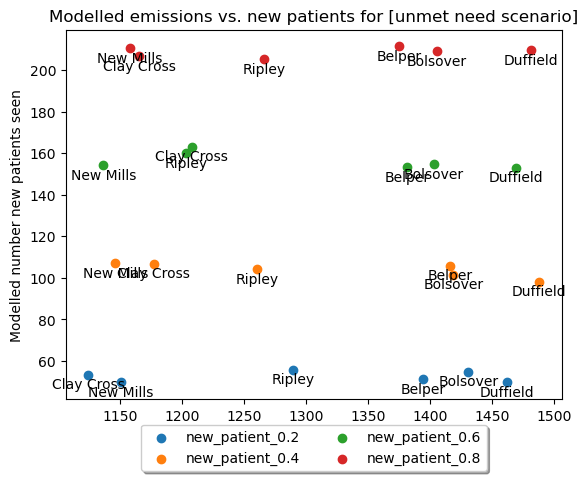

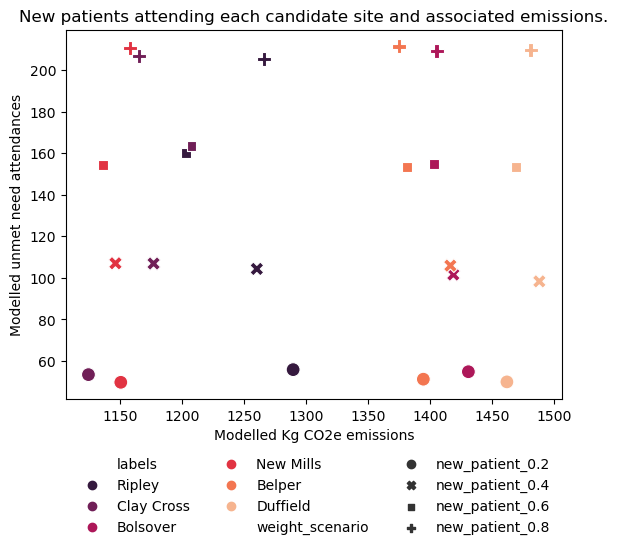

In [44]:


####################################################################
"""Chart results (est. unmet need vs. estimate emissions) for each scenario"""
#Now we can visualise the results from the model to determine relative impact of each clinic location
#create subdirectory to save emissions and unmet need results into, if this does not already exist
#change cwd to the model_new_site_path assets folder
print(os.getcwd())
os.chdir(model_new_site_path)
create_subdirectory('emissions_unmet_need_results')
print(os.getcwd())
os.chdir('emissions_unmet_need_results')
print(os.getcwd())

#extract the new patients and emissions values from each scenario in the 2 dictionaries we have just created above.
#store in a new dictionary, which we can then refer to in order to produce standardise charts of the results
dict_values_to_plot = {}

for weight in list_weights_new_patient:
    labels = []
    x_emissions = []
    y_new_patients = []
    for clinic in new_clinic_location_names:
        labels.append(clinic)
        x_emissions.append(dict_clinic_to_weight_average_emissions[clinic][weight])
        y_new_patients.append(dict_clinic_to_weight_new_pts[clinic][weight])
    dict_values_to_plot[weight] = {
        'labels': labels,
        'x_emissions': x_emissions,
        'y_new_patients': y_new_patients
    }

#Version 1 of the chart
fig, ax = plt.subplots()
classes = []
for weight in list_weights_new_patient:
    chart_labels = dict_values_to_plot[weight]['labels']
    x = dict_values_to_plot[weight]['x_emissions']
    y = dict_values_to_plot[weight]['y_new_patients']

    scatter = ax.scatter(x, y)

    #annotate the plot to show the potential location names being considered
    for item in range(len(x)):    
        label = chart_labels[item]
        plt.annotate(label, # this is the text
                    (x[item],y[item]), # these are the coordinates to position the label
                    textcoords="offset points", # how to position the text
                    xytext=(0,-10), # distance from text to points (x,y)
                    ha='center') # horizontal alignment can be left, right or center
    classes.append(weight)

ax.legend(labels=classes, loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
plt.xlabel("Modelled CO2e emissions per year (kg)")
plt.ylabel("Modelled number new patients seen")
plt.title('Modelled emissions vs. new patients for [unmet need scenario]')
#plt.savefig(f"{model_new_site_path}/chart{figure_count}_scatter_modelled_new_pts_emissions.png", bbox_inches='tight') #original save code, when all outputs saved into 1 big messy folder. Now all outputs have own folder, for ease of review after the model is run.
plt.savefig(f"chart{figure_count}_scatter_modelled_new_pts_emissions.png", bbox_inches='tight') #new save line, to ensure outputs are in specific folders.
plt.show()
figure_count+=1

#Version 2 of the chart (this is equivalent to the chart above, just presented differently)
#This cell is restructuring the results in the above dictionary, into a format that seaborn can use to plot
list_weight_scenario_for_df = []
list_clinic_names_for_df = []
x_emissions_for_df = []
y_new_patients_for_df = []

list_labels_for_chart = [] #test new

for weight in list_weights_new_patient:
    for i in range(len(dict_values_to_plot[weight]['labels'])):
        list_weight_scenario_for_df.append(weight)
        list_clinic_names_for_df.append(dict_values_to_plot[weight]['labels'][i])
        x_emissions_for_df.append(dict_values_to_plot[weight]['x_emissions'][i])
        y_new_patients_for_df.append(dict_values_to_plot[weight]['y_new_patients'][i])

        list_labels_for_chart.append(dict_values_to_plot[weight]['labels'][i])

data_set_for_scatter_results = {
    'weight_scenario': list_weight_scenario_for_df,
    'clinic_name': list_clinic_names_for_df,
    'x_emissions': x_emissions_for_df,
    'y_new_patients': y_new_patients_for_df,
    'labels': list_labels_for_chart
}

df_results_for_seaborn_scatter = pd.DataFrame.from_dict(data_set_for_scatter_results)

ax = sns.scatterplot(data = df_results_for_seaborn_scatter, x='x_emissions', y='y_new_patients', hue='labels', palette='rocket', style='weight_scenario', s=100)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -.4),
    ncol=3,
    title=None,
    frameon=False)

ax.set_xlabel('Modelled Kg CO2e emissions')
ax.set_ylabel('Modelled unmet need attendances')

ax.set(title='New patients attending each candidate site and associated emissions.')

#plt.legend(bbox_to_anchor=(1.05, 1), loc='lower center', borderaxespad=0)

#Save the chart for later inclusion in the auto-report


filename_chart = f"chart{figure_count}_scatter_modelled_new_pts_emissions.png"
ax.figure.savefig(filename_chart, bbox_inches='tight')
#increment the figure counter
figure_count+=1

<h2>Now average all emissions values, for each candidate site, for all weighting scenarios</h2>

In [45]:

#now average all the emissions values for each potential clinic location, across all weighting scenarios
dict_clinic_name_average_modelled_emissions = {}
for clinic in new_clinic_location_names:
    average_emissions = sum(dict_clinic_to_weight_average_emissions[clinic].values()) / len(dict_clinic_to_weight_average_emissions[clinic])
    dict_clinic_name_average_modelled_emissions[clinic] = round(average_emissions,3)

#test print
dict_clinic_name_average_modelled_emissions

#go up one level to be able to save the df of emissions results into the correct folder. 
go_up_one_directory()

data = {'Clinic Name' : list(dict_clinic_name_average_modelled_emissions.keys()), 'Estimated Average CO2e Per Year (Kg)': list(dict_clinic_name_average_modelled_emissions.values())}
df_average_results = pd.DataFrame(data)

filename_to_save = "df_average_co2e_results"

save_df_to_csv(df_average_results, global_params, filename_to_save, "emissions_unmet_need_results", False)

#log the current time again, then derive elapsed time since the file started running
end_time = time.time()
run_time = end_time - start_time
print(f"The file completed running in {round(run_time / 60,2)} minutes.")

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\emissions_unmet_need_results
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
The file completed running in 2.88 minutes.


<h1>Section 2: Assess change to accessibility</h1>

Step 1: Create isochrones for each existing clinic location - this will be used to get baseline accessibility %s before the additional clinic is introduced 

In [46]:

#########################################################

"""Section 2: assess change to accessibility"""

#Baseline the % of the whole LA area that can access at least 1 location in X minutes by different travel means
#Quantify net change to baseline for each possible new location introduced in isolation
#Repeat for just the 20% most deprived LSOAs only to determine net improvement 
#on access for this population group, as a result of each individual clinic being introduced.

"""Step 1. Create isochrones for each existing clinic location - this will be 
used to get baseline accessibility %s before the additional clinic is introduced"""

###
#go up two directories, to be able to read the raw data files in subsequent lines of code
go_up_one_directory()
go_up_one_directory()

#this subsets a large shapefile of all LA and UTLA borders to just the border of the LA of interest
geodf_utla_shapefiles = gpd.read_file('raw_data\\open_geography_boundary_files\\UTLA_shapefiles\\Counties_and_Unitary_Authorities_(December_2021)_EN_BFC.shp')
mask = geodf_utla_shapefiles['CTYNME'] == la_of_interest
subset_df_outer_la_border = geodf_utla_shapefiles[mask]
subset_df_outer_la_border = subset_df_outer_la_border['geometry'].reset_index().drop(columns='index', axis=1)
subset_df_outer_la_border

#Api profiles for different means for travel
dict_travel_means = {
    'car': 'driving-car',
    'cycle_road' : 'cycling-road',
    'walk' : 'foot-walking',
    'wheelchair' : 'wheelchair'
}

list_travel_means = ['driving-car', 'cycling-road', 'foot-walking', 'wheelchair']

#create variables containing the travel time for each mode of travel in scope. This will determine what the isochrone shows. 
#This is multiplied by 60 because the ORS API requires an input in seconds
drive_time = global_params.drive_time
cycle_time = global_params.cycle_time
walking_time = global_params.walking_time
wheelchair_time = global_params.wheelchair_time

#create dict of travel mode to travel time
dict_travel_mode_travel_time = {
    'driving-car' : drive_time,
    'cycling-road' : cycle_time,
    'foot-walking' : walking_time,
    'wheelchair' : wheelchair_time
}

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


<h2>Call the ORS Isochrone API to generate isochrones for different means of trvel for the current clinics in place already</h2>

In [47]:


#The next cell calls the OpenRouteService Isochrone API in a nested for loop. 
#The result is a populated nested dictionary. Outer dictionary is the clinic 
#location name, inner dictionary is the means of travel, values of inner 
#dictionary are the lists of coords which make up the isochrone. This also 
#populates a second nested dictionary, consisting of clinic name (outer key), 
#travel mode (inner key), and isochrone as a polygon data type (value)

test_geodf_clinic_points_reversed, clinic_names, clinic_postcodes, clinic_coords, list_keys_that_error = geocode_postcodes(apiKey, dict_existing_clinic_to_postcode)

#Standalone cell that follows relates to the mapping code from the first 
#section, however this requires the output from the above cell (section 2), 
#so slightly disjointed, but for practical purposes (and avoiding re-coding 
#unnecessarily) this is run here. Section 2 continues after the following cell. 

#os.getcwd()
#model_new_site_path # 'Assets_produced_by_code/05_adding_new_site_assets'
os.chdir(model_new_site_path)

os.getcwd()

#check whether a folder exists for saving the heats maps of LSOAs experiencing 
#reduced travel distance to their nearest clinic. If this does not exist, create the subdirectory. 

sub_directory_name = 'heatmaps_lsoas_reduced_distance'
current_directory = os.getcwd()
combined_path = f"{current_directory}\\{sub_directory_name}"

create_subdirectory(combined_path)
#try:
#    os.makedirs(combined_path)
#    print(f"{sub_directory_name} directory created")
#except FileExistsError:
    # directory already exists
#    pass

#navigate into the new subdirectory
os.chdir(sub_directory_name)

#check we are in the right directory (we are)
os.getcwd()

Clinic 1 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 2 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 3 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 4 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 5 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 6 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 7 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 8 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 9 of 10 geocoding complete. Forcing 2 second delay for geocode API to run
Clinic 10 of 10 geocoding complete. Forcing 2 second delay for geocode API to run


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


'c:\\Users\\Matthew_Eves\\Documents\\HSMA_local\\Greener NHS funded development\\01. Final files to upload - to test\\Assets_produced_by_code\\05_adding_new_site_assets\\heatmaps_lsoas_reduced_distance'

c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\299012359.py:37: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T


c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance


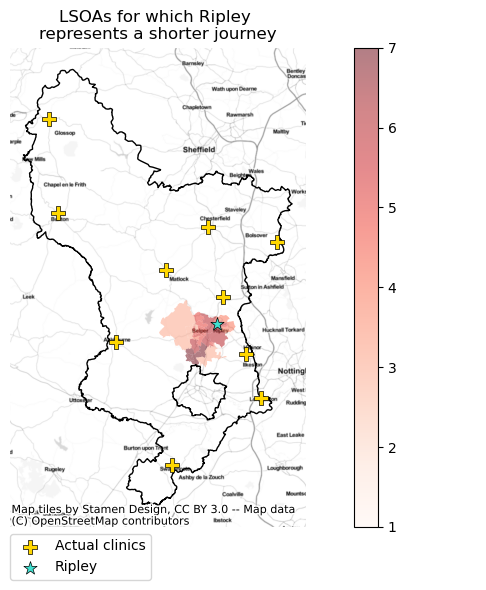

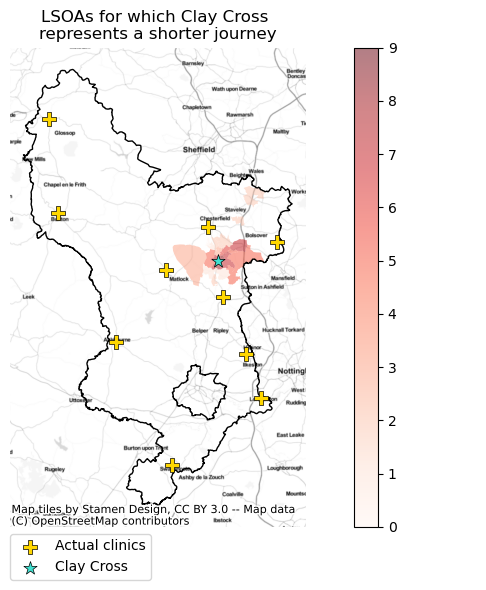

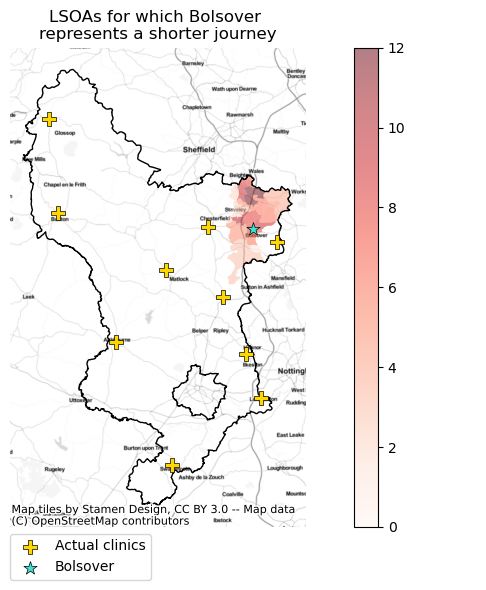

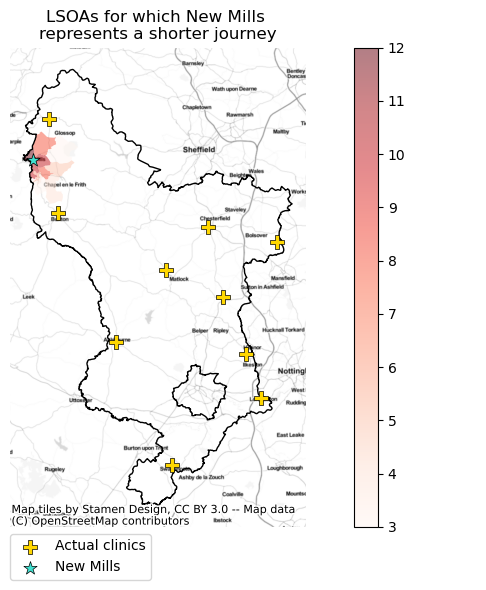

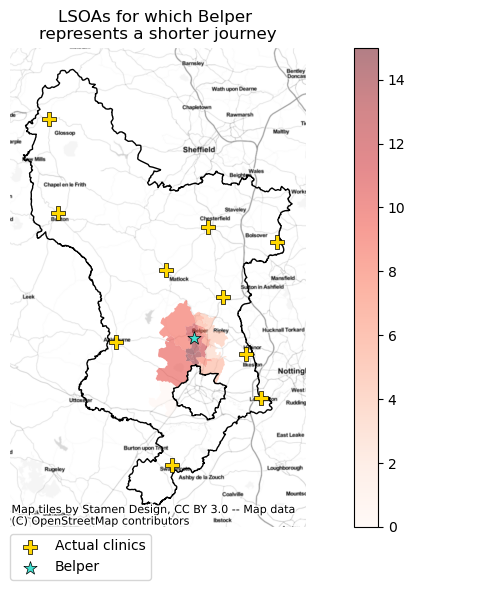

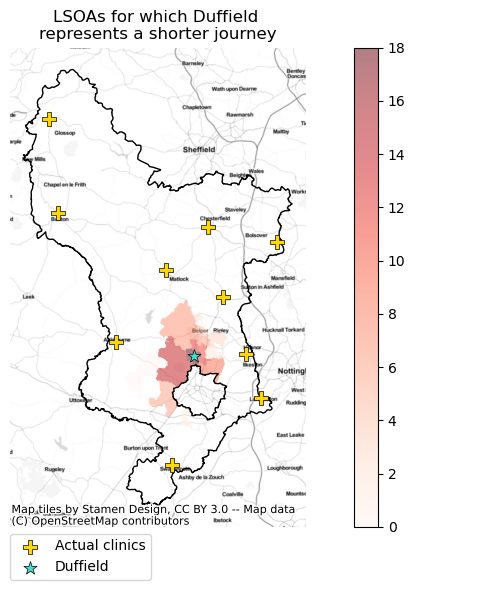

In [48]:

#This cell creates mapps, adding points to the map in the correct location for the current clinics as well as the candidate location.
#The maps of improved access for each possible new site are saved as assets and later brought into the automated report.

#subset the shapefile of LSOAs to just the LA of interest. 
boundaries_LSOA_merged_utla = boundaries_LSOA.merge(df_lsoa_to_utla.rename(columns=str.upper), on='LSOA11CD', how='left')
mask = boundaries_LSOA_merged_utla['UTLA21NM'] == la_of_interest
boundaries_LSOA_merged_utla_of_interest = boundaries_LSOA_merged_utla[mask]

#change crs of geocoded actual current clinics to 27700
test_geodf_clinic_points_reversed_27700 = test_geodf_clinic_points_reversed.to_crs(27700)

copy_boundaries_LSOA_merged_utla_of_interest = boundaries_LSOA_merged_utla_of_interest.copy(deep=True)
#create the outer border for the LA of interest
geodf_la_border = copy_boundaries_LSOA_merged_utla_of_interest.dissolve('UTLA21NM')
for clinic_num in range(len(global_params.new_clinic_location_names)):

    #derive subset geo dataframe consisting of the point coords for just the clinic we are on at this point in the loop
    temp_df_x_and_y = gpd.GeoDataFrame(global_params.new_clinic_location_coords)
    gdf_temp_df_x_and_y = gpd.GeoDataFrame(temp_df_x_and_y, geometry=gpd.points_from_xy(temp_df_x_and_y[0], temp_df_x_and_y[1]), crs=4326)
    gdf_temp_df_x_and_y.to_crs(27700, inplace=True)
    gdf_temp_df_x_and_y_subset = gpd.GeoDataFrame(gdf_temp_df_x_and_y.iloc[clinic_num], crs=27700).T

    
    column = f'{global_params.new_clinic_location_names[clinic_num]}_dist_reduction'
    copy_boundaries_LSOA_merged_utla_of_interest[f'{global_params.new_clinic_location_names[clinic_num]}_dist_reduction'] = copy_boundaries_LSOA_merged_utla_of_interest['LSOA11CD'].map(dict_new_location_closer_net_journey_reduction[global_params.new_clinic_location_names[clinic_num]])
  
    fig, ax = plt.subplots(1, figsize=(10, 6))

    #set colour map to be shades of red
    cmap = 'Reds'

    #plot lsoa geometries shaded by net journey reduction
    copy_boundaries_LSOA_merged_utla_of_interest.plot(column=column, ax=ax, cmap=cmap, alpha=0.5) 

    geodf_la_border.plot(color='None', edgecolor='black', linewidth=1, ax=ax) #plot outer LA border

    ax.axis('off')

    #plot the actual clinics for reference
    test_geodf_clinic_points_reversed_27700['geometry'].plot(ax=ax, color='gold', marker='P', edgecolor='black', linewidth=0.5, label='Actual clinics', markersize=100)

    #plot the candidate clinic as a point
    gdf_temp_df_x_and_y_subset['geometry'].plot(ax=ax, color='turquoise', marker='*', edgecolor='black', linewidth=0.5, label=f'{global_params.new_clinic_location_names[clinic_num]}', markersize=100)

    #set min and max for colour bar
    vmin = copy_boundaries_LSOA_merged_utla_of_interest[column].min() #get min value for the colour bar from the associated field being shaded
    vmax = copy_boundaries_LSOA_merged_utla_of_interest[column].max() #get max value for the colour bar from the associated field being shaded

    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = fig.colorbar(sm, alpha=0.5)

    #add title
    ax.set_title(f'LSOAs for which {global_params.new_clinic_location_names[clinic_num]} \nrepresents a shorter journey')

    #add legend, use bbox_to_anchor to specify the location of the legend - requires some experimentation to align correctly.
    ax.legend(loc='best', bbox_to_anchor=(0.5,0))

    #set tight layout to minimise white space
    plt.tight_layout()

    #add basemap with contextily
    cx.add_basemap(ax, crs=copy_boundaries_LSOA_merged_utla_of_interest.crs, source=cx.providers.Stamen.TonerLite)
    print(os.getcwd())
    plt.savefig(f'{global_params.new_clinic_location_names[clinic_num]}_heat_map_reduced_journey_distance.png', bbox_inches='tight')


<h2>Navigate back to required current working directory</h2>

In [49]:
#go back up two directories so the cwd is the main assets folder again
go_up_one_directory()
go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets\heatmaps_lsoas_reduced_distance
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code


<h2>Section 2 continues</h2>

In [50]:

#Following the cell above, which serves to produce the saved map files for the 
#heat maps of which LSOA areas have a reduced journey based on the introduction 
#of the new site. Section 2 proceeds from this point. 

#original working code 
#nested for loop to call isochrones API for each travel means for each clinic location in scope
dict_nested_clinic_travel_means = {}
dict_nested_clinic_travel_means_as_polygons = {}

#capture the start time for this api call
iso_api_start_time = time.time()
count_of_iso_api_calls = 1
count_of_ALL_iso_api_calls = 0

number_api_calls_expected = len(clinic_names) * len(list_travel_means)

for clinic_num in range(len(clinic_names)):
    dict_travel_means_isochrones = {}
    dict_travel_means_isochrones_as_polygons = {}

    for travel_means in list_travel_means:
        
        print(f"API call {count_of_iso_api_calls} of {number_api_calls_expected}")

        #experimental block to avoid rate limit errors
        """
        try:
            while ((time.time() - iso_api_start_time) / count_of_ALL_iso_api_calls) < 2.95:
                print("api rate limit reached. Enforcing 1 second delay to avoid failed api call")
                time.sleep(2)
        except ZeroDivisionError:
            pass
        """

        #call isochrones API - currently hardcoded to only call first item in clinic_coords list. Needs to loop through 1) each clinic and 2) each travel modality.0
        body = {"locations":[clinic_coords[clinic_num]],"range":[dict_travel_mode_travel_time[travel_means]],"intersections":"false","location_type":"destination","range_type":"time","area_units":"mi","units":"mi"}

        headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            'Authorization': f'{apiKey}',
            'Content-Type': 'application/json; charset=utf-8'
        }
        call = requests.post(f'https://api.openrouteservice.org/v2/isochrones/{travel_means}', json=body, headers=headers)

        json_object = json.loads(call.text)
        #list_isochrone_coords = json_object['features'][0]['geometry']['coordinates']
        list_iso_json = json_object['features'][0]['geometry']
        
        list_polygon_iso_json = Polygon(json_object['features'][0]['geometry']['coordinates'][0]) #this is converting the shape to polygon data type at point of running API

        print(call.status_code, call.reason)
        #print(call.text)

        dict_travel_means_isochrones[travel_means] = list_iso_json
        dict_travel_means_isochrones_as_polygons[travel_means] = list_polygon_iso_json

        #check how many calls to the API there will be in the current use case, derived by number of clinics x number of travel means.
        #if this is greater than 20 (the rate limit of API calls per min from ORS isochrone service), then sleep (pause) the runing 
        #of the code block after each API call for 3.5 seconds. This ensures there are not more than 20 calls per minute, and avoids 
        #the code failing to run. 
        #The trade-off is that for large numbers of clinics this section can take a long-ish time to run (e.g. c. 2.5 mins for 12 clinics * 4 travel means)
        
        #original code to aovid rate limit
        if len(list_travel_means) * len(clinic_names) > 20:
            #time.sleep(3.5)
            time.sleep(4)
        
        #increment the count of iso api calls
        count_of_iso_api_calls+=1 
        count_of_ALL_iso_api_calls+=1
      
    dict_nested_clinic_travel_means[clinic_names[clinic_num]] = dict_travel_means_isochrones
    dict_nested_clinic_travel_means_as_polygons[clinic_names[clinic_num]] = dict_travel_means_isochrones_as_polygons

iso_api_end_time = time.time()
#derive run time for this section - combined with the count of iso api calls, this tells us how many calls per min have taken place to this point.
iso_api_run_time = iso_api_end_time - iso_api_start_time
print(round(iso_api_run_time / 60),2)

API call 1 of 40
200 OK
API call 2 of 40
200 OK
API call 3 of 40
200 OK
API call 4 of 40
200 OK
API call 5 of 40
200 OK
API call 6 of 40
200 OK
API call 7 of 40
200 OK
API call 8 of 40
200 OK
API call 9 of 40
200 OK
API call 10 of 40
200 OK
API call 11 of 40
200 OK
API call 12 of 40
200 OK
API call 13 of 40
200 OK
API call 14 of 40
200 OK
API call 15 of 40
200 OK
API call 16 of 40
200 OK
API call 17 of 40
200 OK
API call 18 of 40
200 OK
API call 19 of 40
200 OK
API call 20 of 40
200 OK
API call 21 of 40
200 OK
API call 22 of 40
200 OK
API call 23 of 40
200 OK
API call 24 of 40
200 OK
API call 25 of 40
200 OK
API call 26 of 40
200 OK
API call 27 of 40
200 OK
API call 28 of 40
200 OK
API call 29 of 40
200 OK
API call 30 of 40
200 OK
API call 31 of 40
200 OK
API call 32 of 40
200 OK
API call 33 of 40
200 OK
API call 34 of 40
200 OK
API call 35 of 40
200 OK
API call 36 of 40
200 OK
API call 37 of 40
200 OK
API call 38 of 40
200 OK
API call 39 of 40
200 OK
API call 40 of 40
200 OK
3 2


<h2>Create file names for the isochrones</h2>

In [51]:

###############################################################################
#create variables to contain the filenames we will later give to the isochrone shape files
isochrones_car_filename = 'isochrones\iso_union_driving-car.shp'
isochrones_bike_filename = 'isochrones\iso_union_cycling-road.shp' 
isochrones_wheelchair_filename = 'isochrones\iso_union_wheelchair.shp' 
isochrones_walk_filename = 'isochrones\iso_union_foot-walking.shp'

#final file with all generated information 
output_file = 'isochrones\all_final.geojson'

<h2>Create isochrone maps for each means for means of travel</h2>

In [52]:
os.chdir('05_adding_new_site_assets')
new_folder_name = 'interactive_isochrone_maps'
create_subdirectory(new_folder_name)

In [53]:

#loop through all travel means, create isochrone map, assign to dict with key of travel means, value of map. 
# save each mapped travel means to file with a file name including the journey time parameter as defined for each travel means
dict_travel_means_access_maps = {}
for travel_means in list_travel_means:
    map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=12)

    for clinic in range(len(clinic_coords)):
        folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

    #test_ =  json_object['features'][0]['geometry']
        folium.GeoJson(data=dict_nested_clinic_travel_means[clinic_names[clinic]][travel_means]).add_to(map)
        dict_travel_means_access_maps[travel_means] = map
        
        map.save(f'{new_folder_name}/{la_of_interest}_map_clinic_access_{int(round(dict_travel_mode_travel_time[travel_means]/60,0))}_min_{travel_means}.html') # relative to the LA in scope
        


In [54]:
go_up_one_directory()

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code


In [55]:
la_polygon = gpd.GeoDataFrame(subset_df_outer_la_border['geometry'])

#set the style for the LA border plotted on the map
#parameters for this are available at https://leafletjs.com/reference.html#path-option 
# scroll down to "Path" section on that page for a table of all style parameters
style = {"stroke": True, "fill": False, "color": "red", "weight": 4}

#if the map is rendering too zoomed in or out for the la geography the file is being used for, adjust the zoom_start parameter below
#smaller numbers zoom out, higher numbers zoom in
map = folium.Map(location=([clinic_coords[0][1], clinic_coords[0][0]]), zoom_start=9)

for clinic in range(len(clinic_coords)):
    folium.Marker(location=[clinic_coords[clinic][1], clinic_coords[clinic][0]], icon=folium.Icon(color='blue', icon='home')).add_to(map)

#test_ =  json_object['features'][0]['geometry']
    folium.GeoJson(data=dict_nested_clinic_travel_means[clinic_names[clinic]]['driving-car']).add_to(map) #change this to alternative modes of travel (cycling-road, foot-walking, wheelchair) for their respective folium map
folium.GeoJson(data=la_polygon, style_function = lambda x: style).add_to(map)
#call map to display the map
map

<h2>Step 2: Merge isochrones for existing travel means</h2>

In [56]:
###############################################################################
"""Step 2. Merge isochrones for existing travel means"""

##take the polygons for each clinic location for means of travel and put these into a list. assign to dictionary, with travel means (key) and isochrones (values)
dict_list_poly_travel_mode = {}
for mode in list_travel_means:
    temp_list = []
    for clinic in clinic_names:
        temp_list.append(dict_nested_clinic_travel_means_as_polygons[clinic][mode])
    dict_list_poly_travel_mode[mode] = temp_list


#now merge the baseline polygons and assign to a dict, with key of travel mode and value of the merged polygons
#we can use this to later calculate the accessibility % for the baseline arrangement of clinics. 
#and then, build on this for potential new clinic locations to see their impact on the accessiblity %.
dict_travel_means_merged_baseline_poly = {}
for mode in list_travel_means:
    temp_boundary = gpd.GeoSeries(unary_union(dict_list_poly_travel_mode[mode])).set_crs('EPSG:4326')
    dict_travel_means_merged_baseline_poly[mode] = temp_boundary




<h2>Step 3. Map the merged baseline isochones</h2>

In [57]:
###############################################################################
"""Step 3. Map the merged baseline isochones"""

geodf_current_clinic_locations_to_plot = pd.DataFrame.from_dict({'clinic_name': clinic_names, 'coords': clinic_coords})
geodf_current_clinic_locations_to_plot['easting'] = 0
geodf_current_clinic_locations_to_plot['northing'] = 0

geodf_current_clinic_locations_to_plot[['easting', 'northing']] = pd.DataFrame(geodf_current_clinic_locations_to_plot['coords'].tolist(), index=geodf_current_clinic_locations_to_plot.index)
geodf_current_clinic_locations_to_plot['Northing'] = geodf_current_clinic_locations_to_plot['northing']
geodf_current_clinic_locations_to_plot['Easting'] = geodf_current_clinic_locations_to_plot['easting']
geodf_current_clinic_locations_to_plot

test_geodf_current_locations_copy = geodf_current_clinic_locations_to_plot.copy(deep=True)
test_geodf_current_locations_copy.drop(['coords', 'easting', 'northing'], axis=1, inplace=True)
test_geodf_current_locations_copy

,clinic_name,Northing,Easting
0,Alfreton Clinic,53.098022,-1.392146
1,Ashbourne Clinic,53.012862,-1.737589
2,Cavendish Clinic,53.262442,-1.921255
3,Howard Med Practice(Glossop),53.445062,-1.949690
4,Ilkeston Hospital,52.988092,-1.320818
5,Long Eaton Clinic,52.901553,-1.272531
6,Shirebrook Clinic,53.203166,-1.215111
7,Swadlincote Clinic,52.774889,-1.559331
8,Wheatbridge,53.233943,-1.439620
9,Matlock Clinic,53.150924,-1.575216


<h3>Create sub-directory for baseline isochrone maps</h3>

In [58]:

os.getcwd()
#below code takes the current working directory up one level. This was required in test, but may have run an earlier cell to change directory in error. 
#when running through the whole codde, check cwd here, and if not "... 01. Final files to upload" then uncomment and adjust if needed until this is the case.

path_parent = os.path.dirname(os.getcwd())
os.chdir(path_parent)
print(os.getcwd())

print(os.getcwd())
os.chdir(model_new_site_path)
sub_directory_name_iso_maps = 'baseline_isochrone_access_maps'
create_subdirectory(sub_directory_name_iso_maps)
print(os.getcwd())

####################

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets


<h3>Create the maps</h3>

C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2097014625.py:34: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  geo_df_clinic_name_easting_northing = gpd.GeoDataFrame(list_clinic_name_easting_northing, columns = ['ClinicName', 'Easting', 'Northing'], crs=27700)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2097014625.py:34: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  geo_df_clinic_name_easting_northing = gpd.GeoDataFrame(list_clinic_name_easting_northing, columns = ['ClinicName', 'E

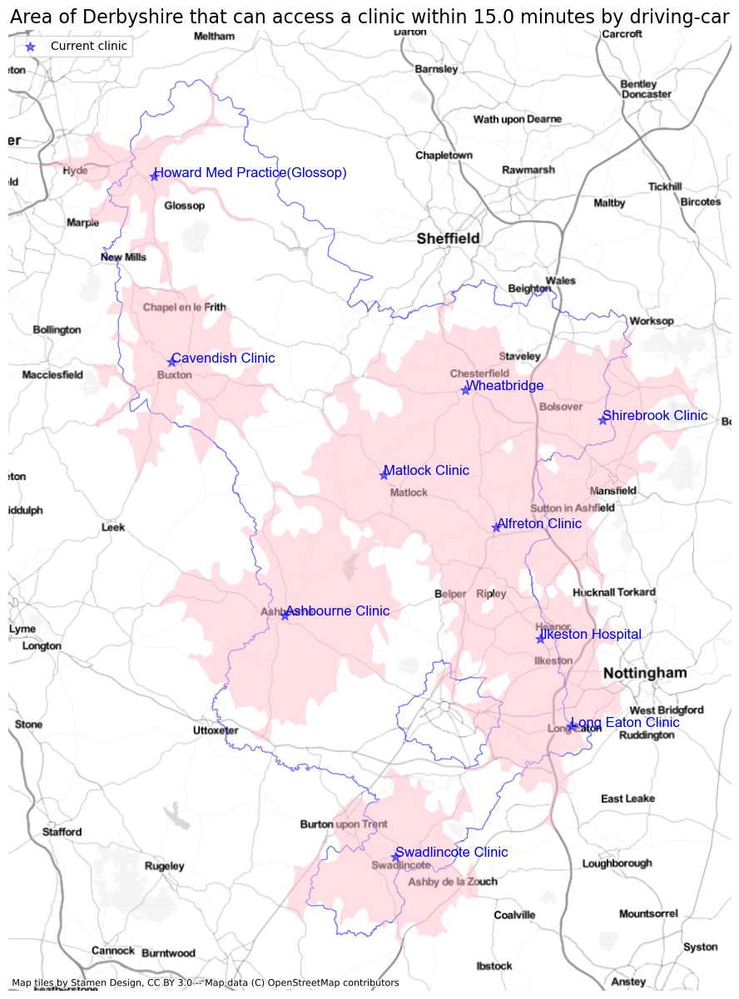

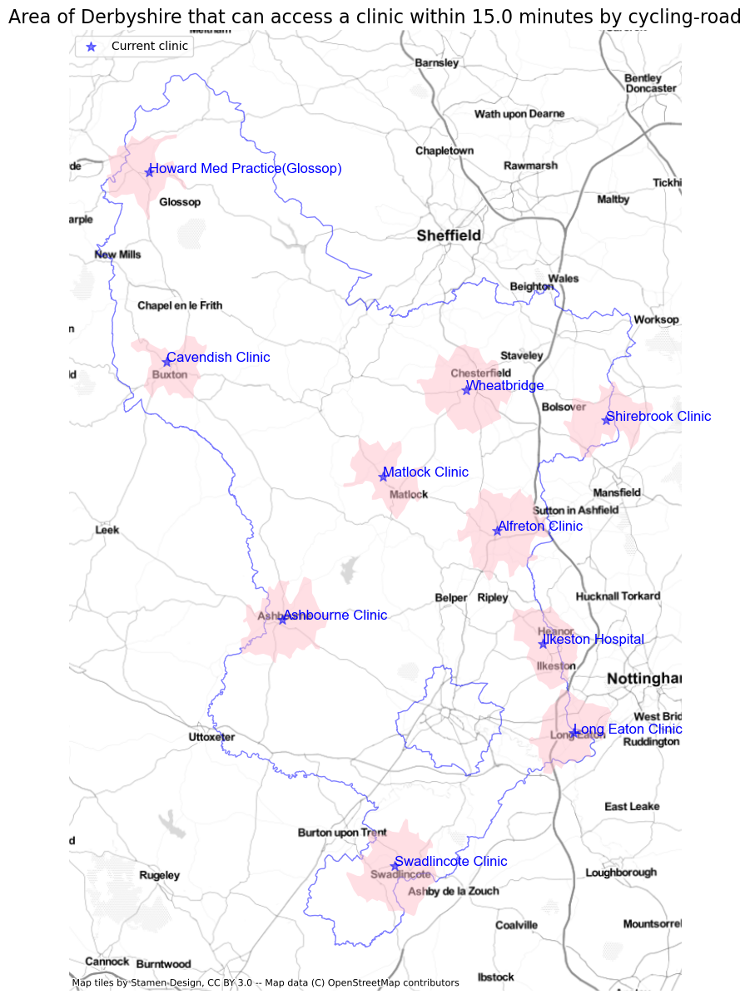

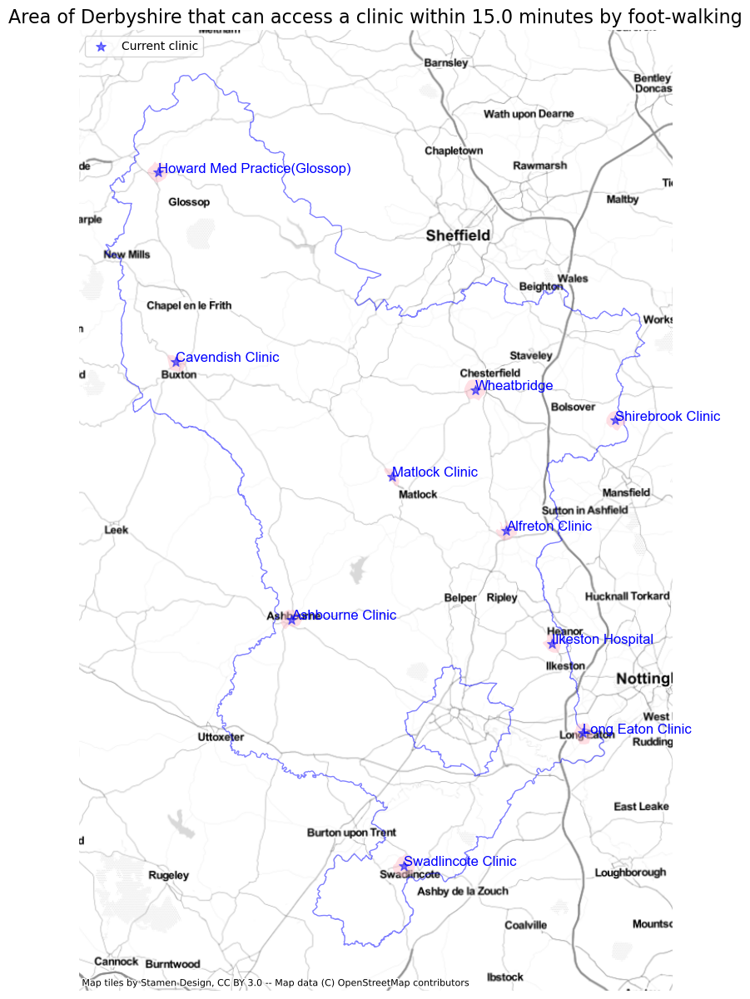

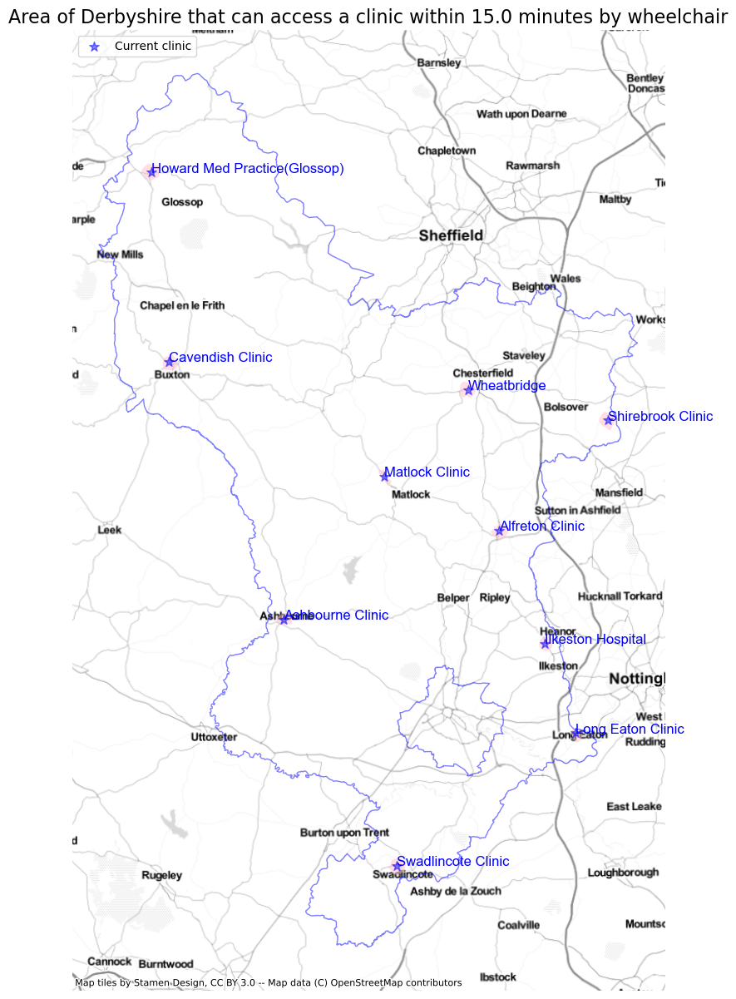

In [59]:
dict_baseline_iso_la_maps = {}
for travel_means in list_travel_means:
    map = create_map_la_border_isochrones_by_travel_means(
        la_polygon,
        dict_travel_means_merged_baseline_poly,
        test_geodf_current_locations_copy,
        travel_means,
        dict_travel_mode_travel_time,
        sub_directory_name_iso_maps) #was model_new_site_path
    dict_baseline_iso_la_maps[travel_means] = map
    
####################

#create baseline maps for all 4 means of travel, to show the shaded area of the UTLA/LA that can be accessed by each within the user 
#provided travel time
dict_baseline_maps_per_travel_means = {}
for travel_means in list_travel_means:
    map = map_merged_isochrones_with_clinic_sites(
        clinic_coords,
        dict_travel_means_merged_baseline_poly,
        travel_means,
        la_polygon
        )
    dict_baseline_maps_per_travel_means[travel_means] = map



#test print example from above function call / dictionary
#dict_baseline_maps_per_travel_means['driving-car']

<h2>Step 4: Create isochrones for candidate new locations</h2>

In [60]:
###############################################################################

"""Step 4. Create isochrones for candidate new locations"""

#original working code 
#nested for loop to call isochrones API for each travel means for each clinic location in scope
dict_nested_travel_means_new_clinics = {}
dict_nested_travel_means_as_polygons_new_clinics = {}

count_seconds_sleeping = 0
#check if the interval between the clock time when the isochrone api was last called (further up in the program)
#and the clock time now. If this time is less than 60, enforce a 1 second delay. 
#repeat until the interval is 60 seconds. The continue. 
#This is not the most efficient route, but, serves to effectively reset the rate limit for the isochrone API. 
while (time.time() - iso_api_end_time) < 60:
    time.sleep(1)
    count_seconds_sleeping+=1

iso_new_clinic_start_time = time.time()
count_iso_api_calls_new_clinic = 1
count_expected_number_api_calls = len(list_travel_means) * len(global_params.new_clinic_location_names)

for travel_means in list_travel_means:
    dict_clinic_name_isochrones = {}
    dict_clinic_name_isochrones_as_polygons = {}

    for clinic_num in range(len(global_params.new_clinic_location_names)):
        print(f"API call {count_iso_api_calls_new_clinic} of {count_expected_number_api_calls}")

        #call isochrones API - loops through 1) each travel modality and 2) each clinic
        body = {"locations":[global_params.new_clinic_location_coords[clinic_num]],"range":[dict_travel_mode_travel_time[travel_means]],"intersections":"false","location_type":"destination","range_type":"time","area_units":"mi","units":"mi"}

        headers = {
            'Accept': 'application/json, application/geo+json, application/gpx+xml, img/png; charset=utf-8',
            'Authorization': f'{apiKey}',
            'Content-Type': 'application/json; charset=utf-8'
        }
        call = requests.post(f'https://api.openrouteservice.org/v2/isochrones/{travel_means}', json=body, headers=headers)

        json_object = json.loads(call.text)
        #list_isochrone_coords = json_object['features'][0]['geometry']['coordinates']
        list_iso_json = json_object['features'][0]['geometry']
        
        list_polygon_iso_json = Polygon(json_object['features'][0]['geometry']['coordinates'][0]) #this is converting the shape to polygon data type at point of running API

        #print(call.status_code, call.reason)
        #print(call.text)

        dict_clinic_name_isochrones[global_params.new_clinic_location_names[clinic_num]] = list_iso_json
        dict_clinic_name_isochrones_as_polygons[global_params.new_clinic_location_names[clinic_num]] = list_polygon_iso_json

        #check how many calls to the API there will be in the current use case, derived by number of clinics x number of travel means.
        #if this is greater than 20 (the rate limit of API calls per min from ORS isochrone service), then sleep (pause) the runing 
        #of the code block after each API call for 3.5 seconds. This ensures there are not more than 20 calls per minute, and avoids 
        #the code failing to run. 
        #The trade-off is that for large numbers of clinics this section can take a long-ish time to run (e.g. c. 2.5 mins for 12 clinics * 4 travel means)
        
        #commented out to test impact of while loop introduced above, may mean we dont need this. 
        #if len(list_travel_means) * len(global_params.new_clinic_location_names) > 20:
        #    time.sleep(3.5)
        print("forcing 3 second delay to allow API to run and avoid rate limit")
        time.sleep(3)

        #increment the api call counter 
        count_iso_api_calls_new_clinic+=1

        #increment running total for ALL iso api calls:
        count_of_ALL_iso_api_calls+=1

    dict_nested_travel_means_new_clinics[travel_means] = dict_clinic_name_isochrones
    dict_nested_travel_means_as_polygons_new_clinics[travel_means] = dict_clinic_name_isochrones_as_polygons

iso_new_clinic_end_time = time.time()
iso_new_clinic_run_time = iso_new_clinic_end_time - iso_new_clinic_start_time

API call 1 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 2 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 3 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 4 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 5 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 6 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 7 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 8 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 9 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 10 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 11 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 12 of 24
forcing 3 second delay to allow API to run and avoid rate limit
API call 13 of 24
forcing

<h2>Step 5: Calculate baseline % accessibility & save to disk</h2>

In [61]:


###############################################################################

""" Step 5. Calculate baseline % accessibility & save to disk """

#Calculate the baseline % of the LA that is accessible by each travel means 
#with the provided number of mins journey time

dict_travel_means_merged_baseline_poly['driving-car'].crs

dict_baseline_accessible_area_by_travel_means = {}
for mode in list_travel_means:
    #dict_travel_means_merged_baseline_poly contains the baseline isochrone (poly or MultiPoly) for each of the 4 means of travel, for the n ACTUAL CURRENT clinic locations
    temp_df = gpd.GeoDataFrame(dict_travel_means_merged_baseline_poly[mode], columns=['geometry'], geometry='geometry', crs=4326)
    #convert crs of the above temp_df to 27700 from 4326 (this corrects the projection and allows area calculations)
    temp_df.to_crs(27700, inplace=True)
    baseline_area_overlapping = gpd.overlay(subset_df_outer_la_border, temp_df, how='intersection')
    #baseline_percent = round((baseline_area_overlapping['geometry'][0].area / subset_df_outer_la_border['geometry'][0].area) * 100, 3) #original working line with rounding present
    baseline_percent = (baseline_area_overlapping['geometry'][0].area / subset_df_outer_la_border['geometry'][0].area) * 100 #revised line to remove rounding
    dict_baseline_accessible_area_by_travel_means[mode] = baseline_percent

#test print - delete in final
dict_baseline_accessible_area_by_travel_means

#first change the wording of each travel means from that used in the API call, to something more readable in a report. Save this altered wording to a list.
dict_travel_means_to_report_wording = {}

list_travel_means_for_report = []
#for travel_means in list(dict_baseline_accessible_area_by_travel_means.keys()):
for travel_means in list_travel_means:
    if travel_means == 'foot-walking':
        list_travel_means_for_report.append('Walking on foot')
        dict_travel_means_to_report_wording[travel_means] = 'Walking on foot'
    
    elif travel_means == 'cycling-road':
        list_travel_means_for_report.append('Cycling')
        dict_travel_means_to_report_wording[travel_means] = 'Cycling'
    
    elif travel_means == 'driving-car':
        list_travel_means_for_report.append('Driving (car)')
        dict_travel_means_to_report_wording[travel_means] = 'Driving (car)'
    
    elif travel_means == 'wheelchair':
        list_travel_means_for_report.append('Wheelchair')
        dict_travel_means_to_report_wording[travel_means] = 'Wheelchair'
    
    else:
        pass

#test print
#list_travel_means_for_report

sub_directory_name_percent_accessible = 'percent_accessibility_results'
create_subdirectory(sub_directory_name_percent_accessible)
os.getcwd()

#run list comprehension to get the travel times for each means of travel in scope, in a list
list_travel_times = [x / 60 for x in dict_travel_mode_travel_time.values()]

#create a dictionary of the required values (this stage is needed to get the data into the format required to be subsequently converted to a dataframe)
#use the list of adjusted travel means descriptions above when creating this.
data_baseline_access_total_area = {'Travel Means' : list_travel_means_for_report, '% of Area Accessible': list(dict_baseline_accessible_area_by_travel_means.values()), 'Journey Time Threshold (mins)': list_travel_times}

#create a dataframe consisting of the travel means, the % area accessible by that travel means in X minutes, and the threshold journey time in mins used for X
df_travel_means_percent_accessible = pd.DataFrame.from_dict(data_baseline_access_total_area)

#round the % area accessible values to 3 decimal points
#df_travel_means_percent_accessible['% of Area Accessible'] = df_travel_means_percent_accessible['% of Area Accessible'].round(3)

#save the df for inclusion in the final report
filename_to_save = f"baseline_percent_access_by_travel_means-{la_of_interest}"
#save_df_to_csv(df_travel_means_percent_accessible, global_params, filename_to_save, model_new_site_path, False)
save_df_to_csv(df_travel_means_percent_accessible, global_params, filename_to_save, sub_directory_name_percent_accessible, False)

#rounding for report
df_travel_means_percent_accessible['% of Area Accessible'] = round(df_travel_means_percent_accessible['% of Area Accessible'],3)
df_travel_means_percent_accessible

,Travel Means,% of Area Accessible,Journey Time Threshold (mins)
0,Driving (car),54.696,15.0
1,Cycling,14.972,15.0
2,Walking on foot,1.184,15.0
3,Wheelchair,0.755,15.0


<h2>Step 6. Calculate net change in access for whole LA by each new site</h2>

In [62]:
###############################################################################

""" Step 6. Calculate net change in access for whole LA by each new site """

#Now calculate the total accessibility coverage for all existing sites PLUS 
#each new clinic under consideration, in turn. Logically, this should 
#consistently yield an updated area that is >= the baseline, for each 
#respective travel means.

#This cell loops over all isochrone polygons created previously for each clinic and travel mode, and merges these with the respective baseline merged polygon for each travel mode
#These are then saved in a dictionary with keys of travel mode, and new clinic name, and values the updated merged isochrone for accessibility within X mins to the original 
#clinics PLUS each new candidate clinic location in turn.

dict_travel_means_merged_poly_new_clinic_site = {}

for travel_means in list_travel_means:
    #print(lsoa)
    #dict containing the merged polys for each travel mode for as-is clinics
    #dict_travel_means_merged_baseline_poly

    dict_travel_means_new_site = {}

    for clinic_name in global_params.new_clinic_location_names:
        #print(f"    {mode}")
        points = []
        #add polygon coords for merged isochrone associated with the original baseline / as-is clinics
        points.append(dict_travel_means_merged_baseline_poly[travel_means][0])
        #add the polygon coords for the new lsoa centroid isochrone being modelled (potential new clinc location)
        points.append(dict_nested_travel_means_as_polygons_new_clinics[travel_means][clinic_name])

        temp_boundary = gpd.GeoSeries(unary_union(points)).set_crs('EPSG:4326')
        dict_travel_means_new_site[clinic_name] = temp_boundary
    
    dict_travel_means_merged_poly_new_clinic_site[travel_means] = dict_travel_means_new_site
 
    

In [63]:

###############################################################################
""" Check the below cell is working as expected - run each scenario line by line 
    to check whether the inf problem is occuring """
    
#now we will loop through each merged isochrone (consisting of baseline merged isochrone for current clinics, PLUS the isochrone for new clinic site, for all travel means, and repeat for 
# every possible clinic site, defined as lsoas in which we currently dont have a clinic)

dict_lsoa_mode_acessibility_area = {}
for travel_means in list_travel_means:
    dict_mode_acessibility_area = {}

    for clinic_name in global_params.new_clinic_location_names:
        #print(f"{lsoa} - {mode}")
        merged_poly_fixed_crs = dict_travel_means_merged_poly_new_clinic_site[travel_means][clinic_name].to_crs(27700)
        geodf_merged_poly_fixed_crs = gpd.GeoDataFrame(merged_poly_fixed_crs, columns=['geometry'], crs=27700)
        area_overlapping_ = gpd.overlay(subset_df_outer_la_border, geodf_merged_poly_fixed_crs, how='intersection')
        #calculate the percent covered by the current merged isochrone
        #percent_accessible = (area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100  #original
        percent_accessible = (area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100 
        #percent_accessible = round((area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100,8) #original
        #new percent accessible minus baseline percent accessible, for the given travel means
        net_percent_change = percent_accessible - dict_baseline_accessible_area_by_travel_means[travel_means] 
        #net_percent_change = round(percent_accessible - dict_baseline_accessible_area_by_travel_means[travel_means],3) #original

        dict_mode_acessibility_area[clinic_name] = net_percent_change
        
    dict_lsoa_mode_acessibility_area[travel_means] = dict_mode_acessibility_area

<h2>Step 7: ID candidate site yielding greatest access increase for each travel means for whole LA</h2>

In [64]:


###############################################################################

""" Step 7. ID candidate site yielding greatest access increase for each travel
    means for whole LA """

#convert the above created dict into a pandas dataframe - somethings looks off with the cycling-road one as all values the same??
df_accessibility_results = round(pd.DataFrame(dict_lsoa_mode_acessibility_area).transpose(),3)
df_accessibility_results

os.getcwd()

df_accessibility_results_transposed = df_accessibility_results.copy(deep=True).T
#df_accessibility_results_transposed

filename_to_save = f"percent_increased_accessibility_by_travel_means-{la_of_interest}"
#save_df_to_csv(df_accessibility_results_transposed, global_params, filename_to_save, model_new_site_path, True) #this was true when cwd was Assets_produced_by_code. replaced with below to add folder structure to results.
save_df_to_csv(df_accessibility_results_transposed, global_params, filename_to_save, sub_directory_name_percent_accessible, True)

df_accessibility_results_transposed

#adjust formatting of the above df, to have clinic name as a column in the df and not an index. This is so this renders appropriately in the report when the auto report code is run later in the program.
df_accessibility_results_transposed_for_report = df_accessibility_results_transposed.reset_index()
df_accessibility_results_transposed_for_report.rename(columns={'index': 'Clinic Candidate'}, inplace=True)
#df_accessibility_results_transposed_for_report

#loop through all travel means and for each identify the max value, associated lsoa, and populate nested dict for each travel mode
dict_max_value_travel_means = {}
for travel_mode in list_travel_means:
    #print(travel_mode)
    index_lsoa_of_max_value = df_accessibility_results_transposed[travel_mode].idxmax(axis=0)
    #print(index_lsoa_of_max_value)
    max_value = df_accessibility_results_transposed.loc[index_lsoa_of_max_value, travel_mode]
    #print(max_value)
    dict_travel_mode = {
        'index': index_lsoa_of_max_value, 
        'accessibility_percent' : max_value,
        }
    dict_max_value_travel_means[travel_mode] = dict_travel_mode

#final nested dict consisting of outer keys of travel mode and inner dict consisting of index (lsoa code values) and accessibility_percent with area covered as values
dict_max_value_travel_means


dict_statements_report_travel_means_max_access = {}
statement_counter = 1
length_travel_means = len(list_travel_means)

for travel_means in list_travel_means:
    #dict_statements_report_travel_means_max_access[travel_means] = f"The clinic that has the largest net increase ({round(dict_max_value_travel_means[travel_means]['accessibility_percent'],3)}%) in access within {round(dict_travel_mode_travel_time[travel_means] / 60, 2)} mins by {travel_means} is {dict_max_value_travel_means[travel_means]['index']}."
    
    report_location = dict_max_value_travel_means[travel_means]['index']
    report_net_increase = round(dict_max_value_travel_means[travel_means]['accessibility_percent'],3)
    report_travel_time = round(dict_travel_mode_travel_time[travel_means] / 60, 2)
    if statement_counter != length_travel_means:
        dict_statements_report_travel_means_max_access[travel_means] = f"... within {report_travel_time} minutes by {travel_means} was {report_location} ({report_net_increase}%),"
        statement_counter+=1
    else:
        dict_statements_report_travel_means_max_access[travel_means] = f"... within {report_travel_time} minutes by {travel_means} was {report_location} ({report_net_increase}%)."

dict_statements_report_travel_means_max_access

for key in dict_statements_report_travel_means_max_access.keys():
    print(dict_statements_report_travel_means_max_access[key])

... within 15.0 minutes by driving-car was Duffield (4.834%),
... within 15.0 minutes by cycling-road was Clay Cross (2.176%),
... within 15.0 minutes by foot-walking was Bolsover (0.134%),
... within 15.0 minutes by wheelchair was Ripley (0.095%).


<h1>Section 3: Assess change to accessibility for core 20% LSOAs only</h1>

<h2>Step 1: Read in required geometry files, subset to 20% most deprived LSOAs</h2>

In [65]:

    
#Above is all well and good for the WHOLE border, but need to consider 
#core20% separately given Inverse Care Law - so this happens next

"Step 1 Read in required geometry files, subset to 20% most deprived LSOAs"

#go up two directories so we can read in the raw data files
go_up_one_directory()
go_up_one_directory()

df_shapefile_lsoas = gpd.read_file('raw_data\open_geography_boundary_files\LSOA_shapefiles\Lower_Layer_Super_Output_Areas_(December_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp')

df_lsoa_to_utla = pd.read_csv('raw_data\open_geography_portal_lookups\Lower_Layer_Super_Output_Area_(2011)_to_Upper_Tier_Local_Authorities_(2021)_Lookup_in_England_and_Wales_.csv')

df_lsoa_to_imd = pd.read_csv('raw_data\ministry_of_housing_communities_local_gov\Indices_of_Multiple_Deprivation_(IMD)_2019.csv')

#We will now work on the baseline and net change on accessibility for the most 
#deprived 20% areas, which may be more meaningful than the overall LA as a whole

df_lsoa_and_utla_merged = pd.merge(df_shapefile_lsoas, df_lsoa_to_utla, how='left', on=['LSOA11CD', 'LSOA11CD'])
#df_lsoa_and_utla_and_imd_decile_merged = pd.merge(df_lsoa_and_utla_merged, df_lsoa_to_imd[['lsoa11cd, IMD_Decile']], how='left', left_on='LSOA11CD', right_on='lsoa11cd')
df_lsoa_and_utla_and_imd_decile_merged = pd.merge(df_lsoa_and_utla_merged, df_lsoa_to_imd)
subset_df = df_lsoa_and_utla_and_imd_decile_merged[['LSOA11CD', 'LONG', 'LAT', 'geometry','UTLA21CD', 'UTLA21NM', 'IMD_Decile']]
#subset_df
#subset_df['IMD_Quintile'] = subset_df.apply(lambda row: categorise(row), axis=1)


#now subset further to just the most deprived 20% LSOAs (core20) - this new df contains all lsoas in the country in top 20%. Can then subset this further to the LA of interest
mask = subset_df['IMD_Decile'] <= 2
subset_df_core20 = subset_df[mask]
subset_df_core20

#subset the core20 national data set to just the la of interest's LSOAs in the 20% most deprived areas
mask = subset_df_core20['UTLA21NM'] == la_of_interest
subset_df_core20_la_interest = subset_df_core20[mask]
subset_df_core20_la_interest = subset_df_core20_la_interest['geometry'].reset_index().drop(columns='index', axis=1)
subset_df_core20_la_interest

#combine all geometries into a single merged (likely, multipolygon) geometry - this represents the geographic area of LA in the 20% most deprived LSOAs. 
#can now be used to quantify estimated accessibility for this subset of the population. 
subset_df_core20_la_interest_merged_border = gpd.GeoSeries(unary_union(subset_df_core20_la_interest['geometry'])).set_crs('EPSG:4326')
subset_df_core20_la_interest_merged_border

#new code replacing commented out section cell 129
new_clinic_coords = global_params.new_clinic_location_coords

c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code\05_adding_new_site_assets
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test\Assets_produced_by_code
c:\Users\Matthew_Eves\Documents\HSMA_local\Greener NHS funded development\01. Final files to upload - to test


<h2>Step 2: get baseline accessibility % for core 20% LSOAs</h2>

In [66]:

##########################
#experimental cell - after identifying that the geometries in dict_travel_means_merged_baseline_poly were in 4326 and 27700
dict_travel_means_merged_baseline_poly_27700 = {}
for travel_means in list_travel_means:
    test_change_crs_dict = dict_travel_means_merged_baseline_poly[travel_means].to_crs(27700)
    dict_travel_means_merged_baseline_poly_27700[travel_means] = test_change_crs_dict

###########################
dict_core20_area_accessible_by_diff_travel_means = {}
dict_core20_percent_accessible_by_diff_travel_means = {}

for travel_means in list_travel_means:
    #original with dict_travel_means_merged_baseline_poly in 4326
    #total_area, percent_area_accessible = get_area_overlapping_between_poly_or_multipolygon(subset_df_core20_la_interest, dict_travel_means_merged_baseline_poly, travel_means) 

    #edited 1/3 to use the above created dict_travel_means_merged_baseline_poly_27700 which is dict_travel_means_merged_baseline_poly but converted from 4326 to 27700
    total_area, percent_area_accessible = get_area_overlapping_between_poly_or_multipolygon(subset_df_core20_la_interest, dict_travel_means_merged_baseline_poly_27700, travel_means)
    dict_core20_area_accessible_by_diff_travel_means[travel_means] = total_area
    dict_core20_percent_accessible_by_diff_travel_means[travel_means] = percent_area_accessible
    
"""
check output of the call to the function to see % of the baseline 20% most 
deprived LSOAs that are accessible within 20 minutes driving. 

The above outputs values as series into a dict with keys of travel means. 
Next steps for this is to extract just the float % value from each series and 
convert these to a results df (as above for the baseline area accessible for
the whole LA border of interest)

#Need to add code here to conver the series output from the above into a 
df consisting of baseline area covered for each travel means
"""

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2350883887.py:49: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\2350883887.py:51: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity

else branch ran - must be a MultiPolygon


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity

else branch ran - must be a MultiPolygon


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity

'\ncheck output of the call to the function to see % of the baseline 20% most \ndeprived LSOAs that are accessible within 20 minutes driving. \n\nThe above outputs values as series into a dict with keys of travel means. \nNext steps for this is to extract just the float % value from each series and \nconvert these to a results df (as above for the baseline area accessible for\nthe whole LA border of interest)\n\n#Need to add code here to conver the series output from the above into a \ndf consisting of baseline area covered for each travel means\n'

<h2>Step 3: Get accessibility % for the new sites under consideration</h2>

In [67]:


#now we will loop through each merged isochrone (consisting of baseline merged isochrone for current clinics, 
#PLUS the isochrone for new clinic site, for all travel means, and repeat for 
# every possible clinic site, defined as lsoas in which we currently dont have a clinic)

dict_core20_acessibile_area_by_diff_travel_means_new_sites = {}
dict_core20_percent_accessible_by_diff_travel_means_new_sites = {}

for travel_means in list_travel_means:
    dict_mode_acessibility_area_new_site = {}
    dict_mode_acessibility_percent_new_site = {}

    for clinic_name in global_params.new_clinic_location_names:
        #print(f"{lsoa} - {mode}")
        #merged_poly_fixed_crs = dict_travel_means_merged_poly_new_clinic_site[travel_means][clinic_name].to_crs(27700)
        #geodf_merged_poly_fixed_crs = gpd.GeoDataFrame(merged_poly_fixed_crs, columns=['geometry'], crs=27700)
        #area_overlapping_ = gpd.overlay(subset_df_outer_la_border, geodf_merged_poly_fixed_crs, how='intersection')
        #calculate the percent covered by the current merged isochrone
        #percent_accessible = round((area_overlapping_.area[0] / subset_df_outer_la_border.area[0]) * 100,8)
        #new percent accessible minus baseline percent accessible, for the given travel means
        #net_percent_change = round(percent_accessible - dict_baseline_accessible_area_by_travel_means[travel_means],3)
        
        total_area, percent_area_accessible = get_area_overlapping_between_poly_or_multipolygon_new_site(subset_df_core20_la_interest, dict_travel_means_merged_poly_new_clinic_site, travel_means, clinic_name)

        dict_mode_acessibility_area_new_site[clinic_name] = total_area
        dict_mode_acessibility_percent_new_site[clinic_name] = percent_area_accessible
        
    dict_core20_acessibile_area_by_diff_travel_means_new_sites[travel_means] = dict_mode_acessibility_area_new_site
    dict_core20_percent_accessible_by_diff_travel_means_new_sites[travel_means] = dict_mode_acessibility_percent_new_site

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  s = pd.Series(data, index=index, name=name, **kwargs)
c:\Users\Matthew_Eves\Anaconda3\envs\equity

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

else branch ran - must be a MultiPolygon


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:43: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for iso_poly in range(len(geodf_isochrones_27700[0][0])):
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\4187063839.py:45: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  test_extracted_iso_poly = gpd.GeoSeries(geodf_isochrones_27700[0][0][iso_poly]) #this line is the key difference between how to handle MutiPolys and Polys, MultiPolys have an additional level of indexing.
c:\Users\Matthew_Eves\Anaconda3\envs\equity_carbon_tool\lib\site-packages\geopandas\geoseries.py:207: FutureWarning: The default dtype for empty Series will be 'object' in

<h2>Step 4: Check the output from the above section</h2>

In [68]:

    
###############################################################################

#Check the output from the above function call, which returns the percentage 
#area of the 20% most deprived LSOAs in the LA of interest, within the 
#user-provided journey time (minutes) by the various travel means in scope
"""
#test print statements to check the function call has worked properly - appears working (testing required)
print(f"driving-car: {dict_core20_percent_accessible_by_diff_travel_means_new_sites['driving-car']['County Hall'][0]}")
print(f"cycling-road: {dict_core20_percent_accessible_by_diff_travel_means_new_sites['cycling-road']['County Hall'][0]}")
print(f"foot-walking: {dict_core20_percent_accessible_by_diff_travel_means_new_sites['foot-walking']['County Hall'][0]}")
print(f"wheelchair: {dict_core20_percent_accessible_by_diff_travel_means_new_sites['wheelchair']['County Hall'][0]}")
"""
#Now calculate the net change in access for each location and travel means, for the 20% most deprived LSOAs
dict_core20_percent_accessible_by_diff_travel_means


'#test cell to work through issue'

<h2>Step 5: Calculate net change in accessibility for the core 20% LSOAs and save outputs as csv</h2>

In [69]:

dict_core20_lsoa_mode_acessibility_area_new_site = {}
for travel_means in list_travel_means:
    temp_dict = {}

    for clinic_name in global_params.new_clinic_location_names:
        net_change = dict_core20_percent_accessible_by_diff_travel_means_new_sites[travel_means][clinic_name][0] - dict_core20_percent_accessible_by_diff_travel_means[travel_means][0]
        #this checks whether the net change is less than zero (it should never be less than zero, however, in testing in one scenario, we found a * very * small negative value in a result.
        #Where this occurs, this is changed to 0 in this step
        if net_change < 0:
            print(f"Net change less than zero. Value is {net_change}. Replaced with value of 0.")
            net_change = 0
        temp_dict[clinic_name] = net_change

    dict_core20_lsoa_mode_acessibility_area_new_site[travel_means] = temp_dict

#test print to show net change in accessibility percent for each site, for each travel means
dict_core20_lsoa_mode_acessibility_area_new_site

#convert the above created dict into a pandas dataframe
df_core20_accessibility_results_new_sites = pd.DataFrame(dict_core20_lsoa_mode_acessibility_area_new_site).transpose()
df_core20_accessibility_results_new_sites

#Using the above created results df, populate a dictionary with the lsoa code and "max net % change" of the LA that is accessible by each travel means, by identifying the max percent change value in each column, store in a dictionary
df_core20_accessibility_results_transposed_new_sites = df_core20_accessibility_results_new_sites.copy(deep=True).T

#test print
df_core20_accessibility_results_transposed_new_sites

#filename_to_save = "core20_lsoas_percent_increased_accessibility_by_travel_means"
filename_to_save = f"pct_increase_access_travel_means-Core20-{la_of_interest}"
filepath_to_save = f"{model_new_site_path}\\{sub_directory_name_percent_accessible}"
#save_df_to_csv(df_core20_accessibility_results_transposed_new_sites, global_params, filename_to_save, model_new_site_path, True) saved to main folder. replaced by line below to add folder structure and organise outputs
save_df_to_csv(df_core20_accessibility_results_transposed_new_sites, global_params, filename_to_save, filepath_to_save, True) #previously working, now not, hashed 30/3

#df_core20_accessibility_results_transposed_new_sites.to_csv(f"{sub_directory_name_percent_accessible}/{filename_to_save}-{global_params.df_file_number}.csv")
#increment file number
#global_params.df_file_number+=1

df_core20_accessibility_results_transposed_for_report_new_sites = df_core20_accessibility_results_transposed_new_sites.reset_index()
df_core20_accessibility_results_transposed_for_report_new_sites.rename(columns={'index': 'Clinic Candidate'}, inplace=True)
#df_core20_accessibility_results_transposed_for_report_new_sites

#loop through all travel means and for each one identify the max value, associated lsoa, and populate nested dict for each travel mode
dict_core20_max_value_travel_means = {}
for travel_mode in list_travel_means:
    #print(travel_mode)
    index_lsoa_of_max_value = df_core20_accessibility_results_transposed_for_report_new_sites[travel_mode].idxmax(axis=0)
    #print(index_lsoa_of_max_value)
    max_value = df_core20_accessibility_results_transposed_for_report_new_sites.loc[index_lsoa_of_max_value, travel_mode]
    #print(max_value)
    candidate_name = df_core20_accessibility_results_transposed_for_report_new_sites.loc[index_lsoa_of_max_value, 'Clinic Candidate']
    #print(max_value)
    dict_travel_mode = {
        'index': index_lsoa_of_max_value, 
        'clinic_name': candidate_name, 
        'accessibility_percent' : max_value,
        }
    #final nested dict consisting of outer keys of travel mode and inner dict consisting of index (lsoa code values) and accessibility_percent with area covered as values
    dict_core20_max_value_travel_means[travel_mode] = dict_travel_mode
    
dict_travel_means_to_report_wording

#dict_core20_max_value_travel_means['driving-car']['accessibility_percent'] == 0

dict_core20_statements_report_travel_means_max_access = {}
for travel_means in list_travel_means:
    if dict_core20_max_value_travel_means[travel_means]['accessibility_percent'] != 0:
        dict_core20_statements_report_travel_means_max_access[travel_means] = f"The clinic that has the largest net increase ({round(dict_core20_max_value_travel_means[travel_means]['accessibility_percent'],4)}%) in access within {round(dict_travel_mode_travel_time[travel_means] / 60, 2)} mins by {dict_travel_means_to_report_wording[travel_means].lower()} for the 20% most deprived LSOAs is {dict_core20_max_value_travel_means[travel_means]['clinic_name']}."
    else:
        dict_core20_statements_report_travel_means_max_access[travel_means] = f"None of the potential clinic location(s) in scope increased the % of the area covered by the 20% most deprived LSOAs that could access at least 1 clinic within the travel time parameters used when travelling by {dict_travel_means_to_report_wording[travel_means].lower()}."

for key in dict_core20_statements_report_travel_means_max_access.keys():
    print(dict_core20_statements_report_travel_means_max_access[key]) 

The clinic that has the largest net increase (4.7324%) in access within 15.0 mins by driving (car) for the 20% most deprived LSOAs is Bolsover.
The clinic that has the largest net increase (3.7848%) in access within 15.0 mins by cycling for the 20% most deprived LSOAs is Ripley.
The clinic that has the largest net increase (0.5161%) in access within 15.0 mins by walking on foot for the 20% most deprived LSOAs is New Mills.
The clinic that has the largest net increase (0.3099%) in access within 15.0 mins by wheelchair for the 20% most deprived LSOAs is New Mills.


<h1>Automated Report Section</h1>

In [70]:

    
###############################################################################   
 
"""
AUTOMATED REPORT SECTION
"""

###############################################################################

#adjust dataframe of clinic details (name, no. appointments, dna rate)
df_potential_new_clinics_for_report = df_potential_new_clinics[['clinic_name', 'Annual capacity (no. of appointments)', 'DNA_Rate']]
df_potential_new_clinics_for_report.rename(columns={'clinic_name': 'Clinic Name', 'Annual capacity (no. of appointments)': 'Annual No. of Appointments', 'DNA_Rate': 'DNA Rate (%)'}, inplace=True)
df_potential_new_clinics_for_report['DNA Rate (%)'] = df_potential_new_clinics_for_report['DNA Rate (%)'] * 100

df_weight_new_patient_for_report = pd.DataFrame().from_dict(dict_weight_new_patient).T
df_weight_new_patient_for_report.rename(columns={0: 'New patient chance (%)', 1: 'Chance (%) of having attended before'}, inplace=True)

for weight in list_weights_new_patient:
    if weight != "actual":
        df_weight_new_patient_for_report.loc[weight,:] = round(df_weight_new_patient_for_report.loc[weight,:] * 100,1)

df_weight_new_patient_for_report = round(df_weight_new_patient_for_report.iloc[:,:],2)
df_weight_new_patient_for_report.reset_index(inplace=True)
df_weight_new_patient_for_report.rename(columns={'index': 'Scenario name'}, inplace=True)

#run time
end_time = time.time()
run_time = end_time - start_time
print(f"The file completed running in {round(run_time / 60,2)} minutes.")

os.getcwd()

baseline_emissions_text_filepath = f"{carbon_emissions_assets_path}/TotalEmissionsBaseline.txt"

with open(baseline_emissions_text_filepath) as f:
    baseline_emissions_text = f.readlines()
    
len(global_params.new_clinic_location_names)

round(user_selected_lsoa_weight_adjustment_rate,2)

The file completed running in 13.11 minutes.


C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\1852226769.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_potential_new_clinics_for_report.rename(columns={'clinic_name': 'Clinic Name', 'Annual capacity (no. of appointments)': 'Annual No. of Appointments', 'DNA_Rate': 'DNA Rate (%)'}, inplace=True)
C:\Users\Matthew_Eves\AppData\Local\Temp\ipykernel_16700\1852226769.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_potential_new_clinics_for_report['DNA Rate (%)'] = df_potential_new_clinics_for_report['DNA Rate (%)'] * 100


2.41

In [71]:


###################################################

#create doc object
doc = docx.Document('template.docx')
#variable for numbering charts, lists etc
chart_counter = 1
assumption_counter = 1
parameter_counter = 1
appendix_count = 1 #remove when finalised as this variable overwrites the variable of the same name near the start of the file
interpolation_method_explanation_required = False

from docx.shared import Pt #new
style = doc.styles['Normal'] #new
font = style.font #new
font.name = 'Arial' #new
font.size = Pt(12) #new

#add new paragraph of text to the doc 
# note: add_paragraph and add_run accept option 2nd argument as a string of the paragraph or run object's style
run = doc.add_paragraph(f'{service_name}: Modelling the CO2e and Unmet Need Effect of Introducing a New Clinic', 'Title')

#paraObj1 = doc.add_paragraph(
#    'This automated report summarises the findings from the decision support tool produced by Matt Eves, Anya Gopfert and Sally Brown. \n\nThe report consists of the following sections:\n'
#    )

paraObj1 = doc.add_paragraph()
run = paraObj1.add_run(f'This automated report summarises findings from the decision support tool produced by Matthew Eves, Anya Gopfert and Sally Brown, as applied to the {service_name}. ')
run = paraObj1.add_run(f'The modelling, creation of charts, and production of this report was completed in {round(run_time / 60,2)} minutes. An overview of the method and assumptions is outlined in Appendix {appendix_count}.')

paraObj1a = doc.add_paragraph()
run = paraObj1a.add_run(baseline_emissions_text)
if len(global_params.new_clinic_location_names) == 1:
    run = paraObj1a.add_run(" This report considers a potential new clinic location and the modelled effect this may have on accessibility for both the whole area and the subset core 20% most deprived Lower Super Output Areas (LSOAs) respectively.")
else:
    run = paraObj1a.add_run(f" This report considers {len(global_params.new_clinic_location_names)} potential new clinic locations and the modelled effects each may have on accessibility for both the whole area and the subset core 20% most deprived Lower Super Output Areas (LSOAs) respectively.")

run = paraObj1a.add_run(" The estimated ")
word = "additional "
run = paraObj1a.add_run(word)
run.italic = True

if len(global_params.new_clinic_location_names) == 1:
    run = paraObj1a.add_run(" CO2e emissions are modelled for the candidate location.\n")
else:
    run = paraObj1a.add_run(" CO2e emissions are modelled for each candidate location.\n")


#increment appendix count
appendix_count+=1
# -----------------------------------------------------------

#add a heading. Heading "level" can be determined by the interger param after the string
#0 = title, 1 = top header, 4 = smallest subheading
doc.add_heading('1. Potential Clinics Under Consideration', 1)
paraObj2 = doc.add_paragraph('The table below summarises the potential clinic locations under consideration, along with the modelled number of appointments and Did Not Attend (DNA) rate modelled for each site.')
add_df_as_table(preferred_font_name, doc, df_potential_new_clinics_for_report, chosen_style)

paraObj2 = doc.add_paragraph('\nThe following maps indicate the location of each new site under consideration. They also show the Lower Super Output Areas (LSOAs) for which the candidate site would present a shorter journey than their current closest clinic location. The scale of the reduction in journey distance is indicated, with dark red indicating a greater reduction in journey distance and light red indicating a lesser reduction in journey distance.')

#Add the x y scatter chart to illustrate average results for each weight scenario modelled
for clinic_name in global_params.new_clinic_location_names:
    doc.add_heading(f'{clinic_name}: heatmap of LSOAs with a reduced distance to the nearest clinic.', 2)
    #heatmap = f"{model_new_site_path}/{clinic_name}_heatmap_reduced_distance.png"
    heatmap = f"{model_new_site_path}/heatmaps_lsoas_reduced_distance/{clinic_name}_heat_map_reduced_journey_distance.png"
    change_image_size_pydoc(
        doc,
        0.5,
        heatmap
        )

# -----------------------------------------------------------

#add a heading. Heading "level" can be determined by the interger param after the string
#0 = title, 1 = top header, 4 = smallest subheading
doc.add_heading('2. Data Quality Summary', 1)

number_lsoas_with_zero_patients
if number_lsoas_with_zero_patients > 0:
    paraObj3 = doc.add_paragraph(f'Cleaned {service_name} data was used for the model. There were {number_lsoas_with_zero_patients} LSOAs from which the service had not seen any patients in the timeframe/data set used.')
    
    
    '''
    if missing_lsoa_method == "Don't replace zeros (retain value of 0)":
        missing_lsoa_method_shortened = 0
    elif missing_lsoa_method == "Replace zeros with a single patient (value of 1)":
        missing_lsoa_method_shortened = 1
    elif missing_lsoa_method == "Replace zeros with the nearest LSOAs values":
        missing_lsoa_method_shortened = 2
    '''

    #add text to explain the method of interpolation, according to the method the user has chosen. 
    if missing_lsoa_method_shortened == 0:
        run = paraObj3.add_run(" No interpolation was used for the LSOAs from which the service had seen no patients in the source data set / time period. This meant the weight (chance) the model gave to modelling patients to be from these LSOAs was zero.")
    
    elif missing_lsoa_method_shortened == 1:
        run = paraObj3.add_run(" Interpolation was used to replace these missing data with a nominal low value of 1 patient. This enabled the model to subsequently model an increased weight (chance) a person would present from LSOAs with a reduced journey distance.")
        
    else:
        run = paraObj3.add_run(" Interpolation was used to replace these missing data.")
        run = paraObj3.add_run(" The interpolation method was to use the nearest neighbouring non-zero LSOAs data for this purpose, identified using straightline distance between two population weighted centroid points.")
        run = paraObj3.add_run(f" An explanation of the method applied here can be found in Appendix {appendix_count}.")
        interpolation_method_explanation_required = True

        #increment appendix count
        appendix_count+=1 

    #overview of the interpolation method (or save for appendix?). Consider table showing the LSOA codes interpolated for each LSOA with zeros

else:
    paraObj3 = doc.add_paragraph(f'Cleaned {service_name} data was used for the model. All LSOAs in {la_of_interest} were represented in this dataset, with at least 1 patient from each LSOA.')


#add an image - e.g. chart output image from the code
#width and height arguments are optional
#file_path = f'{preprocessing_assets_path}\\chart001_stacked_bar_missing_values_per_field.png'
#inline_shape, inline_shape.width, inline_shape.height = change_image_size_pydoc(doc, 0.5, file_path)

#-----------------------------------------------------------

#add a heading. Heading "level" can be determined by the interger param after the string
#0 = title, 1 = top header, 4 = smallest subheading
doc.add_heading('3. Explanation of the method for the calculation of the unmet need estimates', 1)
paraObj4 = doc.add_paragraph('The model utilises sensitivity analyses when estimating unmet need figures. There are 4 scenarios modelled, summarised in the table below.')
run = paraObj4.add_run("The table below summarises the modelled likelihood each modelled patient would be assigned as a 'new patient' (interpreted as 'a unit of unmet need') in each scenario.")
add_df_as_table(preferred_font_name, doc, df_weight_new_patient_for_report, chosen_style)

#-----------------------------------------------------------

#add a heading. Heading "level" can be determined by the interger param after the string
#0 = title, 1 = top header, 4 = smallest subheading
doc.add_heading('4. Unmet Need vs. Emissions Results', 1)
doc.add_heading('Modelled Emissions vs. Modelled Unmet Need', 2)

if global_params.number_of_runs > 1: 
    paraObj5 = doc.add_paragraph(f'The model was run {global_params.number_of_runs} times and the results from all runs were averaged to derive overall mean results for emissions. The unmet need estimates were not averaged, as these vary as a function of the weights according to each sensitivity analysis.')
else:
    paraObj5 = doc.add_paragraph('The model was run once and the output of this one run are summarised below.')

#Add the x y scatter chart to illustrate average results for each weight scenario modelled
#x_y_chart = f"{model_new_site_path}/x_y_scatter_new_patients_emissions_new_sites.png"
x_y_chart = f"{model_new_site_path}/emissions_unmet_need_results/chart2_scatter_modelled_new_pts_emissions.png"
change_image_size_pydoc(
    doc,
    0.5,
    x_y_chart
    )

doc.add_heading('Emissions results', 2)
paraObj5a = doc.add_paragraph('The table below summarises the CO2e estimates the model has produced for each candidate location:')
add_df_as_table(preferred_font_name, doc, df_average_results, chosen_style)

#-----------------------------------
#accessibility for whole LA
#-----------------------------------

doc.add_heading('5. Considering increased accessibility', 1)
doc.add_heading('Baseline accessibility', 2)
paraObj6 = doc.add_paragraph(f'Another consideration for the new location is to what extent this new location increases accessibility for the {service_name}. Accessibility is defined here as "the % of the {la_of_interest} area that can access at least one clinic within a given number of minutes by various means of travel". ')
paraObj6 = doc.add_paragraph(f"The table below summarises the different travel means considered and the threshold number of minutes used for each. This uses the Open Route Service open-source Isochrone API (further explained in Appendix {appendix_count}).")
run = paraObj6.add_run(f"The table also shows the baseline % of {la_of_interest} that can access 1 or more clinics within the stated time for the given means of travel")

#increment appendix count
appendix_count+=1

#add table of baseline accessibility
add_df_as_table(preferred_font_name, doc, df_travel_means_percent_accessible, chosen_style)

doc.add_heading('Changes to accessibility', 2)
#provide summary of impact on accessibiliy by the whole area covered by the LA, for each potential candidate / travel means
paraObj7 = doc.add_paragraph(f'The modelled net effect on access for the whole area covered by {la_of_interest} is summarised in the table below. In summary, the clinic that has the largest increase in accessibility...\n')
for key in dict_statements_report_travel_means_max_access.keys():
    paraObj7 = doc.add_paragraph(f"  {dict_statements_report_travel_means_max_access[key]}")

#add table of accessibility net change
add_df_as_table(preferred_font_name, doc, df_accessibility_results_transposed_for_report, chosen_style)

#-----------------------------------
#accessibility for core20 LSOAs only
#-----------------------------------

doc.add_heading('Baseline accessibility - core20% LSOAs only', 2)
paraObj8 = doc.add_paragraph('There is evidence (Rudge et al, 2013) to suggest attendance at healthcare facilities is correlated with both relative deprivation as well as the distance from a persons home address to the healthcare premises. As such, the model has also quantified the baseline % area of just the 20% most deprived LSOAs that can access at least 1 clinic within the provided travel time for each travel means.')
run = paraObj8.add_run(f" The model has subsequently determined to what extent each candidate new location increases accessibility for the {service_name} for the core 20% LSOAs only.")
run = paraObj8.add_run(" The same travel means and threshold number of minutes were used as before - please refer to the table above.")

paraObj9 = doc.add_paragraph(" The table below shows the baseline % of the core 20% LSOAs that can access 1 or more clinics within the stated time for the given means of travel. ")
run = paraObj9.add_run(f" Appendix {appendix_count} contains maps that show the area that can access at least one clinic by each means of travel within the stated time frame.\n")

#add table of baseline accessibility
add_df_as_table(preferred_font_name, doc, round(pd.DataFrame.from_dict(dict_core20_percent_accessible_by_diff_travel_means),3), 'Grid Table 6 Colorful Accent 3')

doc.add_heading('\nChanges to accessibility - core20% LSOAs only', 2)
#provide summary of impact on accessibiliy by the whole area covered by the LA, for each potential candidate / travel means
paraObj10 = doc.add_paragraph('Consideration has been given to what extent the accessibility % increases for each means of travel, for the core 20% most deprived LSOAs specifically, as a result of introducing one of the new clinic(s) in scope. The modelled net effect on this subset of LSOAs is summarised in the table below. In summary:\n\n')
for key in dict_core20_statements_report_travel_means_max_access.keys():
    run = paraObj10.add_run(f" - {dict_core20_statements_report_travel_means_max_access[key]}\n")

#add table of accessibility net change
add_df_as_table(preferred_font_name, doc, round(df_core20_accessibility_results_transposed_for_report_new_sites,3), chosen_style)


#-----------------------------------------------------------


#dict_statements_report_travel_means_max_access

#insert here a line to insert the string assigned to the variable called text_condition_summary in the HEA code (this is a sentence summarising how many conditions have been modelled for, and what the condition names are)
#text_condition_summary
#txt_file_location = 'Assets_produced_by_code/02_HEA_assets/text_condition_summary.txt'

#with open(txt_file_location) as f:
#    text_condition_summary = f.readlines()

#doc.add_paragraph(text_condition_summary)

appendix_count = 1

add_appendix(doc, "Summary of methods used", 1, 'This appendix includes a summary overview of the method and assumptions underpinning each component of the emissions and unmet need model.', preferred_font_name, preferred_font_size)
#add subheading
doc.add_heading('\nMethod summary', 2)

paraObj11 = doc.add_paragraph(' The below list outlines the key stages that take place during the program:\n')
run = paraObj11.add_run("1. Read in distance matrix produced in pre-processing\n")
run = paraObj11.add_run("2. Read in patient matrix produced in pre-processing\n")
run = paraObj11.add_run("3. Create a new matrix containing distances from the lsoas to each new candidate clinic location\n")
run = paraObj11.add_run("4. Read in parameters from the parameters file, create global params Class\n")
run = paraObj11.add_run("5. Review the patient matrix, check whether at least 1 patient attended from each LSOA (regardless where they attended)\n")
#run = paraObj11.add_run("6. If there are LSOAs with 0 patients, interpolate these rows using the user-selected method (value of 0, value of 1 or the values from the nearest non-zero LSOA, determined using haversine distance in miles between two points)\n")
run = paraObj11.add_run(f"6. If there are LSOAs with 0 patients, interpolate these rows using the user-selected method ({missing_lsoa_method.lower()})\n")
run = paraObj11.add_run("7. Check whether each new location is closer to the LSOA centroid than the previous shortest journey to the closest ACTUAL clinic\n")
run = paraObj11.add_run(f"8. If it is, increase the weighted patients attending from that LSOA by {round(user_selected_lsoa_weight_adjustment_rate,2)}% for every km the potential NEW journey to the candidate location is reduced by, relative to known actual shortest journey\n")
run = paraObj11.add_run("9. Create Lsoa Class and New Random Patient Class (for modelling made-up patients weighted in accordance with the known patient profile re geography / clinic accessed)\n")
run = paraObj11.add_run("10. Run the model: produce modelled (made-up) patients based on the known weights derived using actual data with adjustments above.\n")
run = paraObj11.add_run(f"11. Quantify net change in the accessibility % of the LA of interest that can access at least 1 clinic by car, bike, cycle or wheelchair within the user-provided threshold journey times (in minutes)\n")
run = paraObj11.add_run(f"12. Quantify net change in the accessibility % of the core 20% subset of LSOAs in the LA of interest that can access at least 1 clinic by car, bike, cycle or wheelchair within the user-provided threshold journey times (in minutes)\n")
run = paraObj11.add_run("13. Produce automated report summarising findings from the model\n")

doc.add_heading('Assumptions', 2)
paraObj12 = doc.add_paragraph(' The below list outlines the key assumptions that are made with this model:\n')
run = paraObj12.add_run("1. Modelled patients will attend the new location if it is closer than the actual current closest clinic. The journey distance is derived using the Open Route Service routing API, which is based on travelling on the road by car.\n")
run = paraObj12.add_run("2. In modelling emissions, assumptions have been made as to the proportion of patients travelling various means of travel. These propotion figures have been taken from the UK .gov website, but the user can overwrite these (e.g. if they have local data from a travel survey).\n")
run = paraObj12.add_run("3. All patients resident in the same LSOA are modelled as if they all live at the population weighted centroid location. This is analogous to assuming all patients share a single residence (e.g. a flat) in that location. This assumption simplifies the model (saving computation time) and removes the IG consideration of modelling unique addresses.\n")

#check if haversine interpolation method used, if so, add appendix to explain this method.
if interpolation_method_explanation_required == True:
    add_appendix(doc, "Explanation of interpolation method", 1, 'This appendix includes an explanation of the interpolation method using the nearest non-zero neighbouring LSOA values.', preferred_font_name, preferred_font_size)
    paraObj12 = doc.add_paragraph(' Where the data being used for the model did not contain any patients from a given LSOA, interpolation was undertaken to replace the zero value with an imputed value. ')
    run = paraObj12.add_run(" The method for identifying the imputed values was to first identify the nearest neighbouring non-zero LSOA to the zero LSOA. ")
    run = paraObj12.add_run(" This was achieved by calculating the haversine distance between the population weighted centroid of each zero LSOA with each non-zero LSOA, and then for each zero LSOA, identifying the minimum distance and retrieving the LSOA code for this minimum distance. ")
    run = paraObj12.add_run(" Once the nearest non-zero LSOA code was identified, this was used to retrieve the count values for the number of patients that had attended each clinic from that LSOA. These values were then used to replace the zero values. ")

add_appendix(doc, "Open Route Service (ORS) Isochrone API Explanation", 1, 'This appendix includes a summary overview of the ORS Isochrone API.', preferred_font_name, preferred_font_size)
paraObj13 = doc.add_paragraph(' An isochrone map is a map that shows the area that can be accessed within a specific time frame from a specific point. ')
run = paraObj13.add_run(" The isochrones used in the model are provided by the Open Route Service API (https://openrouteservice.org/services/). These are produced for driving by car, cycling, walking, and travel by wheelchair.")
run = paraObj13.add_run(" The method to calculate the accessibility percentage creates an isochrone around each clinic location for each means of travel. All isochrones for a single means of travel are then merged into a single isochrone.")
run = paraObj13.add_run(f" This is then used to identify the area of {la_of_interest} that intersects with this single merged isochrone. ")
run = paraObj13.add_run(f" The area of the intersection is then divided by the area of {la_of_interest} and multiplied by 100 to get the % of {la_of_interest} that can access at least 1 clinic within the user-provided journey times for each means of travel. ")

add_appendix(doc, "Baseline accessibility maps", 1, 'This appendix contains maps visualising the area that can access at least 1 clinic within the stated time frame, for various means of travel.', preferred_font_name, preferred_font_size)

#first locate the maps created, which were saved as files in the local assets directory:
list_files_access_maps = []
list_files = os.listdir('Assets_produced_by_code/05_adding_new_site_assets')
for travel_means in list_travel_means:
    for file in list_files:
        #if file.split[-1] == '.png'
        split_file = file.split('_')
        if split_file[-1].split('.')[-1] == 'png':
            if split_file[0] == 'map' and split_file[1] == travel_means:
                list_files_access_maps.append(file)

for travel_means in list_travel_means:
    doc.add_heading(f'{travel_means}: Baseline accessibility within {dict_travel_mode_travel_time[travel_means] / 60} minutes', 2)
    #map_baseline_access = f"{model_new_site_path}/map_{travel_means}_access_within_{dict_travel_mode_travel_time[travel_means] / 60}_mins.png" #original file path - crashed
    map_baseline_access = f"{model_new_site_path}/baseline_isochrone_access_maps/map_{travel_means}_access_within_{dict_travel_mode_travel_time[travel_means] / 60}_mins.png" #test alternative

    change_image_size_pydoc(
        doc,
        0.5,
        map_baseline_access
        )

add_appendix(doc, "References", 1, '', preferred_font_name, preferred_font_size)
paraObj14 = doc.add_paragraph('The combined influence of Distance and Neighbourhood Deprivation on Emergency Department Attendance in a Large English Population: A Retrpspective Database Study, Rudge, G. M., Mohammed, M. A., Fillingham, S. C., Girling, A., Stevens, A. J., 2013, PLOS ONE, https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0067943#:~:text=For%20each%20additional%20kilometre%20of,%25%2C%20p%3C0.001).).')
paraObj14 = doc.add_paragraph('An explanation of isochrones, https://en.wikipedia.org/wiki/Isochrone_map).).')

#save document object to a file
doc.save(f'{model_new_site_path}/zGreener_Automated_Report_Adding_A_New_Site.docx')

###########################################################


#dict_travel_mode_travel_time

#list_files_access_maps

new width : 2221992
new height : 2697480
new width : 2221992
new height : 2697480
new width : 2221992
new height : 2697480
new width : 2221992
new height : 2697480
new width : 2221992
new height : 2697480
new width : 2221992
new height : 2697480
new width : 2825496
new height : 2514600
new width : 4059936
new height : 5490972
new width : 4119372
new height : 5490972
new width : 4119372
new height : 5490972
new width : 4046220
new height : 5490972
